<a href="https://colab.research.google.com/github/KarthigaSethu/Generic-Performance-Analysis-System-Adding-Test/blob/main/AIQ_Technologies.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# AIQ Technologies - AI Investment Agent

# Index

## I. Preparation
## II. Data Collection and Wrangling
## III. Explaintory Data Analysis (EDA)
- ### 1. Basic Analysis
- ### 2. Log return, Correlation & Volume of each Index
- ### 3. Stationarity Test
- ### 4. Homogeneity Test
- ### 5. Trend Analysis

## IV. Model Building
- ### 1. LSTM
- ### 2. GMM
- ### 3. Market Classification by Markov Based Models
   - ### 3.1. MSAR (Markov Switching Auto-Correlation)
   - ### 3.2 Experiment to predict States of Market (Predicting Price)
        - ### 3.2.1. auto-correlation of market states
        - ### 3.2.2. LSTM Model State prediction with input as past 6 day states with Label Encoder
        - ### 3.2.3. Improved Model with Fine-Tuned parameter
   - ### 3.3. Experiment to extend LSTM Model's prediction period (Market States)
    - ### 3.3.1. Building Pause and Play function with fine-tuned LSTM to build models to predict for different days
    
## IV. Investment Strategy
- ### 1. Stratergy 1:Long Equity Strategy Based on Market Regimes
- ### 2. Stratergy 2:MSAR-LSTM strategy
- ### 3. Stratergy 3:MSAR based MACD strategy
- ### 4. Stratergy 4:LSTM Trading Strategy for S&P 500 Index

## V Appendix

- ### Appendix A: MSAR + KAMA (Markov Switching Auto-Correlation + Kaufman's Adaptive Moving Average )
- ### Appendix B: MSAR + Splines
- ### Appendix C: Comparing model with AIC, BIC and simple backtesting stratergy
- ### Appendix D: Fine Tuning Markov Based Models
  - ###  MSAR
  - ###  MSAR + KAMA
  - ###  MSAR + Splines
- ### Appendix D: Experiment to extend LSTM Model's prediction period (Predicting Price)
  - ###  LSTM Model with recursion approach with change in scaling
  - ###  Auto Arima Model
- ### Appendix E: Experiment to extend LSTM Model's prediction period (Market States)
   - ###  ARIMA Model


### I. Preparation

#### **Please uncomment the code below to install necessary libraries**

In [58]:
! pip install PyPortfolioOpt
! pip install quantstats
! pip install pyhomogeneity
! pip install ta
! pip install pmdarima
! pip install vegafusion[embed]>=1.5.0
! pip uninstall altair -y
! pip install altair==5.2.0
! pip install optuna
! pip install optuna.integration

Found existing installation: altair 5.2.0
Uninstalling altair-5.2.0:
  Successfully uninstalled altair-5.2.0
  Using cached altair-5.2.0-py3-none-any.whl (996 kB)


In [59]:
import yfinance as yf
import pandas as pd
import numpy as np
import altair as alt
import seaborn as sns
import quantstats as qs
from pypfopt import risk_models, expected_returns, EfficientFrontier
import missingno as msno
#alt.data_transformers.enable("vegafusion")
import matplotlib.pyplot as plt
import pyhomogeneity as hg
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.regime_switching.markov_regression import MarkovRegression
from scipy.interpolate import UnivariateSpline
from pandas.plotting import autocorrelation_plot
from sklearn import metrics
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler
from sklearn.metrics import mean_squared_error, mean_squared_error, confusion_matrix, ConfusionMatrixDisplay
import ta
from ta.momentum import KAMAIndicator, RSIIndicator
from ta.trend import MACD, ADXIndicator
from ta.volatility import BollingerBands
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Dropout, Conv1D, MaxPooling1D
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.optimizers import Adam
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, TensorDataset
import warnings
from pmdarima import auto_arima
from itertools import product
import optuna
from optuna.integration import TFKerasPruningCallback

warnings.filterwarnings('ignore')
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

### II. Data Collection and Wrangling


In [111]:
# download the daily data from Yahoo Finance starting from 2004
idx_lst = ['^GSPC', '^DJI', '^NDX', '^RUT', 'XLF', 'XLE', 'XLP', '^VIX']
idx_daily = yf.download(idx_lst, start='1927-01-01', interval='1d')

idx_daily.dropna(inplace=True, axis=0)
idx_daily = idx_daily['Adj Close']
idx_daily.columns = ['Energy', 'Finance', 'Consumer', 'DowJones', 'SP500', 'Nasdaq', 'Russel2000', 'VIX']

# transfer the price to log return
for each in idx_daily.columns.tolist():
    idx_daily[each] = np.log(idx_daily[each]/idx_daily[each].shift(1))

# remove the first row after transforming to log return
idx_daily.dropna(inplace=True, axis=0)

[*********************100%%**********************]  8 of 8 completed


### III. Explaintory Data Analysis (EDA)

### 1. Basic Analysis

In [61]:
ticker_symbol = "^GSPC"
ticker = yf.Ticker(ticker_symbol)
hist = ticker.history(start='1927-01-01')   # period="1mo"
hist

,Open,High,Low,Close,Volume,Dividends,Stock Splits
Date,,,,,,,
1927-12-30 00:00:00-05:00,17.660000,17.660000,17.660000,17.660000,0,0.0,0.0
1928-01-03 00:00:00-05:00,17.760000,17.760000,17.760000,17.760000,0,0.0,0.0
1928-01-04 00:00:00-05:00,17.719999,17.719999,17.719999,17.719999,0,0.0,0.0
1928-01-05 00:00:00-05:00,17.549999,17.549999,17.549999,17.549999,0,0.0,0.0
1928-01-06 00:00:00-05:00,17.660000,17.660000,17.660000,17.660000,0,0.0,0.0
...,...,...,...,...,...,...,...
2024-06-14 00:00:00-04:00,5424.080078,5432.390137,5403.750000,5431.600098,3438650000,0.0,0.0
2024-06-17 00:00:00-04:00,5431.109863,5488.500000,5420.399902,5473.229980,3447840000,0.0,0.0
2024-06-18 00:00:00-04:00,5476.149902,5490.379883,5471.319824,5487.029785,3544330000,0.0,0.0


In [62]:
hist.reset_index().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24234 entries, 0 to 24233
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype                           
---  ------        --------------  -----                           
 0   Date          24234 non-null  datetime64[ns, America/New_York]
 1   Open          24234 non-null  float64                         
 2   High          24234 non-null  float64                         
 3   Low           24234 non-null  float64                         
 4   Close         24234 non-null  float64                         
 5   Volume        24234 non-null  int64                           
 6   Dividends     24234 non-null  float64                         
 7   Stock Splits  24234 non-null  float64                         
dtypes: datetime64[ns, America/New_York](1), float64(6), int64(1)
memory usage: 1.5 MB


In [63]:
data = yf.download('^GSPC', start='1927-01-01').reset_index()
data.info()

[*********************100%%**********************]  1 of 1 completed

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24234 entries, 0 to 24233
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       24234 non-null  datetime64[ns]
 1   Open       24234 non-null  float64       
 2   High       24234 non-null  float64       
 3   Low        24234 non-null  float64       
 4   Close      24234 non-null  float64       
 5   Adj Close  24234 non-null  float64       
 6   Volume     24234 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 1.3 MB


In [64]:
data.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,1927-12-30,17.660000,17.660000,17.660000,17.660000,17.660000,0
1,1928-01-03,17.760000,17.760000,17.760000,17.760000,17.760000,0
2,1928-01-04,17.719999,17.719999,17.719999,17.719999,17.719999,0
3,1928-01-05,17.549999,17.549999,17.549999,17.549999,17.549999,0
4,1928-01-06,17.660000,17.660000,17.660000,17.660000,17.660000,0


#### Some Basic Inference

##### Date : If Date is got with ticker.history then it represents Trading date with format the format YYYY-MM-DD HH:MM:SS with a timezone offset (UTC-4) which is a North American Time Zone (Amazon Time, AST	Atlantic Standard Time, BOT	Bolivia Time, CDT	Cuba Daylight Time, CLT	Chile Standard Time, COST	Colombia Summer Time, EDT	Eastern Daylight Time, FKT	Falkland Islands Time, GYT	Guyana Time, PYT	Paraguay Time, VET	Venezuelan Standard Time).
##### If got from yf.download, then there is no offset in the date. However the values of both are same which shows that both are data from same time zone (UTC-5)

##### Open: The price at which a stock  first trades upon the opening of the trading day.

##### High: The highest price at which the stock traded during the trading day.

##### Low: The lowest price at which the stock traded during the trading day

##### Close: The final price at which the stock traded when the trading day ended

##### Volume: The total number of shares or contracts traded during the trading day.

##### Dividend : Any dividends paid out for the security on that particular day. (Dividends are payments made by a company to its shareholders, typically as a distribution of profits.)

##### Stock split : A stock split is a corporate action where a company increases the number of its outstanding shares by splitting its existing shares into multiple shares. This column would indicate if any stock splits occurred on that particular day. If stock split is 5, then it means each existing share was split into five shares.

#### ----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

#### Information on different index

| Index                    | Description                                                    | Number of Companies | Company Size        | Sector Focus                | Weighting Method    |
|--------------------------|----------------------------------------------------------------|---------------------|---------------------|-----------------------------|---------------------|
| S&P 500                  | Measures the performance of 500 large-cap U.S. companies        | 500                 | Large-cap           | Diverse                     | Market Capitalization |
| Nasdaq-100               | Includes 100 non-financial companies listed on Nasdaq           | 100                 | Large-cap           | Technology, Biotech, Others | Market Capitalization |
| Russell 2000             | Measures the performance of approximately 2,000 small-cap U.S. companies | 2,000          | Small-cap           | Diverse                     | Market Capitalization |
| Dow Jones Industrial Average (DJIA) | Consists of 30 large-cap blue-chip U.S. companies           | 30                  | Large-cap           | Blue-chip                   | Price Weighted      |
| Energy Select Sector SPDR Fund (XLE) | Tracks the performance of the energy sector of the S&P 500 | 24 | Large-cap to Mid-cap | Energy | Market Capitalization |
| Financial Select Sector SPDR Fund (XLF) | Tracks the performance of the financial sector of the S&P 500 | 67 | Large-cap to Mid-cap | Financials | Market Capitalization |
| Consumer Staples Select Sector SPDR Fund (XLP) | Tracks the performance of the consumer staples sector of the S&P 500 | 33 | Large-cap to Mid-cap | Consumer Staples | Market Capitalization |
| CBOE Volatility Index (VIX) | Measures the market's expectation of volatility based on S&P 500 index options | N/A | N/A | N/A | N/A |

### 2. Log return, Correlation & Volume of each Index


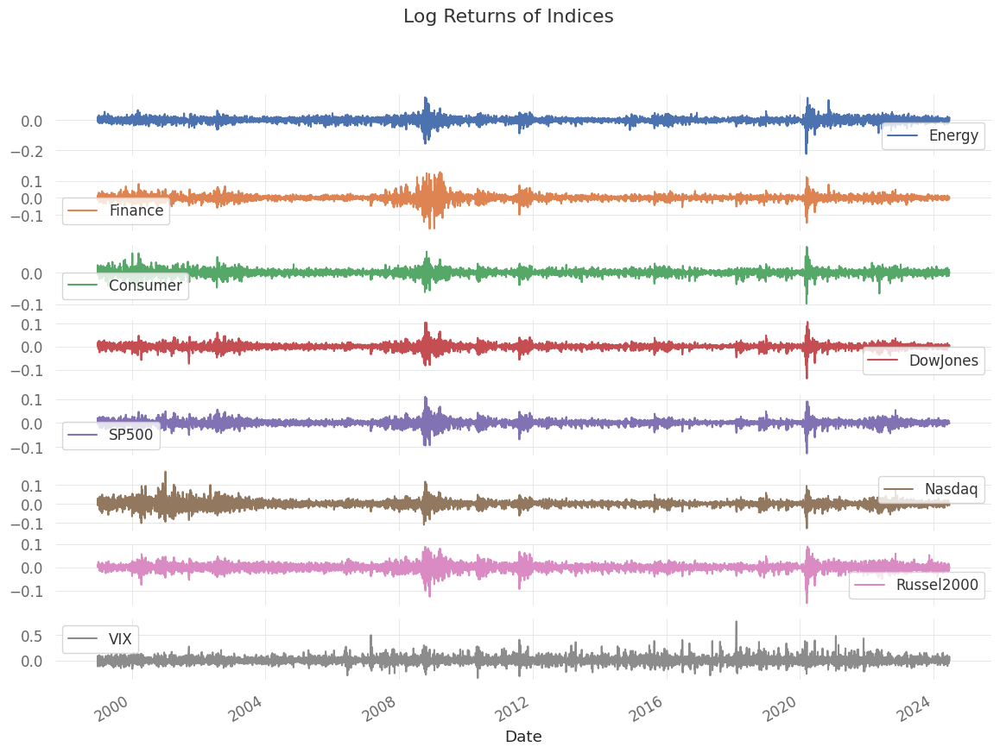

In [65]:
# '''
# Plotting Log return of selected indeces together
# '''

# data = yf.download(list(tickers.keys()), start='1927-01-01', end='2023-01-01')['Adj Close']
# data.columns = [tickers[ticker] for ticker in idx_daily.columns]
# log_returns = np.log1p(data.pct_change()).dropna()s
idx_daily.plot(subplots=True, figsize=(14, 10), title="Log Returns of Indices")
plt.show()

              Energy   Finance  Consumer  DowJones     SP500    Nasdaq  \
Energy      1.000000  0.582664  0.452452  0.676292  0.670972  0.432670   
Finance     0.582664  1.000000  0.584131  0.838402  0.847509  0.611975   
Consumer    0.452452  0.584131  1.000000  0.733902  0.704208  0.470840   
DowJones    0.676292  0.838402  0.733902  1.000000  0.962611  0.761614   
SP500       0.670972  0.847509  0.704208  0.962611  1.000000  0.857193   
Nasdaq      0.432670  0.611975  0.470840  0.761614  0.857193  1.000000   
Russel2000  0.641700  0.778982  0.550867  0.836040  0.883664  0.779080   
VIX        -0.507891 -0.594586 -0.527276 -0.699276 -0.730223 -0.623867   

            Russel2000       VIX  
Energy        0.641700 -0.507891  
Finance       0.778982 -0.594586  
Consumer      0.550867 -0.527276  
DowJones      0.836040 -0.699276  
SP500         0.883664 -0.730223  
Nasdaq        0.779080 -0.623867  
Russel2000    1.000000 -0.669932  
VIX          -0.669932  1.000000  


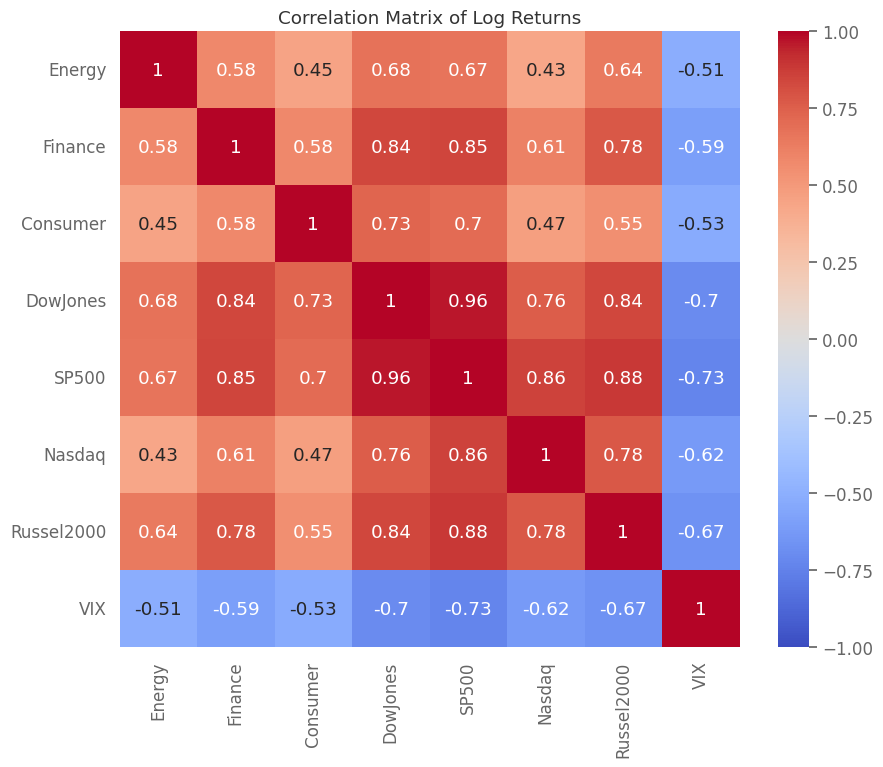

In [66]:
'''
Correlation among different indeces
'''

correlation_matrix = idx_daily.corr()
print(correlation_matrix)
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix of Log Returns')
plt.show()

[*********************100%%**********************]  8 of 8 completed


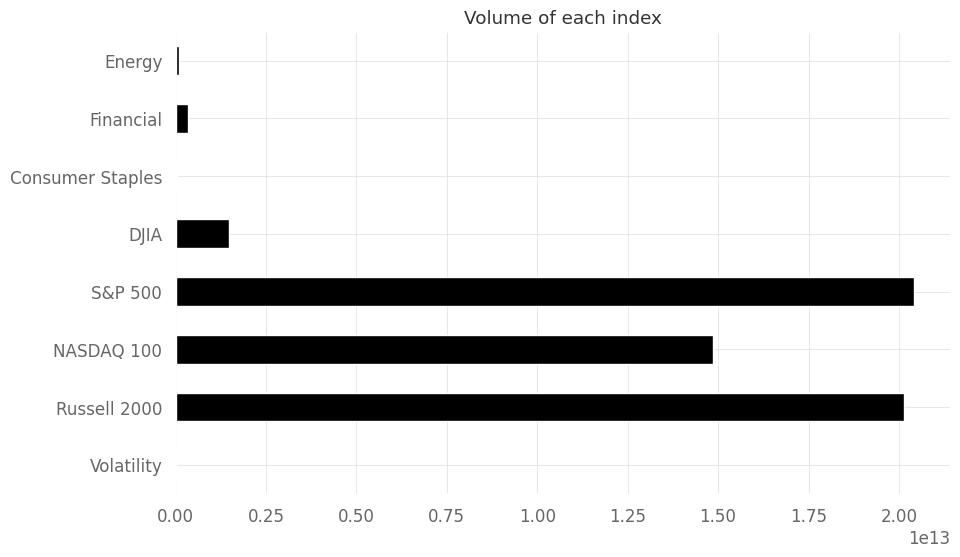

In [67]:
'''
Plotting volume of data
'''

tickers = {
    '^GSPC': 'S&P 500',
    '^DJI': 'DJIA',
    '^NDX': 'NASDAQ 100',
    '^RUT': 'Russell 2000',
    'XLE': 'Energy',
    'XLF': 'Financial',
    'XLP': 'Consumer Staples',
    '^VIX': 'Volatility'
}

vol_data = yf.download(list(tickers.keys()), start='1927-01-01', end='2023-01-01')['Volume']
vol_data.columns = [tickers[ticker] for ticker in vol_data.columns]
ax = vol_data.sum().plot(kind='barh', color='black', title='Volume of each index')
plt.gca().invert_yaxis()
plt.show()

### 3. Stationarity Test

In [68]:
'''
Stationarity Test
'''
# log_returns = log_returns.dropna()
def test_stationarity(timeseries):
    result = adfuller(timeseries)
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    for key, value in result[4].items():
        print(f'Critical Value {key}: {value}')

test_stationarity(idx_daily['SP500'])

ADF Statistic: -14.86779587431532
p-value: 1.6811255999213497e-27
Critical Value 1%: -3.4313753813457586
Critical Value 5%: -2.8619931292507905
Critical Value 10%: -2.567011197536384


#### In ADF test low p-value, suggests stationarity. We can see the trend is stationary. So no trend

### III.d. Homogeneity Test

In [69]:
'''
Pettitt Test
'''
pettitt_res = hg.pettitt_test(idx_daily['SP500'], alpha=0.05)
pettitt_res

Pettitt_Test(h=True, cp='2009-03-09', p=0.02715, U=431732.0, avg=mean(mu1=-0.0002245013790975669, mu2=0.0005428984018745571))

In [70]:
'''
Standard Normal Homogeinity Test
'''
snht_res = hg.snht_test(idx_daily['SP500'], sim=10000)
snht_res

SNHT_Test(h=False, cp='2009-03-09', p=0.4771, T=6.032205406823023, avg=mean(mu1=-0.0002245013790975669, mu2=0.0005428984018745571))

In [71]:
'''
Buishand's U Test
'''
buishand_res = hg.buishand_u_test(idx_daily['SP500'])
buishand_res

Buishand_U_Test(h=False, cp='2009-03-09', p=0.25415, U=0.20813640813423545, avg=mean(mu1=-0.0002245013790975669, mu2=0.0005428984018745571))

#### From all the homogeneity Test, Given the above results, where no significant change point was detected (h=False and a high p-value), we can reasonably conclude that there is no statistically significant shift in the mean of the time series at the tested point. This suggests that your time series is likely homogeneous with respect to its mean over the period analyzed

### 4. Trend Analysis

In [72]:
'''
Checking Linear Trend
'''

time = np.arange(len(idx_daily['SP500']))
X = sm.add_constant(time)  # Add constant for intercept
model = sm.OLS(idx_daily['SP500'], X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  SP500   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.780
Date:                Mon, 24 Jun 2024   Prob (F-statistic):              0.182
Time:                        03:28:20   Log-Likelihood:                 19131.
No. Observations:                6414   AIC:                        -3.826e+04
Df Residuals:                    6412   BIC:                        -3.825e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0001      0.000     -0.385      0.7

#### Slope is not significant. P value of constant is also not significant. Also,  So we can say there is no linear trend.

In [73]:
'''
Checking Plolynomial Trend
'''

poly_time = np.column_stack((time, time**2))
X_poly = sm.add_constant(poly_time)
model_poly = sm.OLS(idx_daily['SP500'], X_poly).fit()
print(model_poly.summary())

                            OLS Regression Results                            
Dep. Variable:                  SP500   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.000
Method:                 Least Squares   F-statistic:                    0.8904
Date:                Mon, 24 Jun 2024   Prob (F-statistic):              0.411
Time:                        03:28:20   Log-Likelihood:                 19131.
No. Observations:                6414   AIC:                        -3.826e+04
Df Residuals:                    6411   BIC:                        -3.824e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.0001      0.000     -0.235      0.8

#### Slope is not significant. So we can say there is no quadratic trend trend


### 5. EDA of Technical indicators

| Category   | Technical Indicator                     | Calculation Method                                                                                  | Usage                                                                                                    |
|------------|------------------------------------------|-----------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------------------------|
| Trend      | Simple Moving Average (SMA)              | Simple Moving Average (SMA) formula: SMA = (P1 + P2 + ... + Pn) / n, where Pn is the price on day n | Reflects the average price over a specified period, used to identify trends and support/resistance levels.|
| Trend      | Exponential Moving Average (EMA)         | EMA = (Current Price - Previous EMA) * 2 / (Days + 1) + Previous EMA                                | More sensitive to recent price changes than SMA, used to identify trends.                                |
| Trend      | Moving Average Convergence Divergence (MACD) | MACD = 12-day EMA - 26-day EMA Signal Line = 9-day EMA of MACD                                      | Used to identify changes in the strength, direction, momentum, and duration of a trend.                  |
| Momentum   | Relative Strength Index (RSI)            | RSI = 100 - [100 / (1 + RS)], where RS = Average Gain / Average Loss                                | Measures the speed and change of price movements, used to identify overbought or oversold conditions.    |
| Volatility | Bollinger Bands (BB)                     | Upper Band = SMA + (Standard Deviation * n) Lower Band = SMA - (Standard Deviation * n)             | Reflects the volatility range and potential support/resistance levels by forming bands around a moving average.|
| Volatility | Average True Range (ATR)                 | ATR = [(Previous ATR * (n - 1)) + TR] / n, where TR = max(Current High - Current Low, Current High - Previous Close, Previous Close - Current Low) | Measures the degree of price volatility, used to assess market volatility.                               |


[*********************100%%**********************]  1 of 1 completed


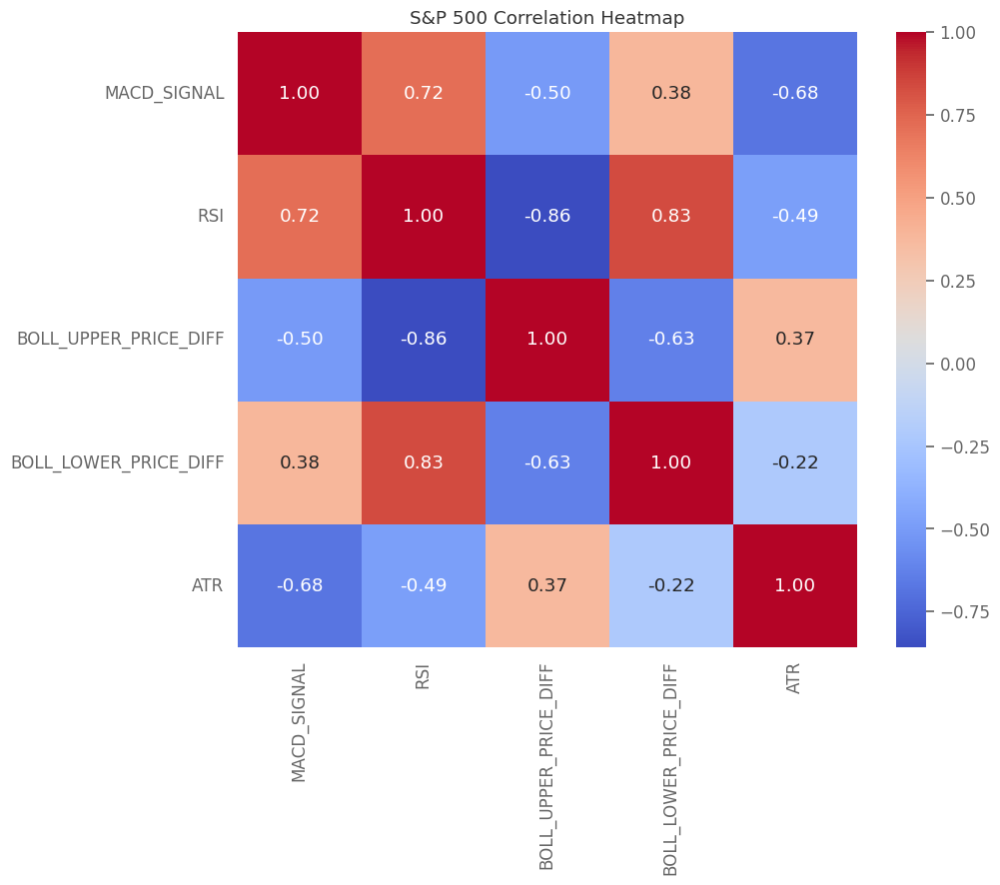

In [74]:
# Download data and calculate correlation matrix of direct indication lines
ticker = '^GSPC'
data = yf.download(ticker, start="2023-01-01", end="2024-01-01")

data['RSI'] = ta.momentum.RSIIndicator(data['Close']).rsi()

macd = ta.trend.MACD(data['Close'])
data['MACD_DIFF'] = macd.macd_diff()
data['MACD_SIGNAL'] = macd.macd_signal()

bollinger = ta.volatility.BollingerBands(data['Close'])
data['PRICE_BOLL_LOW'] = bollinger.bollinger_lband()
data['BOLL_WIDTH'] = bollinger.bollinger_wband()
data['PRICE_BOLL_HIGH'] = bollinger.bollinger_hband()


data['BOLL_UPPER_PRICE_DIFF'] = data['PRICE_BOLL_HIGH'] - data['Close']
data['BOLL_LOWER_PRICE_DIFF'] = data['Close'] - data['PRICE_BOLL_LOW']


adx = ta.trend.ADXIndicator(data['High'], data['Low'], data['Close'])
data['ADX'] = adx.adx()

atr = ta.volatility.AverageTrueRange(data['High'], data['Low'], data['Close'])
data['ATR'] = atr.average_true_range()

data.dropna(inplace=True)


correlation_matrix = data[[ 'MACD_SIGNAL','RSI','BOLL_UPPER_PRICE_DIFF', 'BOLL_LOWER_PRICE_DIFF', 'ATR']].corr()



plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('S&P 500 Correlation Heatmap')
plt.show()


### IV. Model Building

#### 1. LSTM

In [75]:
# Download data
ticker = '^GSPC'
original = yf.download(ticker, start='2008-01-01', end='2023-12-31', progress=False)

# Create a new DataFrame with selected columns
data = original[['Adj Close', 'Volume', 'High', 'Low']].copy()
data.rename(columns={'Adj Close': 'Close'}, inplace=True)

# Calculate moving averages
data.loc[:, 'MA5'] = data['Close'].rolling(window=5).mean()
data.loc[:, 'MA10'] = data['Close'].rolling(window=10).mean()
data.loc[:, 'MA20'] = data['Close'].rolling(window=20).mean()
data.loc[:, 'MA60'] = data['Close'].rolling(window=60).mean()
data.loc[:, 'MA120'] = data['Close'].rolling(window=120).mean()

# Calculate volume moving averages
data.loc[:, 'MA5_Volume'] = data['Volume'].rolling(window=5).mean()
data.loc[:, 'MA10_Volume'] = data['Volume'].rolling(window=10).mean()
data.loc[:, 'MA20_Volume'] = data['Volume'].rolling(window=20).mean()

# Calculate Bollinger Bands
data.loc[:, 'BB_High'] = data['Close'].rolling(window=20).mean() + 2 * data['Close'].rolling(window=20).std()
data.loc[:, 'BB_Low'] = data['Close'].rolling(window=20).mean() - 2 * data['Close'].rolling(window=20).std()
data.loc[:, 'BB_High_Diff'] = data['BB_High'] - data['Close']
data.loc[:, 'BB_Low_Diff'] = data['BB_Low'] - data['Close']

# Calculate MACD
macd = MACD(data['Close'])
data.loc[:, 'MACD'] = macd.macd()
data.loc[:, 'MACD_Signal'] = macd.macd_signal()
data.loc[:, 'MACD_Diff'] = macd.macd_diff()

# Calculate RSI
rsi = RSIIndicator(data['Close'])
data.loc[:, 'RSI'] = rsi.rsi()

# Calculate ADX
adx = ADXIndicator(data['High'], data['Low'], data['Close'])
data.loc[:, 'ADX'] = adx.adx()
data.loc[:, 'ADXR'] = adx.adx_neg()

data.dropna(inplace=True)


In [76]:
# Build CNN-LSTM model

def create_model(trial, input_shape):
    model = Sequential()
    # Conv1D layer
    num_filters = trial.suggest_int('num_filters', 32, 128, step=32)
    kernel_size = trial.suggest_int('kernel_size', 2, 5)
    model.add(Conv1D(filters=num_filters, kernel_size=kernel_size, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))

    # LSTM layers
    lstm_units = trial.suggest_int('lstm_units', 20, 100, step=10)
    num_lstm_layers = trial.suggest_int('num_lstm_layers', 1, 3)
    for _ in range(num_lstm_layers - 1):
        model.add(LSTM(lstm_units, return_sequences=True))
    model.add(LSTM(lstm_units))

    # Dense layer
    model.add(Dense(1))

    # Compile model
    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')

    return model

time_step = 20
train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]
X_train, y_train = create_dataset(train_data, time_step)
X_test, y_test = create_dataset(test_data, time_step)
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

def objective(trial):
    model = create_model(trial, (time_step, X_train.shape[2]))

    # Callbacks
    checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', save_best_only=True, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)
    pruning_callback = TFKerasPruningCallback(trial, 'val_loss')

    history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test),
                        verbose=1, callbacks=[checkpoint, early_stopping, pruning_callback])

    val_loss = min(history.history['val_loss'])
    return val_loss

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Number of finished trials:', len(study.trials))
print('Best trial:')
trial = study.best_trial

print('  Value:', trial.value)
print('  Params:')
for key, value in trial.params.items():
    print(f'    {key}: {value}')

[I 2024-06-24 03:28:20,919] A new study created in memory with name: no-name-92f3c8c0-3d90-4c2a-bfb9-3aa502ab946d


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0356
Epoch 1: val_loss improved from inf to 0.08544, saving model to best_model.h5
49/49 [==============================] - 10s 60ms/step - loss: 0.0347 - val_loss: 0.0854
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0015
Epoch 2: val_loss improved from 0.08544 to 0.00669, saving model to best_model.h5
49/49 [==============================] - 2s 33ms/step - loss: 0.0015 - val_loss: 0.0067
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 3.4528e-04
Epoch 3: val_loss improved from 0.00669 to 0.00439, saving model to best_model.h5
49/49 [==============================] - 2s 33ms/step - loss: 3.3953e-04 - val_loss: 0.0044
Epoch 4/50
49/49 [==============================] - ETA: 0s - loss: 2.7309e-04
Epoch 4: val_loss improved from 0.00439 to 0.00340, saving model to best_model.h5
49/49 [==============================] - 2s 34ms/step - loss: 2.7309e-04 - val_loss: 0.0034
Epoch 5

[I 2024-06-24 03:29:34,950] Trial 0 finished with value: 0.001446981797926128 and parameters: {'num_filters': 128, 'kernel_size': 3, 'lstm_units': 50, 'num_lstm_layers': 3, 'learning_rate': 0.00018861217847854846}. Best is trial 0 with value: 0.001446981797926128.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.1162
Epoch 1: val_loss improved from inf to 0.69665, saving model to best_model.h5
49/49 [==============================] - 9s 62ms/step - loss: 0.1157 - val_loss: 0.6967
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0959
Epoch 2: val_loss improved from 0.69665 to 0.62855, saving model to best_model.h5
49/49 [==============================] - 2s 31ms/step - loss: 0.0960 - val_loss: 0.6286
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 0.0763
Epoch 3: val_loss improved from 0.62855 to 0.55273, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 0.0767 - val_loss: 0.5527
Epoch 4/50
48/49 [============================>.] - ETA: 0s - loss: 0.0581
Epoch 4: val_loss improved from 0.55273 to 0.46817, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 0.0578 - val_loss: 0.4682
Epoch 5/50
46/49 [======

[I 2024-06-24 03:31:18,086] Trial 1 finished with value: 0.015865160152316093 and parameters: {'num_filters': 64, 'kernel_size': 3, 'lstm_units': 20, 'num_lstm_layers': 3, 'learning_rate': 2.1307190602587954e-05}. Best is trial 0 with value: 0.001446981797926128.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0209
Epoch 1: val_loss improved from inf to 0.01022, saving model to best_model.h5
49/49 [==============================] - 7s 53ms/step - loss: 0.0202 - val_loss: 0.0102
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 5.5263e-04
Epoch 2: val_loss improved from 0.01022 to 0.00632, saving model to best_model.h5
49/49 [==============================] - 2s 35ms/step - loss: 5.4482e-04 - val_loss: 0.0063
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 3.3115e-04
Epoch 3: val_loss improved from 0.00632 to 0.00309, saving model to best_model.h5
49/49 [==============================] - 2s 35ms/step - loss: 3.2907e-04 - val_loss: 0.0031
Epoch 4/50
48/49 [============================>.] - ETA: 0s - loss: 2.7439e-04
Epoch 4: val_loss improved from 0.00309 to 0.00124, saving model to best_model.h5
49/49 [==============================] - 2s 41ms/step - loss: 2.7467e-04 - val_loss: 0.0012


[I 2024-06-24 03:32:29,851] Trial 2 finished with value: 0.0003885876212734729 and parameters: {'num_filters': 64, 'kernel_size': 4, 'lstm_units': 100, 'num_lstm_layers': 2, 'learning_rate': 0.003848040338907019}. Best is trial 2 with value: 0.0003885876212734729.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0084
Epoch 1: val_loss improved from inf to 0.03398, saving model to best_model.h5
49/49 [==============================] - 9s 66ms/step - loss: 0.0084 - val_loss: 0.0340
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 4.3674e-04
Epoch 2: val_loss improved from 0.03398 to 0.01319, saving model to best_model.h5
49/49 [==============================] - 1s 29ms/step - loss: 4.4349e-04 - val_loss: 0.0132
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 2.7514e-04
Epoch 3: val_loss improved from 0.01319 to 0.00696, saving model to best_model.h5
49/49 [==============================] - 1s 21ms/step - loss: 2.7758e-04 - val_loss: 0.0070
Epoch 4/50
46/49 [===========================>..] - ETA: 0s - loss: 3.0099e-04
Epoch 4: val_loss improved from 0.00696 to 0.00658, saving model to best_model.h5
49/49 [==============================] - 1s 21ms/step - loss: 2.9654e-04 - val_loss: 0.0066


[I 2024-06-24 03:33:21,559] Trial 3 finished with value: 0.001957777189090848 and parameters: {'num_filters': 128, 'kernel_size': 2, 'lstm_units': 20, 'num_lstm_layers': 3, 'learning_rate': 0.005607619954491343}. Best is trial 2 with value: 0.0003885876212734729.


Epoch 1/50
46/49 [===========================>..] - ETA: 0s - loss: 0.0555
Epoch 1: val_loss improved from inf to 0.13959, saving model to best_model.h5
49/49 [==============================] - 9s 46ms/step - loss: 0.0533 - val_loss: 0.1396
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 0.0038
Epoch 2: val_loss improved from 0.13959 to 0.00831, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 0.0038 - val_loss: 0.0083
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 3.6045e-04
Epoch 3: val_loss improved from 0.00831 to 0.00758, saving model to best_model.h5
49/49 [==============================] - 1s 20ms/step - loss: 3.6265e-04 - val_loss: 0.0076
Epoch 4/50
48/49 [============================>.] - ETA: 0s - loss: 3.2438e-04
Epoch 4: val_loss did not improve from 0.00758
49/49 [==============================] - 1s 19ms/step - loss: 3.2249e-04 - val_loss: 0.0092
Epoch 5/50
49/49 [=========================

[I 2024-06-24 03:35:00,874] Trial 4 finished with value: 0.0030670003034174442 and parameters: {'num_filters': 32, 'kernel_size': 3, 'lstm_units': 30, 'num_lstm_layers': 3, 'learning_rate': 0.000276424741677867}. Best is trial 2 with value: 0.0003885876212734729.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.1188
Epoch 1: val_loss improved from inf to 0.72107, saving model to best_model.h5


[I 2024-06-24 03:35:04,981] Trial 5 pruned. Trial was pruned at epoch 0.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0098
Epoch 1: val_loss improved from inf to 0.00947, saving model to best_model.h5
49/49 [==============================] - 8s 49ms/step - loss: 0.0098 - val_loss: 0.0095
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 3.8866e-04
Epoch 2: val_loss did not improve from 0.00947


[I 2024-06-24 03:35:15,545] Trial 6 pruned. Trial was pruned at epoch 1.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.1077
Epoch 1: val_loss improved from inf to 0.41136, saving model to best_model.h5


[I 2024-06-24 03:35:23,278] Trial 7 pruned. Trial was pruned at epoch 0.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0038
Epoch 1: val_loss improved from inf to 0.01222, saving model to best_model.h5
49/49 [==============================] - 3s 22ms/step - loss: 0.0038 - val_loss: 0.0122
Epoch 2/50
44/49 [=========================>....] - ETA: 0s - loss: 2.4536e-04
Epoch 2: val_loss improved from 0.01222 to 0.00970, saving model to best_model.h5


[I 2024-06-24 03:35:27,566] Trial 8 pruned. Trial was pruned at epoch 1.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0059
Epoch 1: val_loss improved from inf to 0.00877, saving model to best_model.h5
49/49 [==============================] - 8s 23ms/step - loss: 0.0058 - val_loss: 0.0088
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 2.7157e-04
Epoch 2: val_loss improved from 0.00877 to 0.00541, saving model to best_model.h5
49/49 [==============================] - 0s 10ms/step - loss: 2.6817e-04 - val_loss: 0.0054
Epoch 3/50
44/49 [=========================>....] - ETA: 0s - loss: 1.8065e-04
Epoch 3: val_loss improved from 0.00541 to 0.00434, saving model to best_model.h5
49/49 [==============================] - 1s 11ms/step - loss: 1.8268e-04 - val_loss: 0.0043
Epoch 4/50
47/49 [===========================>..] - ETA: 0s - loss: 1.5572e-04
Epoch 4: val_loss improved from 0.00434 to 0.00307, saving model to best_model.h5
49/49 [==============================] - 1s 10ms/step - loss: 1.5365e-04 - val_loss: 0.0031


[I 2024-06-24 03:35:54,525] Trial 9 finished with value: 0.0008280030451714993 and parameters: {'num_filters': 32, 'kernel_size': 4, 'lstm_units': 30, 'num_lstm_layers': 1, 'learning_rate': 0.0018525559581323825}. Best is trial 2 with value: 0.0003885876212734729.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0702
Epoch 1: val_loss improved from inf to 0.03422, saving model to best_model.h5
49/49 [==============================] - 8s 56ms/step - loss: 0.0702 - val_loss: 0.0342
Epoch 2/50
49/49 [==============================] - ETA: 0s - loss: 6.1375e-04
Epoch 2: val_loss improved from 0.03422 to 0.00769, saving model to best_model.h5


[I 2024-06-24 03:36:05,819] Trial 10 pruned. Trial was pruned at epoch 1.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0091
Epoch 1: val_loss improved from inf to 0.00793, saving model to best_model.h5
49/49 [==============================] - 4s 29ms/step - loss: 0.0091 - val_loss: 0.0079
Epoch 2/50
49/49 [==============================] - ETA: 0s - loss: 3.2894e-04
Epoch 2: val_loss improved from 0.00793 to 0.00198, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 3.2894e-04 - val_loss: 0.0020
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 2.0263e-04
Epoch 3: val_loss did not improve from 0.00198
49/49 [==============================] - 1s 28ms/step - loss: 2.0249e-04 - val_loss: 0.0021
Epoch 4/50
47/49 [===========================>..] - ETA: 0s - loss: 1.6867e-04
Epoch 4: val_loss improved from 0.00198 to 0.00137, saving model to best_model.h5
49/49 [==============================] - 2s 35ms/step - loss: 1.6737e-04 - val_loss: 0.0014
Epoch 5/50
47/49 [=================

[I 2024-06-24 03:36:34,891] Trial 11 finished with value: 0.0003590807900764048 and parameters: {'num_filters': 32, 'kernel_size': 5, 'lstm_units': 100, 'num_lstm_layers': 1, 'learning_rate': 0.0022119547083798664}. Best is trial 11 with value: 0.0003590807900764048.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0115
Epoch 1: val_loss improved from inf to 0.00528, saving model to best_model.h5
49/49 [==============================] - 7s 52ms/step - loss: 0.0112 - val_loss: 0.0053
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 3.6926e-04
Epoch 2: val_loss did not improve from 0.00528
49/49 [==============================] - 2s 33ms/step - loss: 3.6620e-04 - val_loss: 0.0067
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 2.6646e-04
Epoch 3: val_loss did not improve from 0.00528


[I 2024-06-24 03:37:00,685] Trial 12 pruned. Trial was pruned at epoch 2.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0076
Epoch 1: val_loss improved from inf to 0.00429, saving model to best_model.h5
49/49 [==============================] - 4s 29ms/step - loss: 0.0075 - val_loss: 0.0043
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 2.0460e-04
Epoch 2: val_loss improved from 0.00429 to 0.00307, saving model to best_model.h5
49/49 [==============================] - 1s 18ms/step - loss: 2.0411e-04 - val_loss: 0.0031
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 1.3931e-04
Epoch 3: val_loss did not improve from 0.00307
49/49 [==============================] - 1s 17ms/step - loss: 1.3872e-04 - val_loss: 0.0035
Epoch 4/50
48/49 [============================>.] - ETA: 0s - loss: 1.1336e-04
Epoch 4: val_loss improved from 0.00307 to 0.00213, saving model to best_model.h5
49/49 [==============================] - 1s 18ms/step - loss: 1.1338e-04 - val_loss: 0.0021
Epoch 5/50
46/49 [=================

[I 2024-06-24 03:37:49,212] Trial 13 finished with value: 0.0006486078491434455 and parameters: {'num_filters': 64, 'kernel_size': 5, 'lstm_units': 80, 'num_lstm_layers': 1, 'learning_rate': 0.0016651400178807842}. Best is trial 11 with value: 0.0003590807900764048.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0111
Epoch 1: val_loss improved from inf to 0.01181, saving model to best_model.h5
49/49 [==============================] - 6s 54ms/step - loss: 0.0111 - val_loss: 0.0118
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 3.1425e-04
Epoch 2: val_loss improved from 0.01181 to 0.00701, saving model to best_model.h5


[I 2024-06-24 03:37:59,389] Trial 14 pruned. Trial was pruned at epoch 1.


Epoch 1/50
46/49 [===========================>..] - ETA: 0s - loss: 0.0304
Epoch 1: val_loss improved from inf to 0.00800, saving model to best_model.h5
49/49 [==============================] - 4s 26ms/step - loss: 0.0289 - val_loss: 0.0080
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 9.1715e-04
Epoch 2: val_loss improved from 0.00800 to 0.00653, saving model to best_model.h5


[I 2024-06-24 03:38:04,388] Trial 15 pruned. Trial was pruned at epoch 1.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0688
Epoch 1: val_loss improved from inf to 0.01995, saving model to best_model.h5
49/49 [==============================] - 7s 68ms/step - loss: 0.0681 - val_loss: 0.0199
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 7.5100e-04
Epoch 2: val_loss improved from 0.01995 to 0.00922, saving model to best_model.h5


[I 2024-06-24 03:38:14,523] Trial 16 pruned. Trial was pruned at epoch 1.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0331
Epoch 1: val_loss improved from inf to 0.12334, saving model to best_model.h5


[I 2024-06-24 03:38:23,040] Trial 17 pruned. Trial was pruned at epoch 0.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0102
Epoch 1: val_loss improved from inf to 0.01026, saving model to best_model.h5
49/49 [==============================] - 9s 51ms/step - loss: 0.0099 - val_loss: 0.0103
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 2.9279e-04
Epoch 2: val_loss improved from 0.01026 to 0.00484, saving model to best_model.h5
49/49 [==============================] - 2s 31ms/step - loss: 2.8784e-04 - val_loss: 0.0048
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 2.3293e-04
Epoch 3: val_loss did not improve from 0.00484


[I 2024-06-24 03:38:36,690] Trial 18 pruned. Trial was pruned at epoch 2.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0082
Epoch 1: val_loss improved from inf to 0.01225, saving model to best_model.h5
49/49 [==============================] - 7s 44ms/step - loss: 0.0082 - val_loss: 0.0122
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 3.0629e-04
Epoch 2: val_loss improved from 0.01225 to 0.00982, saving model to best_model.h5


[I 2024-06-24 03:38:45,810] Trial 19 pruned. Trial was pruned at epoch 1.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0292
Epoch 1: val_loss improved from inf to 0.02707, saving model to best_model.h5


[I 2024-06-24 03:38:51,062] Trial 20 pruned. Trial was pruned at epoch 0.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0091
Epoch 1: val_loss improved from inf to 0.00514, saving model to best_model.h5
49/49 [==============================] - 5s 44ms/step - loss: 0.0090 - val_loss: 0.0051
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 2.1712e-04
Epoch 2: val_loss improved from 0.00514 to 0.00180, saving model to best_model.h5
49/49 [==============================] - 1s 17ms/step - loss: 2.1922e-04 - val_loss: 0.0018
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 1.4376e-04
Epoch 3: val_loss improved from 0.00180 to 0.00137, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 1.4324e-04 - val_loss: 0.0014
Epoch 4/50
49/49 [==============================] - ETA: 0s - loss: 1.2999e-04
Epoch 4: val_loss improved from 0.00137 to 0.00098, saving model to best_model.h5
49/49 [==============================] - 1s 16ms/step - loss: 1.2999e-04 - val_loss: 9.7927e

[I 2024-06-24 03:39:28,197] Trial 21 finished with value: 0.0003500068560242653 and parameters: {'num_filters': 64, 'kernel_size': 5, 'lstm_units': 80, 'num_lstm_layers': 1, 'learning_rate': 0.0015999544873049102}. Best is trial 21 with value: 0.0003500068560242653.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0099
Epoch 1: val_loss improved from inf to 0.00409, saving model to best_model.h5
49/49 [==============================] - 4s 29ms/step - loss: 0.0099 - val_loss: 0.0041
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 2.6756e-04
Epoch 2: val_loss improved from 0.00409 to 0.00298, saving model to best_model.h5
49/49 [==============================] - 1s 18ms/step - loss: 2.6721e-04 - val_loss: 0.0030
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 2.0588e-04
Epoch 3: val_loss improved from 0.00298 to 0.00227, saving model to best_model.h5
49/49 [==============================] - 1s 17ms/step - loss: 2.0514e-04 - val_loss: 0.0023
Epoch 4/50
48/49 [============================>.] - ETA: 0s - loss: 1.7089e-04
Epoch 4: val_loss did not improve from 0.00227
49/49 [==============================] - 1s 21ms/step - loss: 1.7021e-04 - val_loss: 0.0026
Epoch 5/50
47/49 [=================

[I 2024-06-24 03:40:00,425] Trial 22 finished with value: 0.0004909554263576865 and parameters: {'num_filters': 64, 'kernel_size': 5, 'lstm_units': 90, 'num_lstm_layers': 1, 'learning_rate': 0.0013530564229130124}. Best is trial 21 with value: 0.0003500068560242653.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0184
Epoch 1: val_loss improved from inf to 0.00688, saving model to best_model.h5
49/49 [==============================] - 5s 36ms/step - loss: 0.0178 - val_loss: 0.0069
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 2.7977e-04
Epoch 2: val_loss improved from 0.00688 to 0.00262, saving model to best_model.h5
49/49 [==============================] - 1s 13ms/step - loss: 2.7436e-04 - val_loss: 0.0026
Epoch 3/50
45/49 [==========================>...] - ETA: 0s - loss: 1.6387e-04
Epoch 3: val_loss improved from 0.00262 to 0.00121, saving model to best_model.h5
49/49 [==============================] - 1s 14ms/step - loss: 1.6519e-04 - val_loss: 0.0012
Epoch 4/50
49/49 [==============================] - ETA: 0s - loss: 1.6035e-04
Epoch 4: val_loss improved from 0.00121 to 0.00083, saving model to best_model.h5
49/49 [==============================] - 1s 14ms/step - loss: 1.6035e-04 - val_loss: 8.3234e

[I 2024-06-24 03:40:41,000] Trial 23 finished with value: 0.0002454846980981529 and parameters: {'num_filters': 64, 'kernel_size': 5, 'lstm_units': 70, 'num_lstm_layers': 1, 'learning_rate': 0.0038386705471582477}. Best is trial 23 with value: 0.0002454846980981529.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0041
Epoch 1: val_loss improved from inf to 0.00478, saving model to best_model.h5
49/49 [==============================] - 5s 44ms/step - loss: 0.0039 - val_loss: 0.0048
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 2.2193e-04
Epoch 2: val_loss improved from 0.00478 to 0.00347, saving model to best_model.h5
49/49 [==============================] - 1s 17ms/step - loss: 2.1810e-04 - val_loss: 0.0035
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 1.5240e-04
Epoch 3: val_loss improved from 0.00347 to 0.00113, saving model to best_model.h5
49/49 [==============================] - 1s 17ms/step - loss: 1.5198e-04 - val_loss: 0.0011
Epoch 4/50
47/49 [===========================>..] - ETA: 0s - loss: 1.1351e-04
Epoch 4: val_loss did not improve from 0.00113
49/49 [==============================] - 1s 17ms/step - loss: 1.1500e-04 - val_loss: 0.0012
Epoch 5/50
49/49 [=================

[I 2024-06-24 03:41:13,901] Trial 24 finished with value: 0.00026611832436174154 and parameters: {'num_filters': 96, 'kernel_size': 5, 'lstm_units': 70, 'num_lstm_layers': 1, 'learning_rate': 0.0005195688884818341}. Best is trial 23 with value: 0.0002454846980981529.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0123
Epoch 1: val_loss improved from inf to 0.00833, saving model to best_model.h5
49/49 [==============================] - 4s 28ms/step - loss: 0.0122 - val_loss: 0.0083
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 3.2618e-04
Epoch 2: val_loss improved from 0.00833 to 0.00535, saving model to best_model.h5


[I 2024-06-24 03:41:30,531] Trial 25 pruned. Trial was pruned at epoch 1.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0191
Epoch 1: val_loss improved from inf to 0.00141, saving model to best_model.h5
49/49 [==============================] - 4s 30ms/step - loss: 0.0189 - val_loss: 0.0014
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 3.4616e-04
Epoch 2: val_loss did not improve from 0.00141
49/49 [==============================] - 1s 18ms/step - loss: 3.4366e-04 - val_loss: 0.0025
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 1.7809e-04
Epoch 3: val_loss did not improve from 0.00141
49/49 [==============================] - 1s 19ms/step - loss: 1.7719e-04 - val_loss: 0.0022
Epoch 4/50
49/49 [==============================] - ETA: 0s - loss: 1.4642e-04
Epoch 4: val_loss did not improve from 0.00141
49/49 [==============================] - 1s 30ms/step - loss: 1.4642e-04 - val_loss: 0.0025
Epoch 5/50
47/49 [===========================>..] - ETA: 0s - loss: 1.2794e-04
Epoch 5: val_loss did not 

[I 2024-06-24 03:41:42,095] Trial 26 pruned. Trial was pruned at epoch 6.


Epoch 1/50
45/49 [==========================>...] - ETA: 0s - loss: 0.0208
Epoch 1: val_loss improved from inf to 0.00755, saving model to best_model.h5
49/49 [==============================] - 3s 24ms/step - loss: 0.0193 - val_loss: 0.0076
Epoch 2/50
45/49 [==========================>...] - ETA: 0s - loss: 4.1228e-04
Epoch 2: val_loss improved from 0.00755 to 0.00402, saving model to best_model.h5
49/49 [==============================] - 1s 13ms/step - loss: 4.0708e-04 - val_loss: 0.0040
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 1.9733e-04
Epoch 3: val_loss improved from 0.00402 to 0.00313, saving model to best_model.h5
49/49 [==============================] - 1s 14ms/step - loss: 1.9733e-04 - val_loss: 0.0031
Epoch 4/50
46/49 [===========================>..] - ETA: 0s - loss: 1.3638e-04
Epoch 4: val_loss improved from 0.00313 to 0.00309, saving model to best_model.h5


[I 2024-06-24 03:41:47,879] Trial 27 pruned. Trial was pruned at epoch 3.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0245
Epoch 1: val_loss improved from inf to 0.02377, saving model to best_model.h5


[I 2024-06-24 03:41:52,382] Trial 28 pruned. Trial was pruned at epoch 0.


Epoch 1/50
46/49 [===========================>..] - ETA: 0s - loss: 0.0276
Epoch 1: val_loss improved from inf to 0.00123, saving model to best_model.h5
49/49 [==============================] - 5s 28ms/step - loss: 0.0262 - val_loss: 0.0012
Epoch 2/50
45/49 [==========================>...] - ETA: 0s - loss: 4.1988e-04
Epoch 2: val_loss did not improve from 0.00123
49/49 [==============================] - 1s 15ms/step - loss: 4.1411e-04 - val_loss: 0.0028
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 2.1046e-04
Epoch 3: val_loss did not improve from 0.00123
49/49 [==============================] - 1s 17ms/step - loss: 2.1046e-04 - val_loss: 0.0018
Epoch 4/50
46/49 [===========================>..] - ETA: 0s - loss: 1.7177e-04
Epoch 4: val_loss did not improve from 0.00123
49/49 [==============================] - 1s 16ms/step - loss: 1.7544e-04 - val_loss: 0.0022
Epoch 5/50
47/49 [===========================>..] - ETA: 0s - loss: 1.5260e-04
Epoch 5: val_loss did not 

[I 2024-06-24 03:42:04,467] Trial 29 pruned. Trial was pruned at epoch 7.


Epoch 1/50
45/49 [==========================>...] - ETA: 0s - loss: 0.0312
Epoch 1: val_loss improved from inf to 0.04103, saving model to best_model.h5


[I 2024-06-24 03:42:11,456] Trial 30 pruned. Trial was pruned at epoch 0.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0208
Epoch 1: val_loss improved from inf to 0.00906, saving model to best_model.h5


[I 2024-06-24 03:42:16,610] Trial 31 pruned. Trial was pruned at epoch 0.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0069
Epoch 1: val_loss improved from inf to 0.00281, saving model to best_model.h5
49/49 [==============================] - 5s 36ms/step - loss: 0.0066 - val_loss: 0.0028
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 2.8090e-04
Epoch 2: val_loss did not improve from 0.00281
49/49 [==============================] - 1s 12ms/step - loss: 2.8116e-04 - val_loss: 0.0034
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 1.9905e-04
Epoch 3: val_loss improved from 0.00281 to 0.00225, saving model to best_model.h5
49/49 [==============================] - 1s 14ms/step - loss: 1.9911e-04 - val_loss: 0.0022
Epoch 4/50
45/49 [==========================>...] - ETA: 0s - loss: 1.7170e-04
Epoch 4: val_loss improved from 0.00225 to 0.00176, saving model to best_model.h5
49/49 [==============================] - 1s 14ms/step - loss: 1.6728e-04 - val_loss: 0.0018
Epoch 5/50
49/49 [=================

[I 2024-06-24 03:42:52,485] Trial 32 finished with value: 0.00027931304066441953 and parameters: {'num_filters': 96, 'kernel_size': 5, 'lstm_units': 60, 'num_lstm_layers': 1, 'learning_rate': 0.0009934994821390586}. Best is trial 23 with value: 0.0002454846980981529.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0183
Epoch 1: val_loss improved from inf to 0.00761, saving model to best_model.h5
49/49 [==============================] - 3s 24ms/step - loss: 0.0183 - val_loss: 0.0076
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 3.6126e-04
Epoch 2: val_loss improved from 0.00761 to 0.00676, saving model to best_model.h5


[I 2024-06-24 03:43:06,401] Trial 33 pruned. Trial was pruned at epoch 1.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0081
Epoch 1: val_loss improved from inf to 0.00298, saving model to best_model.h5
49/49 [==============================] - 4s 30ms/step - loss: 0.0081 - val_loss: 0.0030
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 2.1435e-04
Epoch 2: val_loss improved from 0.00298 to 0.00233, saving model to best_model.h5
49/49 [==============================] - 1s 18ms/step - loss: 2.1237e-04 - val_loss: 0.0023
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 1.5379e-04
Epoch 3: val_loss improved from 0.00233 to 0.00177, saving model to best_model.h5
49/49 [==============================] - 1s 29ms/step - loss: 1.5280e-04 - val_loss: 0.0018
Epoch 4/50
49/49 [==============================] - ETA: 0s - loss: 1.3705e-04
Epoch 4: val_loss improved from 0.00177 to 0.00107, saving model to best_model.h5
49/49 [==============================] - 2s 34ms/step - loss: 1.3705e-04 - val_loss: 0.0011


[I 2024-06-24 03:43:18,440] Trial 34 pruned. Trial was pruned at epoch 6.


Epoch 1/50
46/49 [===========================>..] - ETA: 0s - loss: 0.0079
Epoch 1: val_loss improved from inf to 0.00350, saving model to best_model.h5
49/49 [==============================] - 3s 25ms/step - loss: 0.0075 - val_loss: 0.0035
Epoch 2/50
49/49 [==============================] - ETA: 0s - loss: 2.5972e-04
Epoch 2: val_loss improved from 0.00350 to 0.00258, saving model to best_model.h5
49/49 [==============================] - 1s 14ms/step - loss: 2.5972e-04 - val_loss: 0.0026
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 1.9142e-04
Epoch 3: val_loss did not improve from 0.00258
49/49 [==============================] - 1s 13ms/step - loss: 1.9142e-04 - val_loss: 0.0028
Epoch 4/50
48/49 [============================>.] - ETA: 0s - loss: 1.6854e-04
Epoch 4: val_loss improved from 0.00258 to 0.00179, saving model to best_model.h5
49/49 [==============================] - 1s 14ms/step - loss: 1.6769e-04 - val_loss: 0.0018
Epoch 5/50
45/49 [=================

[I 2024-06-24 03:43:58,329] Trial 35 finished with value: 0.0002842002722900361 and parameters: {'num_filters': 96, 'kernel_size': 5, 'lstm_units': 60, 'num_lstm_layers': 1, 'learning_rate': 0.0009649999982507895}. Best is trial 23 with value: 0.0002454846980981529.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0167
Epoch 1: val_loss improved from inf to 0.00549, saving model to best_model.h5
49/49 [==============================] - 6s 49ms/step - loss: 0.0162 - val_loss: 0.0055
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 4.7290e-04
Epoch 2: val_loss did not improve from 0.00549


[I 2024-06-24 03:44:11,190] Trial 36 pruned. Trial was pruned at epoch 1.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0109
Epoch 1: val_loss improved from inf to 0.00331, saving model to best_model.h5
49/49 [==============================] - 4s 28ms/step - loss: 0.0107 - val_loss: 0.0033
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 3.1528e-04
Epoch 2: val_loss improved from 0.00331 to 0.00209, saving model to best_model.h5
49/49 [==============================] - 1s 17ms/step - loss: 3.1370e-04 - val_loss: 0.0021
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 1.8184e-04
Epoch 3: val_loss improved from 0.00209 to 0.00168, saving model to best_model.h5
49/49 [==============================] - 1s 17ms/step - loss: 1.8122e-04 - val_loss: 0.0017
Epoch 4/50
47/49 [===========================>..] - ETA: 0s - loss: 1.4752e-04
Epoch 4: val_loss improved from 0.00168 to 0.00148, saving model to best_model.h5
49/49 [==============================] - 1s 17ms/step - loss: 1.4634e-04 - val_loss: 0.0015


[I 2024-06-24 03:44:20,367] Trial 37 pruned. Trial was pruned at epoch 6.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.1325
Epoch 1: val_loss improved from inf to 0.72142, saving model to best_model.h5


[I 2024-06-24 03:44:40,766] Trial 38 pruned. Trial was pruned at epoch 0.


Epoch 1/50
45/49 [==========================>...] - ETA: 0s - loss: 0.0129
Epoch 1: val_loss improved from inf to 0.00862, saving model to best_model.h5


[I 2024-06-24 03:44:45,921] Trial 39 pruned. Trial was pruned at epoch 0.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0092
Epoch 1: val_loss improved from inf to 0.01188, saving model to best_model.h5


[I 2024-06-24 03:44:53,915] Trial 40 pruned. Trial was pruned at epoch 0.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0072
Epoch 1: val_loss improved from inf to 0.00449, saving model to best_model.h5
49/49 [==============================] - 3s 26ms/step - loss: 0.0071 - val_loss: 0.0045
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 2.2978e-04
Epoch 2: val_loss improved from 0.00449 to 0.00409, saving model to best_model.h5


[I 2024-06-24 03:44:58,543] Trial 41 pruned. Trial was pruned at epoch 1.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0128
Epoch 1: val_loss improved from inf to 0.00182, saving model to best_model.h5
49/49 [==============================] - 5s 30ms/step - loss: 0.0124 - val_loss: 0.0018
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 2.1378e-04
Epoch 2: val_loss improved from 0.00182 to 0.00068, saving model to best_model.h5
49/49 [==============================] - 1s 18ms/step - loss: 2.1312e-04 - val_loss: 6.7731e-04
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 1.5339e-04
Epoch 3: val_loss did not improve from 0.00068
49/49 [==============================] - 1s 18ms/step - loss: 1.5501e-04 - val_loss: 7.8788e-04
Epoch 4/50
47/49 [===========================>..] - ETA: 0s - loss: 1.3155e-04
Epoch 4: val_loss improved from 0.00068 to 0.00063, saving model to best_model.h5
49/49 [==============================] - 1s 18ms/step - loss: 1.3071e-04 - val_loss: 6.2503e-04
Epoch 5/50
48/49 [=====

[I 2024-06-24 03:45:17,756] Trial 42 finished with value: 0.0005811088485643268 and parameters: {'num_filters': 64, 'kernel_size': 5, 'lstm_units': 80, 'num_lstm_layers': 1, 'learning_rate': 0.001036411289928883}. Best is trial 23 with value: 0.0002454846980981529.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0556
Epoch 1: val_loss improved from inf to 0.00429, saving model to best_model.h5
49/49 [==============================] - 4s 30ms/step - loss: 0.0556 - val_loss: 0.0043
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 3.5120e-04
Epoch 2: val_loss improved from 0.00429 to 0.00330, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 3.4394e-04 - val_loss: 0.0033
Epoch 3/50
47/49 [===========================>..] - ETA: 0s - loss: 1.9486e-04
Epoch 3: val_loss improved from 0.00330 to 0.00271, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 1.9388e-04 - val_loss: 0.0027
Epoch 4/50
47/49 [===========================>..] - ETA: 0s - loss: 1.5080e-04
Epoch 4: val_loss improved from 0.00271 to 0.00192, saving model to best_model.h5


[I 2024-06-24 03:45:24,674] Trial 43 pruned. Trial was pruned at epoch 3.


Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0062
Epoch 1: val_loss improved from inf to 0.00428, saving model to best_model.h5
49/49 [==============================] - 5s 36ms/step - loss: 0.0062 - val_loss: 0.0043
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 2.6540e-04
Epoch 2: val_loss improved from 0.00428 to 0.00375, saving model to best_model.h5


[I 2024-06-24 03:45:31,207] Trial 44 pruned. Trial was pruned at epoch 1.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0099
Epoch 1: val_loss improved from inf to 0.00921, saving model to best_model.h5


[I 2024-06-24 03:45:35,116] Trial 45 pruned. Trial was pruned at epoch 0.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0165
Epoch 1: val_loss improved from inf to 0.01021, saving model to best_model.h5


[I 2024-06-24 03:45:40,079] Trial 46 pruned. Trial was pruned at epoch 0.


Epoch 1/50
46/49 [===========================>..] - ETA: 0s - loss: 0.0166
Epoch 1: val_loss improved from inf to 0.00274, saving model to best_model.h5
49/49 [==============================] - 5s 32ms/step - loss: 0.0157 - val_loss: 0.0027
Epoch 2/50
46/49 [===========================>..] - ETA: 0s - loss: 2.5273e-04
Epoch 2: val_loss did not improve from 0.00274
49/49 [==============================] - 1s 20ms/step - loss: 2.4418e-04 - val_loss: 0.0029
Epoch 3/50
48/49 [============================>.] - ETA: 0s - loss: 1.5610e-04
Epoch 3: val_loss did not improve from 0.00274
49/49 [==============================] - 1s 21ms/step - loss: 1.5648e-04 - val_loss: 0.0029
Epoch 4/50
46/49 [===========================>..] - ETA: 0s - loss: 1.3480e-04
Epoch 4: val_loss improved from 0.00274 to 0.00236, saving model to best_model.h5


[I 2024-06-24 03:45:48,465] Trial 47 pruned. Trial was pruned at epoch 3.


Epoch 1/50
47/49 [===========================>..] - ETA: 0s - loss: 0.0194
Epoch 1: val_loss improved from inf to 0.00403, saving model to best_model.h5
49/49 [==============================] - 3s 24ms/step - loss: 0.0188 - val_loss: 0.0040
Epoch 2/50
47/49 [===========================>..] - ETA: 0s - loss: 8.0418e-04
Epoch 2: val_loss did not improve from 0.00403


[I 2024-06-24 03:45:52,870] Trial 48 pruned. Trial was pruned at epoch 1.


Epoch 1/50
48/49 [============================>.] - ETA: 0s - loss: 0.0106
Epoch 1: val_loss improved from inf to 0.00689, saving model to best_model.h5


[I 2024-06-24 03:46:03,528] Trial 49 pruned. Trial was pruned at epoch 0.


Number of finished trials: 50
Best trial:
  Value: 0.0002454846980981529
  Params:
    num_filters: 64
    kernel_size: 5
    lstm_units: 70
    num_lstm_layers: 1
    learning_rate: 0.0038386705471582477


In [77]:
# optimal cnn-lstm model structure's result

features = ['BB_High_Diff', 'BB_Low_Diff', 'Volume', 'MACD_Signal', 'MACD_Diff', 'RSI', 'ADX', 'ADXR',
            'MA5', 'MA10', 'MA20', 'MA60', 'MA120', 'MA5_Volume', 'MA10_Volume', 'MA20_Volume']
target = 'Close'

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data[features + [target]])


train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

def create_dataset(data, time_step=20):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step), :]
        X.append(a)
        y.append(data[i + time_step, -1])
    return np.array(X), np.array(y)




def create_best_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=128, kernel_size=2, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))
    model.add(LSTM(90))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.006173232450201619), loss='mean_squared_error')
    return model


def train_and_evaluate_model(train_data, test_data, features, time_step):
    X_train, y_train = create_dataset(train_data, time_step)
    X_test, y_test = create_dataset(test_data, time_step)
    X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
    X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

    model = create_best_model((time_step, X_train.shape[2]))

    checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', save_best_only=True, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)

    history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test),
                        verbose=1, callbacks=[checkpoint, early_stopping])

    train_predict = model.predict(X_train)
    test_predict = model.predict(X_test)

    train_predict_full = np.zeros((train_predict.shape[0], len(features) + 1))
    test_predict_full = np.zeros((test_predict.shape[0], len(features) + 1))
    train_predict_full[:, -1] = train_predict[:, 0]
    test_predict_full[:, -1] = test_predict[:, 0]
    train_predict = scaler.inverse_transform(train_predict_full)[:, -1]
    test_predict = scaler.inverse_transform(test_predict_full)[:, -1]

    y_train_full = np.zeros((y_train.shape[0], len(features) + 1))
    y_test_full = np.zeros((y_test.shape[0], len(features) + 1))
    y_train_full[:, -1] = y_train
    y_test_full[:, -1] = y_test
    y_train = scaler.inverse_transform(y_train_full)[:, -1]
    y_test = scaler.inverse_transform(y_test_full)[:, -1]


    train_rmse = np.sqrt(np.mean(((train_predict - y_train) ** 2)))
    test_rmse = np.sqrt(np.mean(((test_predict - y_test) ** 2)))

    train_loss = history.history['loss'][-1]
    test_loss = history.history['val_loss'][-1]

    return train_rmse, test_rmse, train_loss, test_loss

time_steps = [5, 10, 21, 126, 252] #
results = []


for time_step in time_steps:
    train_rmse, test_rmse, train_mse, test_mse = train_and_evaluate_model(train_data, test_data, features, time_step)
    results.append((time_step, train_rmse, test_rmse, train_mse, test_mse))


Epoch 1/50
46/49 [===========================>..] - ETA: 0s - loss: 0.0118
Epoch 1: val_loss improved from inf to 0.00617, saving model to best_model.h5
49/49 [==============================] - 3s 22ms/step - loss: 0.0112 - val_loss: 0.0062
Epoch 2/50
48/49 [============================>.] - ETA: 0s - loss: 1.9178e-04
Epoch 2: val_loss improved from 0.00617 to 0.00229, saving model to best_model.h5
49/49 [==============================] - 1s 16ms/step - loss: 1.9162e-04 - val_loss: 0.0023
Epoch 3/50
46/49 [===========================>..] - ETA: 0s - loss: 1.1946e-04
Epoch 3: val_loss improved from 0.00229 to 0.00147, saving model to best_model.h5
49/49 [==============================] - 1s 15ms/step - loss: 1.1971e-04 - val_loss: 0.0015
Epoch 4/50
47/49 [===========================>..] - ETA: 0s - loss: 9.7303e-05
Epoch 4: val_loss did not improve from 0.00147
49/49 [==============================] - 1s 15ms/step - loss: 9.6503e-05 - val_loss: 0.0016
Epoch 5/50
45/49 [=================

In [78]:
# Output results as a table
results_df = pd.DataFrame(results, columns=['Time Step', 'Train RMSE', 'Test RMSE', 'Train Loss', 'Test Loss'])
print(results_df)

   Time Step  Train RMSE   Test RMSE  Train Loss  Test Loss
0          5   27.014898  120.616685    0.000054   0.000857
1         10   70.504695  124.916076    0.000084   0.000919
2         21   28.460557   60.275448    0.000051   0.000214
3        126   35.946949   85.658376    0.000083   0.000432
4        252   58.940108  129.298105    0.000111   0.000985


The optimal time step input is 21.

In [79]:
# Build model of LSTM
features = ['BB_High_Diff', 'BB_Low_Diff', 'Volume', 'MACD_Signal', 'MACD_Diff', 'RSI', 'ADX', 'ADXR',
            'MA5', 'MA10', 'MA20', 'MA60', 'MA120', 'MA5_Volume', 'MA10_Volume', 'MA20_Volume']
target = 'Close'


scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data[features + [target]])

train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

def create_dataset(data, time_step=20):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        X.append(data[i:(i + time_step), :-1])
        y.append(data[i + time_step, -1])
    return np.array(X), np.array(y)

X_train, y_train = create_dataset(train_data, 20)
X_test, y_test = create_dataset(test_data, 20)


def objective(trial):
    model = Sequential()
    n_layers = trial.suggest_int('n_layers', 1, 3)
    for i in range(n_layers):
        num_hidden = trial.suggest_int('n_units_lstm_{}'.format(i), 20, 100)
        if i == 0:
            model.add(LSTM(num_hidden, return_sequences=(i < n_layers - 1), input_shape=(X_train.shape[1], X_train.shape[2])))
        else:
            model.add(LSTM(num_hidden, return_sequences=(i < n_layers - 1)))
    model.add(Dense(1))

    learning_rate = trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True)
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')

    early_stopping = EarlyStopping(monitor='val_loss', patience=10, verbose=1)

    model.fit(X_train, y_train, epochs=30, batch_size=64, validation_data=(X_test, y_test), callbacks=[early_stopping], verbose=0)

    val_loss = model.evaluate(X_test, y_test, verbose=0)
    return val_loss

study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print('Number of finished trials:', len(study.trials))
print('Best trial:')
trial = study.best_trial

print('  Value:', trial.value)
print('  Params:')
for key, value in trial.params.items():
    print(f'    {key}: {value}')

[I 2024-06-24 04:04:02,441] A new study created in memory with name: no-name-b4106ae4-e9ef-4d56-91cd-36095a2f1944
[I 2024-06-24 04:05:21,099] Trial 0 finished with value: 0.0015147925587370992 and parameters: {'n_layers': 3, 'n_units_lstm_0': 34, 'n_units_lstm_1': 77, 'n_units_lstm_2': 64, 'learning_rate': 0.0008706749350914886}. Best is trial 0 with value: 0.0015147925587370992.
[I 2024-06-24 04:06:47,309] Trial 1 finished with value: 0.0003944260533899069 and parameters: {'n_layers': 2, 'n_units_lstm_0': 66, 'n_units_lstm_1': 69, 'learning_rate': 0.005718053547992464}. Best is trial 1 with value: 0.0003944260533899069.
[I 2024-06-24 04:07:30,852] Trial 2 finished with value: 0.0013388099614530802 and parameters: {'n_layers': 1, 'n_units_lstm_0': 54, 'learning_rate': 0.00041353622649871415}. Best is trial 1 with value: 0.0003944260533899069.
[I 2024-06-24 04:09:59,333] Trial 3 finished with value: 0.000246681272983551 and parameters: {'n_layers': 3, 'n_units_lstm_0': 86, 'n_units_lstm

Epoch 24: early stopping


[I 2024-06-24 04:11:32,086] Trial 6 finished with value: 0.004332119598984718 and parameters: {'n_layers': 3, 'n_units_lstm_0': 42, 'n_units_lstm_1': 37, 'n_units_lstm_2': 28, 'learning_rate': 0.0008777277153667452}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:14:00,205] Trial 7 finished with value: 0.0005936106899753213 and parameters: {'n_layers': 3, 'n_units_lstm_0': 89, 'n_units_lstm_1': 92, 'n_units_lstm_2': 56, 'learning_rate': 0.0009433068431238057}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:15:29,152] Trial 8 finished with value: 0.00577079551294446 and parameters: {'n_layers': 3, 'n_units_lstm_0': 36, 'n_units_lstm_1': 82, 'n_units_lstm_2': 49, 'learning_rate': 1.9429942507295865e-05}. Best is trial 4 with value: 0.00019112045993097126.


Epoch 17: early stopping


[I 2024-06-24 04:16:11,617] Trial 9 finished with value: 0.002610170980915427 and parameters: {'n_layers': 3, 'n_units_lstm_0': 44, 'n_units_lstm_1': 52, 'n_units_lstm_2': 59, 'learning_rate': 0.003327476532086485}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:17:11,804] Trial 10 finished with value: 0.0027495597023516893 and parameters: {'n_layers': 2, 'n_units_lstm_0': 72, 'n_units_lstm_1': 20, 'learning_rate': 6.819991672112757e-05}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:17:59,868] Trial 11 finished with value: 0.0007985660922713578 and parameters: {'n_layers': 1, 'n_units_lstm_0': 100, 'learning_rate': 0.009111322336341187}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:20:26,115] Trial 12 finished with value: 0.0009208233677782118 and parameters: {'n_layers': 2, 'n_units_lstm_0': 80, 'n_units_lstm_1': 99, 'learning_rate': 0.00219552898967514}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-0

Epoch 16: early stopping


[I 2024-06-24 04:21:26,242] Trial 14 finished with value: 0.0038720008451491594 and parameters: {'n_layers': 2, 'n_units_lstm_0': 23, 'n_units_lstm_1': 56, 'learning_rate': 0.0017475350966161278}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:23:52,760] Trial 15 finished with value: 0.0008046457078307867 and parameters: {'n_layers': 2, 'n_units_lstm_0': 80, 'n_units_lstm_1': 88, 'learning_rate': 0.00023695075057061143}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:24:38,559] Trial 16 finished with value: 0.0001996320061152801 and parameters: {'n_layers': 1, 'n_units_lstm_0': 97, 'learning_rate': 0.009559365033483095}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:25:05,023] Trial 17 finished with value: 0.0002571849327068776 and parameters: {'n_layers': 1, 'n_units_lstm_0': 56, 'learning_rate': 0.006843136827530693}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:26:29,808] Trial 18 finished wit

Epoch 11: early stopping


[I 2024-06-24 04:27:10,715] Trial 20 finished with value: 0.003691468620672822 and parameters: {'n_layers': 1, 'n_units_lstm_0': 51, 'learning_rate': 0.0003733168404301406}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:27:54,229] Trial 21 finished with value: 0.00037480771425180137 and parameters: {'n_layers': 1, 'n_units_lstm_0': 97, 'learning_rate': 0.008674704725372958}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:28:36,980] Trial 22 finished with value: 0.0001943125098478049 and parameters: {'n_layers': 1, 'n_units_lstm_0': 94, 'learning_rate': 0.004214590446330924}. Best is trial 4 with value: 0.00019112045993097126.
[I 2024-06-24 04:29:18,511] Trial 23 finished with value: 0.00017926079453900456 and parameters: {'n_layers': 1, 'n_units_lstm_0': 90, 'learning_rate': 0.00402002234937371}. Best is trial 23 with value: 0.00017926079453900456.
[I 2024-06-24 04:30:27,240] Trial 24 finished with value: 0.0003118111926596612 and parameters

Epoch 24: early stopping


[I 2024-06-24 04:31:11,294] Trial 25 finished with value: 0.0003854613460134715 and parameters: {'n_layers': 1, 'n_units_lstm_0': 76, 'learning_rate': 0.004589128027566734}. Best is trial 23 with value: 0.00017926079453900456.


Epoch 24: early stopping


[I 2024-06-24 04:31:34,220] Trial 26 finished with value: 0.0003348846221342683 and parameters: {'n_layers': 1, 'n_units_lstm_0': 63, 'learning_rate': 0.001380798652750566}. Best is trial 23 with value: 0.00017926079453900456.
[I 2024-06-24 04:32:32,811] Trial 27 finished with value: 0.00030284200329333544 and parameters: {'n_layers': 2, 'n_units_lstm_0': 84, 'n_units_lstm_1': 24, 'learning_rate': 0.0031338781794049563}. Best is trial 23 with value: 0.00017926079453900456.
[I 2024-06-24 04:33:16,161] Trial 28 finished with value: 0.00037577201146632433 and parameters: {'n_layers': 1, 'n_units_lstm_0': 73, 'learning_rate': 0.0006153661676107004}. Best is trial 23 with value: 0.00017926079453900456.
[I 2024-06-24 04:33:58,473] Trial 29 finished with value: 0.0010955400066450238 and parameters: {'n_layers': 1, 'n_units_lstm_0': 94, 'learning_rate': 0.0002331580018718841}. Best is trial 23 with value: 0.00017926079453900456.
[I 2024-06-24 04:34:44,252] Trial 30 finished with value: 0.00094

Epoch 29: early stopping


[I 2024-06-24 04:38:41,369] Trial 36 finished with value: 0.0017916278447955847 and parameters: {'n_layers': 1, 'n_units_lstm_0': 50, 'learning_rate': 0.001094655262848764}. Best is trial 34 with value: 0.00017143302829936147.
[I 2024-06-24 04:39:11,874] Trial 37 finished with value: 0.0004960694350302219 and parameters: {'n_layers': 1, 'n_units_lstm_0': 77, 'learning_rate': 0.0005134211496020763}. Best is trial 34 with value: 0.00017143302829936147.
[I 2024-06-24 04:40:12,450] Trial 38 finished with value: 0.0015088653890416026 and parameters: {'n_layers': 2, 'n_units_lstm_0': 87, 'n_units_lstm_1': 33, 'learning_rate': 0.002918337948938836}. Best is trial 34 with value: 0.00017143302829936147.
[I 2024-06-24 04:40:55,818] Trial 39 finished with value: 0.00018474440730642527 and parameters: {'n_layers': 1, 'n_units_lstm_0': 90, 'learning_rate': 0.0055325043563290545}. Best is trial 34 with value: 0.00017143302829936147.
[I 2024-06-24 04:41:39,206] Trial 40 finished with value: 0.0003146

Epoch 26: early stopping


[I 2024-06-24 04:45:45,322] Trial 46 finished with value: 0.0003566076629795134 and parameters: {'n_layers': 1, 'n_units_lstm_0': 89, 'learning_rate': 0.002067249066925413}. Best is trial 34 with value: 0.00017143302829936147.
[I 2024-06-24 04:47:12,176] Trial 47 finished with value: 0.0025043163914233446 and parameters: {'n_layers': 2, 'n_units_lstm_0': 72, 'n_units_lstm_1': 47, 'learning_rate': 3.189028119194267e-05}. Best is trial 34 with value: 0.00017143302829936147.
[I 2024-06-24 04:47:51,424] Trial 48 finished with value: 0.0002690211695153266 and parameters: {'n_layers': 1, 'n_units_lstm_0': 81, 'learning_rate': 0.0013856384338777835}. Best is trial 34 with value: 0.00017143302829936147.
[I 2024-06-24 04:48:34,747] Trial 49 finished with value: 0.00020133884390816092 and parameters: {'n_layers': 1, 'n_units_lstm_0': 100, 'learning_rate': 0.00719889166102001}. Best is trial 34 with value: 0.00017143302829936147.


Number of finished trials: 50
Best trial:
  Value: 0.00017143302829936147
  Params:
    n_layers: 1
    n_units_lstm_0: 91
    learning_rate: 0.005055449872093569


In [86]:
# optimal lstm model structure's result
features = ['BB_High_Diff', 'BB_Low_Diff', 'Volume', 'MACD_Signal', 'MACD_Diff', 'RSI', 'ADX', 'ADXR',
            'MA5', 'MA10', 'MA20', 'MA60', 'MA120', 'MA5_Volume', 'MA10_Volume', 'MA20_Volume']
target = 'Close'

scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(data[features + [target]])


train_size = int(len(scaled_data) * 0.8)
train_data = scaled_data[:train_size]
test_data = scaled_data[train_size:]

def create_dataset(data, time_step=20):
    X, y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[i:(i + time_step), :]
        X.append(a)
        y.append(data[i + time_step, -1])
    return np.array(X), np.array(y)


def create_best_model(input_shape):
    model = Sequential()
    model.add(LSTM(72, input_shape=input_shape))
    model.add(Dense(1))
    model.compile(optimizer=Adam(learning_rate=0.00977221507099646), loss='mean_squared_error')
    return model


def train_and_evaluate_model(train_data, test_data, features, time_step):
    X_train, y_train = create_dataset(train_data, time_step)
    X_test, y_test = create_dataset(test_data, time_step)
    X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], X_train.shape[2])
    X_test = X_test.reshape(X_test.shape[0], X_test.shape[1], X_test.shape[2])

    model = create_best_model((time_step, X_train.shape[2]))

    checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', mode='min', save_best_only=True, verbose=1)
    early_stopping = EarlyStopping(monitor='val_loss', mode='min', patience=10, verbose=1)

    history = model.fit(X_train, y_train, epochs=50, batch_size=64, validation_data=(X_test, y_test),
                        verbose=1, callbacks=[checkpoint, early_stopping])

    train_predict = model.predict(X_train)
    test_predict = model.predict(X_test)

    train_predict_full = np.zeros((train_predict.shape[0], len(features) + 1))
    test_predict_full = np.zeros((test_predict.shape[0], len(features) + 1))
    train_predict_full[:, -1] = train_predict[:, 0]
    test_predict_full[:, -1] = test_predict[:, 0]
    train_predict = scaler.inverse_transform(train_predict_full)[:, -1]
    test_predict = scaler.inverse_transform(test_predict_full)[:, -1]

    y_train_full = np.zeros((y_train.shape[0], len(features) + 1))
    y_test_full = np.zeros((y_test.shape[0], len(features) + 1))
    y_train_full[:, -1] = y_train
    y_test_full[:, -1] = y_test
    y_train = scaler.inverse_transform(y_train_full)[:, -1]
    y_test = scaler.inverse_transform(y_test_full)[:, -1]


    train_rmse = np.sqrt(np.mean(((train_predict - y_train) ** 2)))
    test_rmse = np.sqrt(np.mean(((test_predict - y_test) ** 2)))

    train_loss = history.history['loss'][-1]
    test_loss = history.history['val_loss'][-1]

    return train_rmse, test_rmse, train_loss, test_loss

time_steps = [5, 10, 21, 126, 252] #
results = []


for time_step in time_steps:
    train_rmse, test_rmse, train_mse, test_mse = train_and_evaluate_model(train_data, test_data, features, time_step)
    results.append((time_step, train_rmse, test_rmse, train_mse, test_mse))



Epoch 1/50
49/49 [==============================] - ETA: 0s - loss: 0.0174
Epoch 1: val_loss improved from inf to 0.00533, saving model to best_model.h5
49/49 [==============================] - 8s 39ms/step - loss: 0.0174 - val_loss: 0.0053
Epoch 2/50
45/49 [==========================>...] - ETA: 0s - loss: 2.1878e-04
Epoch 2: val_loss improved from 0.00533 to 0.00503, saving model to best_model.h5
49/49 [==============================] - 1s 16ms/step - loss: 2.0959e-04 - val_loss: 0.0050
Epoch 3/50
49/49 [==============================] - ETA: 0s - loss: 1.1353e-04
Epoch 3: val_loss improved from 0.00503 to 0.00347, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 1.1353e-04 - val_loss: 0.0035
Epoch 4/50
45/49 [==========================>...] - ETA: 0s - loss: 1.0078e-04
Epoch 4: val_loss improved from 0.00347 to 0.00304, saving model to best_model.h5
49/49 [==============================] - 1s 19ms/step - loss: 1.0177e-04 - val_loss: 0.0030


In [ ]:
# Output results as a table
results_df = pd.DataFrame(results, columns=['Time Step', 'Train RMSE', 'Test RMSE', 'Train Loss', 'Test Loss'])
print(results_df)

LSTM model with the input time step of 10 has the best result.

#### 2. GMM

In [82]:
# fit the GMM modle
# use the data from 2004 to build the GMM model

idx_daily_2004 = idx_daily[idx_daily.index.year>=2004]

gmm_daily = GaussianMixture(n_components=4, n_init=100)

gmm_daily.fit(idx_daily_2004)
res_daily = gmm_daily.predict(idx_daily_2004)

idx_daily_2004['state'] = res_daily.astype(str)

idx_daily_2004.groupby('state').describe().T.loc['SP500', :]

# In this case
# State 0 is "Crisis"
# State 1 is "Steady",
# State 2 is "Rocket",
# State 3 is "Volatile",

state,0,1,2,3
count,3964.000000,401.000000,148.000000,639.000000
mean,0.001061,-0.011579,-0.001680,0.003565
std,0.006516,0.016766,0.042941,0.013767
min,-0.020518,-0.068958,-0.127652,-0.036959
25%,-0.002743,-0.021683,-0.032841,-0.005446
50%,0.000885,-0.015341,0.000807,0.002855
75%,0.004951,-0.004032,0.028634,0.013647
max,0.024615,0.046317,0.109572,0.053953


In [87]:
# visualize the result
alt.Chart(idx_daily_2004.reset_index()).mark_bar().encode(
    x = 'Date',
    color = alt.Color('state', scale=alt.Scale(range=['red', 'lightgreen', 'orange', 'blue']))
).properties(
    width = 1000,
    height = 100
)

alt.Chart(...)

In [88]:
# define each state (the state number will change when we re-run the code, so be sure to check the state before assigning the name to each state)
crisis = idx_daily_2004[idx_daily_2004.state == '0'].iloc[:, 0:8]
steady = idx_daily_2004[idx_daily_2004.state == '1'].iloc[:, 0:8]
volatile = idx_daily_2004[idx_daily_2004.state == '2'].iloc[:, 0:8]
rocket = idx_daily_2004[idx_daily_2004.state == '3'].iloc[:, 0:8]

In [96]:
# output the classification result
idx_daily_2004.state.replace({'0': 'crisis', '1': 'steady', '2': 'rocket', '3': 'volatile'}, inplace=True)

idx_daily_2004.to_csv('daily_classification.csv')

### 3. Market Classification by Markov Based Models
### 3.1. MSAR

In [97]:
'''
MSAR Model
'''
markov_model = sm.tsa.MarkovRegression(idx_daily['SP500'], k_regimes=4, trend='n', switching_variance=True)
markov_model_fit = markov_model.fit()
markov_prob_df = pd.DataFrame(markov_model_fit.smoothed_marginal_probabilities)
markov_prob_df.index = idx_daily['SP500'].index
markov_prob_df['State'] = markov_prob_df.idxmax(axis=1)
markov_prob_df

,0,1,2,3,State
Date,,,,,
1998-12-23,0.005534,0.710921,0.268291,0.015253,1
1998-12-24,0.012278,0.341862,0.639141,0.006720,2
1998-12-28,0.013454,0.590622,0.392589,0.003335,1
1998-12-29,0.010661,0.445908,0.541181,0.002250,2
1998-12-30,0.012216,0.576316,0.410116,0.001352,1
...,...,...,...,...,...
2024-06-14,0.995268,0.002927,0.001803,0.000002,0
2024-06-17,0.992512,0.005158,0.002325,0.000005,0
2024-06-18,0.990710,0.005052,0.004229,0.000010,0


In [113]:
'''
Combining Results Together
'''
# temp_adj_cls = data['S&P 500'].reset_index().rename(columns={'S&P 500':'Adj_Close'})\
temp_data = yf.download('^GSPC', start='1927-01-01', interval='1d')['Adj Close']
temp_adj_cls = temp_data.reset_index().rename(columns={'S&P 500':'Adj Close'})
#temp_adj_cls = data.loc[:, ['Date', 'Adj Close']]
temp_log_return = idx_daily['SP500'].reset_index().rename(columns={'SP500':'Log Return'})
temp_prob_df = markov_prob_df['State'].reset_index()
markov_result =  pd.merge(temp_adj_cls,temp_log_return, on='Date')
markov_result =  pd.merge(markov_result,temp_prob_df, on='Date')
markov_result.dropna(inplace=True)
markov_result.head()

[*********************100%%**********************]  1 of 1 completed


,Date,Adj Close,Log Return,State
0,1998-12-23,1228.540039,0.020534,1
1,1998-12-24,1226.270020,-0.001849,2
2,1998-12-28,1225.489990,-0.000636,1
3,1998-12-29,1241.810059,0.013229,2
4,1998-12-30,1231.930054,-0.007988,1


In [114]:
'''
description of each state
'''
markov_result.groupby('State')['Log Return'].describe()

,count,mean,std,min,25%,50%,75%,max
State,,,,,,,,
0,3147.0,0.000910,0.005710,-0.021087,-0.002376,0.000872,0.004448,0.021980
1,1470.0,-0.000168,0.015310,-0.044199,-0.012722,-0.000172,0.012113,0.053953
2,1307.0,0.000108,0.007896,-0.023947,-0.005424,-0.000194,0.005450,0.024905
3,490.0,-0.002537,0.029656,-0.127652,-0.021450,-0.001633,0.015377,0.109572


In [115]:
markov_result

,Date,Adj Close,Log Return,State
0,1998-12-23,1228.540039,0.020534,1
1,1998-12-24,1226.270020,-0.001849,2
2,1998-12-28,1225.489990,-0.000636,1
3,1998-12-29,1241.810059,0.013229,2
4,1998-12-30,1231.930054,-0.007988,1
...,...,...,...,...
6409,2024-06-14,5431.600098,-0.000394,0
6410,2024-06-17,5473.229980,0.007635,0
6411,2024-06-18,5487.029785,0.002518,0
6412,2024-06-20,5473.169922,-0.002529,0


In [116]:
'''
Classified state against adjusted closed Price
'''
range_ = ["DarkGreen", "#B4E1B4", "Orange", "Red"]

markov_regime_chart = alt.Chart(markov_result).mark_circle(size=15).encode(x=alt.X('Date',bin=False),y='Adj Close',color= alt.Color('State:O', scale=alt.Scale(range=range_))).properties(width=800).configure_axis(grid=False)
markov_regime_chart




alt.Chart(...)

In [117]:
'''
Classified state against Volume
'''
vol_data = yf.download(list(tickers.keys()), start='1927-01-01', end='2023-01-01')['Volume']
vol_data.dropna(inplace=True)

markov_result.set_index('Date',inplace = True)
markov_result['Volume'] = vol_data['^GSPC']
markov_result.reset_index(inplace=True)

range_ = ["DarkGreen", "#B4E1B4", "Orange", "Red"]
markov_regime_vol_chart = alt.Chart(markov_result).mark_circle(size=15).encode(x=alt.X('Date',bin=False),y='Volume',color= alt.Color('State:O',scale = alt.Scale(range=range_))).properties(width=800).configure_axis(
    grid=False)
markov_regime_vol_chart

[*********************100%%**********************]  8 of 8 completed


alt.Chart(...)

In [118]:
markov_result['Signal'] = 'Hold'
markov_result.loc[markov_result['State'] == 0, 'Signal'] = 'Low_Variance_Bullish'
markov_result.loc[markov_result['State'] == 1, 'Signal'] = 'High_Variance_Bullish'
markov_result.loc[markov_result['State'] == 2, 'Signal'] = 'Low_Variance_Bearish'
markov_result.loc[markov_result['State'] == 3, 'Signal'] = 'High_Variance_Bearish'

markov_result

,Date,Adj Close,Log Return,State,Volume,Signal
0,1998-12-23,1228.540039,0.020534,1,697500000.0,High_Variance_Bullish
1,1998-12-24,1226.270020,-0.001849,2,246980000.0,Low_Variance_Bearish
2,1998-12-28,1225.489990,-0.000636,1,531560000.0,High_Variance_Bullish
3,1998-12-29,1241.810059,0.013229,2,586490000.0,Low_Variance_Bearish
4,1998-12-30,1231.930054,-0.007988,1,594220000.0,High_Variance_Bullish
...,...,...,...,...,...,...
6409,2024-06-14,5431.600098,-0.000394,0,NaN,Low_Variance_Bullish
6410,2024-06-17,5473.229980,0.007635,0,NaN,Low_Variance_Bullish
6411,2024-06-18,5487.029785,0.002518,0,NaN,Low_Variance_Bullish
6412,2024-06-20,5473.169922,-0.002529,0,NaN,Low_Variance_Bullish


In [119]:
'''
Moving results to csv
'''
markov_result.to_csv("Market_States.csv")

## 3.2. Experiment to predict States of Market (Predicting Price)

### 3.2.1. auto-correlation of market states

In [120]:
data = pd.read_csv("Market_States.csv")
data = data[['Date','Signal']]
data

,Date,Signal
0,1998-12-23,High_Variance_Bullish
1,1998-12-24,Low_Variance_Bearish
2,1998-12-28,High_Variance_Bullish
3,1998-12-29,Low_Variance_Bearish
4,1998-12-30,High_Variance_Bullish
...,...,...
6409,2024-06-14,Low_Variance_Bullish
6410,2024-06-17,Low_Variance_Bullish
6411,2024-06-18,Low_Variance_Bullish
6412,2024-06-20,Low_Variance_Bullish


In [121]:
'''
Mapping Signals
The signals are mapped such that
- negative symbols for Bearish
- higher number for higher variance
- Example -2 denotes highVarianceBearish
'''

signal_mapping = {'Low_Variance_Bullish': 1, 'Low_Variance_Bearish': -1,
                  'High_Variance_Bullish': 2, 'High_Variance_Bearish': -2}
data['Signal_Num'] = data['Signal'].map(signal_mapping)
data

,Date,Signal,Signal_Num
0,1998-12-23,High_Variance_Bullish,2
1,1998-12-24,Low_Variance_Bearish,-1
2,1998-12-28,High_Variance_Bullish,2
3,1998-12-29,Low_Variance_Bearish,-1
4,1998-12-30,High_Variance_Bullish,2
...,...,...,...
6409,2024-06-14,Low_Variance_Bullish,1
6410,2024-06-17,Low_Variance_Bullish,1
6411,2024-06-18,Low_Variance_Bullish,1
6412,2024-06-20,Low_Variance_Bullish,1


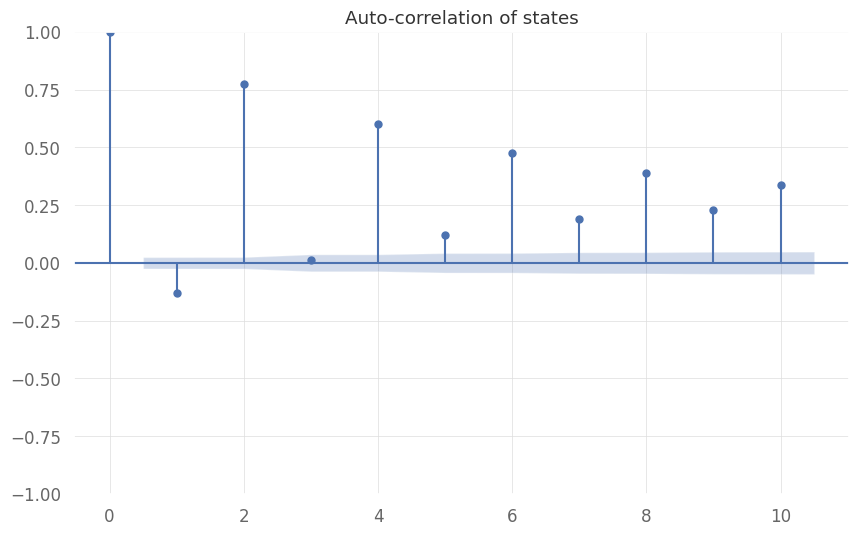

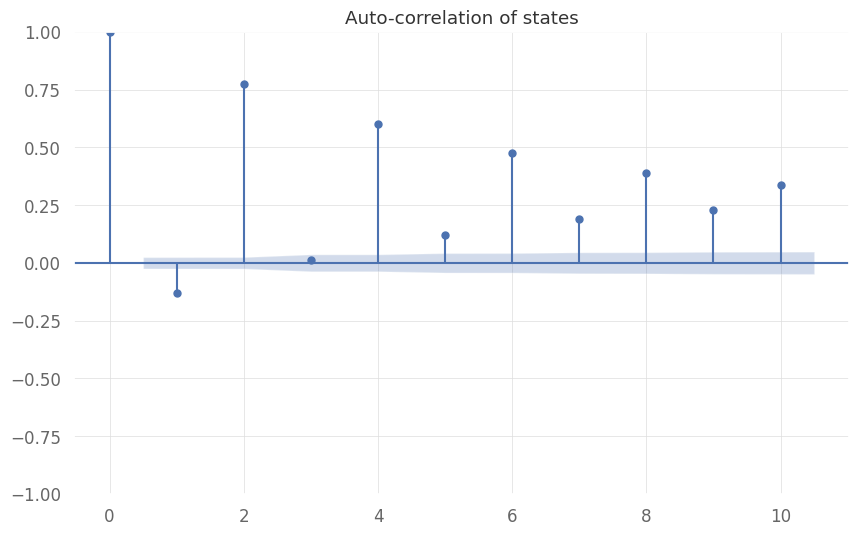

In [122]:
''''
Trying Lags from 1 till 255
'''

sm.graphics.tsa.plot_acf(data['Signal_Num'], lags=10,title='Auto-correlation of states')

# for i in range(1,252):
#     title = str(i) + " lag auto-correlation"
#     sm.graphics.tsa.plot_acf(data['Signal_Num'], lags=i,title=title)
#     plt.show()

### 3.2.2. LSTM Model State prediction with input as past 6 day states with Label Encoder.

Epoch 0 Loss: 0.716360867023468
Epoch 10 Loss: 0.6182939410209656
Epoch 20 Loss: 0.08557728677988052
Epoch 30 Loss: 0.731093168258667
Epoch 40 Loss: 0.15029467642307281
Root Mean Squared Error: 0.6288686818667004
Match
YES    1204
NO       78
Name: count, dtype: int64


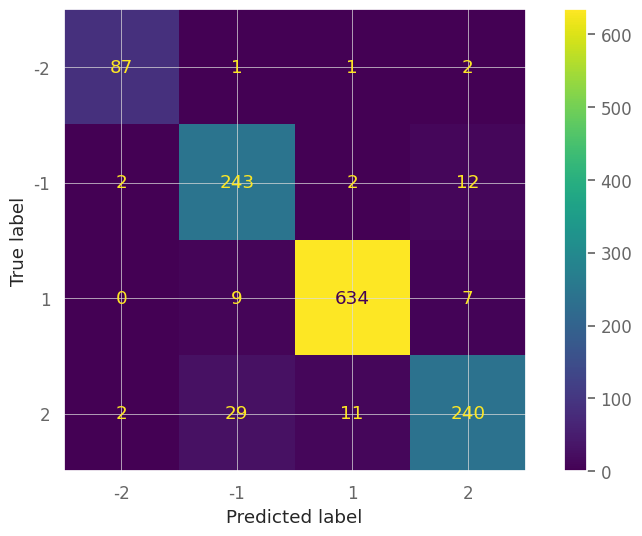

Accuracy: 0.9391575663026521


In [123]:
'''
Try 2: With past 6 days Signal Label Encoded as input
'''

signal = data['Signal_Num'].values

# Encode the data without normalization
label_encoder = LabelEncoder()
signal_encoded = label_encoder.fit_transform(signal)

# Create sequences of 6 lags
def create_sequences(data, lag):
    sequences = []
    labels = []
    for i in range(lag, len(data)):
        sequences.append(data[i-lag:i])
        labels.append(data[i])
    return np.array(sequences), np.array(labels)

lag = 6
X, y = create_sequences(signal_encoded, lag)

# Split the data into training and testing sets
split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

# Convert to PyTorch tensors
X_train = torch.tensor(X_train, dtype=torch.long)
y_train = torch.tensor(y_train, dtype=torch.long)
X_test = torch.tensor(X_test, dtype=torch.long)
y_test = torch.tensor(y_test, dtype=torch.long)

# Create DataLoader
train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)

# Define the LSTM model
class LSTMModel(nn.Module):
    def __init__(self, input_size=1, hidden_layer_size=50, output_size=4):  # 4 output classes
        super(LSTMModel, self).__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size, batch_first=True)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        self.softmax = nn.LogSoftmax(dim=1)

    def forward(self, input_seq):
        lstm_out, _ = self.lstm(input_seq.unsqueeze(-1).float())
        predictions = self.linear(lstm_out[:, -1])
        return self.softmax(predictions)

# Instantiate the model, define the loss function and the optimizer
model = LSTMModel()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

# Train the model
epochs = 50
for epoch in range(epochs):
    for seq, labels in train_loader:
        optimizer.zero_grad()
        y_pred = model(seq)
        loss = criterion(y_pred, labels)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        print(f'Epoch {epoch} Loss: {loss.item()}')

# Make predictions
model.eval()
with torch.no_grad():
    test_predictions = model(X_test).numpy()

# Map predictions back to original labels
predicted_labels = np.argmax(test_predictions, axis=1)
predicted_signals = label_encoder.inverse_transform(predicted_labels)
actual_signals = label_encoder.inverse_transform(y_test.numpy())

# RMSE
rmse = np.sqrt(np.mean((predicted_signals - actual_signals) ** 2))
print(f'Root Mean Squared Error: {rmse}')

predicted_signals_reshaped = predicted_signals.reshape(-1, 1)
actual_signals_reshaped = actual_signals.reshape(-1, 1)
combined = np.hstack((predicted_signals_reshaped, actual_signals_reshaped))
res2 = pd.DataFrame(combined, columns=['Predicted', 'Actual'])

res2['Match'] = res2.apply(lambda row: 'YES' if row['Predicted'] == row['Actual'] else 'NO', axis=1)
match_counts2 = res2['Match'].value_counts()
print(match_counts2)

all_labels = np.unique(np.concatenate((res2['Actual'], res2['Predicted'])))
all_labels_sorted = np.sort(all_labels)

confusion_matrix = metrics.confusion_matrix(res2['Actual'], res2['Predicted'])
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels=all_labels_sorted) #, display_labels = [0, 1])
cm_display.plot()
plt.show()

accuracy = metrics.accuracy_score(res2['Actual'], res2['Predicted'])
print(f'Accuracy: {accuracy}')


This model achieves 96% accuracy. The followings are some fine-tuned parameters in the experiment.
- different encoder (Min Max encoder)
- input as past 6 day states with Log return
- input as past 6 day states with Predicted Adjusted Close
- input as past 6 day states with Predicted Log return

The code for the fine-tuning process can be found in https://github.com/aiqtech-vip/capstone/blob/main/Experiments/Market_state_prediction.ipynb






### 3.2.3 Improved Model with Fine-Tuned parameter

In [124]:
data = pd.read_csv("Market_States.csv")
data.head()

,Unnamed: 0,Date,Adj Close,Log Return,State,Volume,Signal
0,0,1998-12-23,1228.540039,0.020534,1,697500000.0,High_Variance_Bullish
1,1,1998-12-24,1226.270020,-0.001849,2,246980000.0,Low_Variance_Bearish
2,2,1998-12-28,1225.489990,-0.000636,1,531560000.0,High_Variance_Bullish
3,3,1998-12-29,1241.810059,0.013229,2,586490000.0,Low_Variance_Bearish
4,4,1998-12-30,1231.930054,-0.007988,1,594220000.0,High_Variance_Bullish


Epoch 0 Loss: 0.45274466276168823
Epoch 10 Loss: 0.0797014832496643
Epoch 20 Loss: 0.45750147104263306
Epoch 30 Loss: 0.09084047377109528
Epoch 40 Loss: 0.6869218945503235
Accuracy:  0.93141075604053


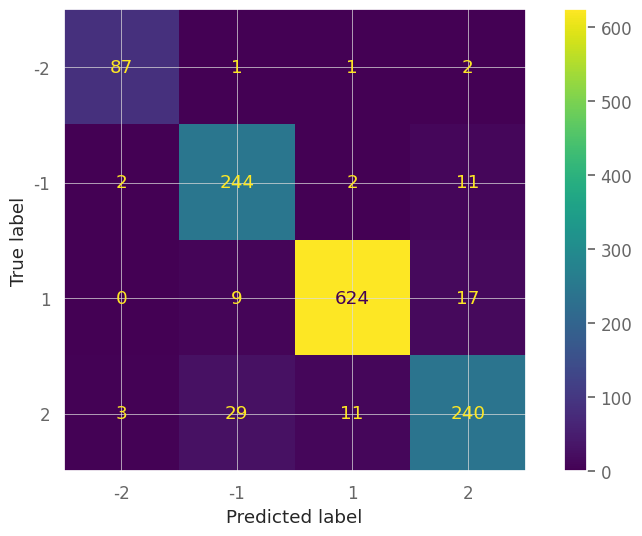

In [125]:
''' Improved model
Basen on fine tuning result we are choosing
1. hidden_layer_size of 64
2. learning_rate of 0.0005
3. batch_size of 16
'''

data = pd.read_csv("Market_States.csv")
data = data[['Date','Signal']]

signal_mapping = {'Low_Variance_Bullish': 1, 'Low_Variance_Bearish': -1,
                  'High_Variance_Bullish': 2, 'High_Variance_Bearish': -2}
data['Signal_Num'] = data['Signal'].map(signal_mapping)
data

signal = data['Signal_Num'].values
scaler = MinMaxScaler(feature_range=(0, 1))
signal = scaler.fit_transform(signal.reshape(-1, 1))

signal = data['Signal_Num'].values
label_encoder = LabelEncoder()
signal_encoded = label_encoder.fit_transform(signal)

def create_sequences(data, lag):
    sequences = []
    labels = []
    for i in range(lag, len(data)):
        sequences.append(data[i-lag:i])
        labels.append(data[i])
    return np.array(sequences), np.array(labels)

lag = 3
X, y = create_sequences(signal_encoded, lag)

split = int(0.8 * len(X))
X_train, X_test = X[:split], X[split:]
y_train, y_test = y[:split], y[split:]

X_train = torch.tensor(X_train, dtype=torch.long)
y_train = torch.tensor(y_train, dtype=torch.long)
X_test = torch.tensor(X_test, dtype=torch.long)
y_test = torch.tensor(y_test, dtype=torch.long)

train_dataset = TensorDataset(X_train, y_train)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)

class LSTMModel(nn.Module):
    def __init__(self, input_size=1, hidden_layer_size=64, output_size=4):  # 4 output classes
        super(LSTMModel, self).__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size, batch_first=True)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        self.softmax = nn.LogSoftmax(dim=1)

    def forward(self, input_seq):
        lstm_out, _ = self.lstm(input_seq.unsqueeze(-1).float())
        predictions = self.linear(lstm_out[:, -1])
        return self.softmax(predictions)

improved_model = LSTMModel()
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(improved_model.parameters(), lr=0.0005)

epochs = 50
for epoch in range(epochs):
    for seq, labels in train_loader:
        optimizer.zero_grad()
        y_pred = improved_model(seq)
        loss = criterion(y_pred, labels)
        loss.backward()
        optimizer.step()
    if epoch % 10 == 0:
        print(f'Epoch {epoch} Loss: {loss.item()}')

improved_model.eval()
with torch.no_grad():
    test_predictions = improved_model(X_test).numpy()


predicted_labels = np.argmax(test_predictions, axis=1)
predicted_signals = label_encoder.inverse_transform(predicted_labels)
actual_signals = label_encoder.inverse_transform(y_test.numpy())
rmse = np.sqrt(np.mean((predicted_signals - actual_signals) ** 2))
predicted_signals_reshaped = predicted_signals.reshape(-1, 1)
actual_signals_reshaped = actual_signals.reshape(-1, 1)
combined = np.hstack((predicted_signals_reshaped, actual_signals_reshaped))
res2 = pd.DataFrame(combined, columns=['Predicted', 'Actual'])


res2['Match'] = res2.apply(lambda row: 'YES' if row['Predicted'] == row['Actual'] else 'NO', axis=1)
match_counts2 = res2['Match'].value_counts()
match_counts2

accuracy = metrics.accuracy_score(res2['Actual'], res2['Predicted'])
print("Accuracy: ",accuracy)

confusion_matrix = metrics.confusion_matrix(res2['Actual'], res2['Predicted'])
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels=all_labels_sorted) #, display_labels = [0, 1])
cm_display.plot()
plt.show()

## 3.3. Experiment to extend LSTM Model's prediction period (Market States)

### 3.3.1. Building Pause and Play function with fine-tuned LSTM to build models to predict for different days

In [126]:
def recursive_pause_and_play(time_period, model = model):
    '''
    This method helps to do a long term prediction with recursive pause and play.
    For example for time period of 6 days, the function would :-
    1. get test testinput for first day and predict a signal. Lets call it as Label 1.
    2. For second day, the label 1 will be appended to the first's input
    3. This continues until 6 days
    4. After that it will get next day's input directly from test and and stepm 2,3, 4 will be continued
    '''
    rec_test_X = X_test[0]
    predicted_list = []
    for i in range(len(X_test)):
        with torch.no_grad():
            output = model(rec_test_X.unsqueeze(0))
        log_probs = output.squeeze(0)  # Remove the batch dimension
        probs = F.softmax(log_probs, dim=-1)
        predicted_class_index = torch.argmax(probs).item()
        predicted_class = class_labels[predicted_class_index]
        predicted_list.append(predicted_class)
        if((i+1)%time_period==0):
            rec_test_X = X_test[i]
        else:
            rec_test_X = torch.cat((rec_test_X[1:], torch.tensor([predicted_class])))

    predicted_recursive = np.array(predicted_list).reshape(-1,1)

    combined = np.hstack((predicted_recursive, actual_signals_reshaped))
    rec_res = pd.DataFrame(combined, columns=['Predicted', 'Actual'])

    all_labels = np.unique(np.concatenate((rec_res['Actual'], rec_res['Predicted'])))
    all_labels_sorted = np.sort(all_labels)


    confusion_matrix = metrics.confusion_matrix(rec_res['Actual'], rec_res['Predicted'])
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels=all_labels_sorted) #, display_labels = [0, 1])
    cm_display.plot()
    plt.show()

    accuracy = metrics.accuracy_score(rec_res['Actual'], rec_res['Predicted'])
    print("Accuracy: ",accuracy)
    return rec_res['Actual'], rec_res['Predicted']

1


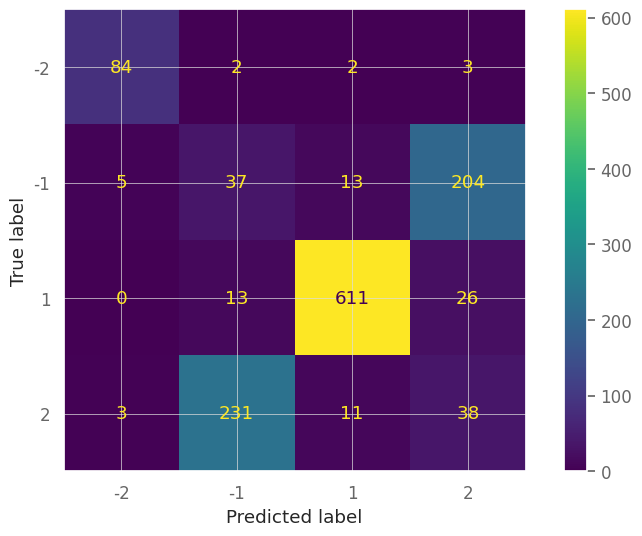

Accuracy:  0.6001558846453624

-----------


2


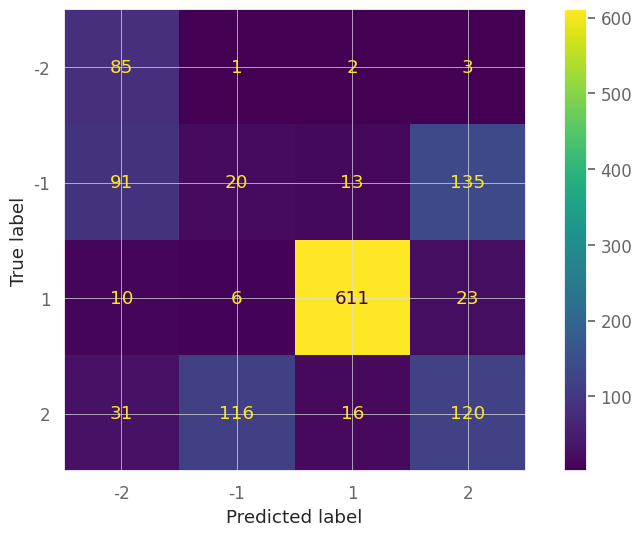

Accuracy:  0.6515978176149649

-----------


3


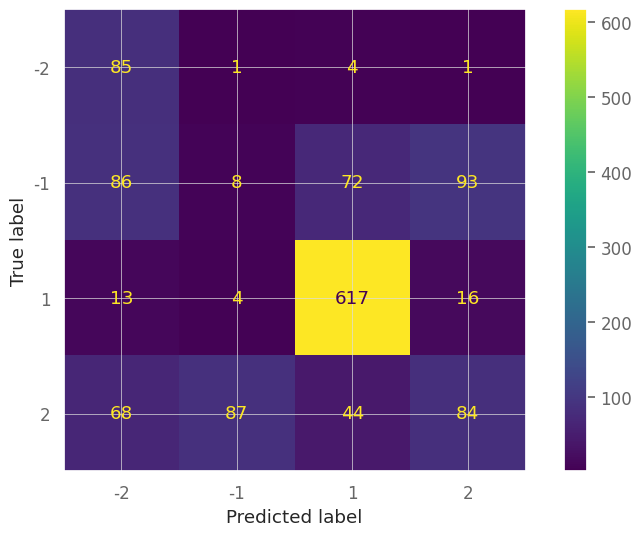

Accuracy:  0.6188620420888542

-----------


4


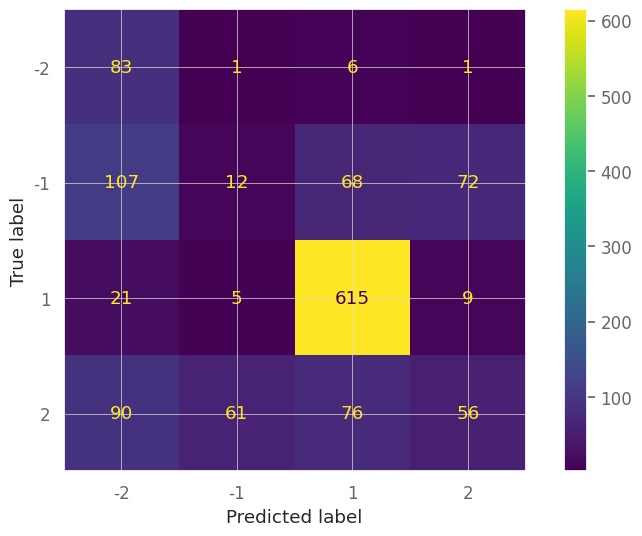

Accuracy:  0.5970381917381138

-----------


5


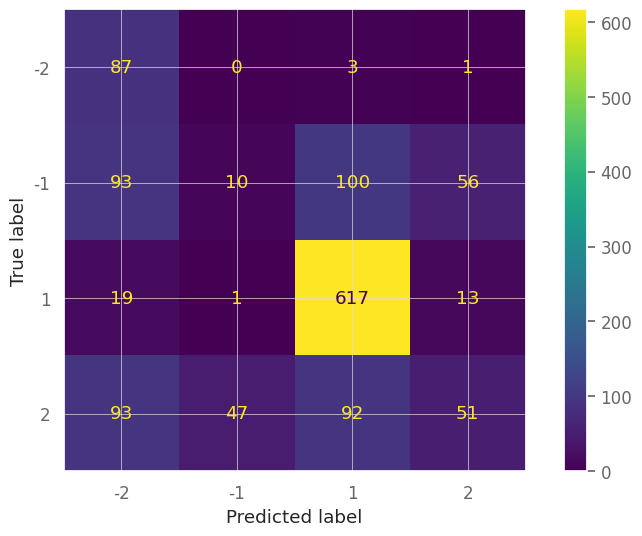

Accuracy:  0.5962587685113017

-----------


6


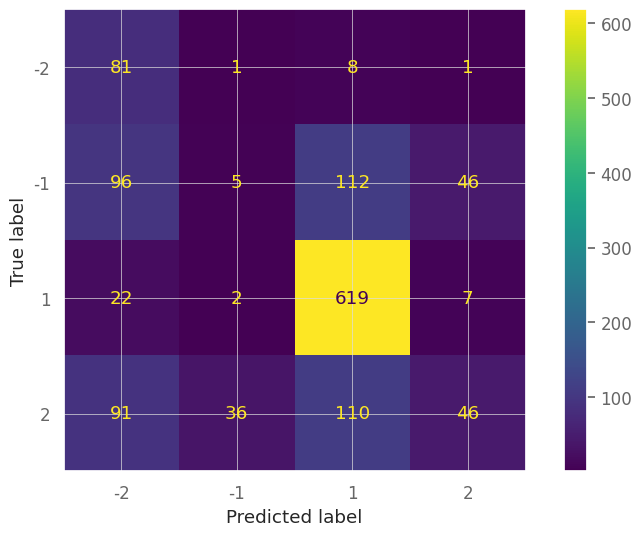

Accuracy:  0.5853468433359315

-----------




In [127]:
class_labels = [-2, -1, 1, 2]

for i in range(6):
    time_period = i+1
    print(time_period)
    recursive_pause_and_play(time_period, improved_model)
    print("\n-----------\n\n")

### V. Investment Strategy

### 1. Strategy 1: Long Equity Strategy Based on Market Regimes

The optimal weights in each regime may vary as the time frame used to develop the strategy changes.

In [128]:
# use efficient frontier to calculate the optimal portfolio in different states (assum r_f = 0.05)

# optimize the portfolio in State 0
mu_0 = rocket.mean()
s_0 = rocket.cov()

# apply efficient frontier
ef_0 = EfficientFrontier(mu_0, s_0)
weights = ef_0.max_sharpe(risk_free_rate=0.05/252)
weights_0 = ef_0.clean_weights()

print('----------Optimal Weights in Rocket State----------')
for each in weights_0:
    print(f'{each}: {weights_0[each]:.2f}')

----------Optimal Weights in Rocket State----------
Energy: 0.11
Finance: 0.00
Consumer: 0.00
DowJones: 0.77
SP500: 0.00
Nasdaq: 0.12
Russel2000: 0.00
VIX: 0.00


In [129]:
# optimize the portfolio in State 1
mu_1 = steady.mean()
s_1 = steady.cov()

# apply efficient frontier
ef_1 = EfficientFrontier(mu_1, s_1)
weights = ef_1.max_sharpe(risk_free_rate=0.05/252)
weights_1 = ef_1.clean_weights()

print('----------Optimal Weights in Steady State----------')
for each in weights_1:
    print(f'{each}: {weights_1[each]:.2f}')

----------Optimal Weights in Steady State----------
Energy: 0.00
Finance: 0.00
Consumer: 0.00
DowJones: 0.00
SP500: 0.00
Nasdaq: 0.00
Russel2000: 0.00
VIX: 1.00


In [130]:
# optimize the portfolio in State 2
mu_2 = crisis.mean()
s_2 = crisis.cov()

# apply efficient frontier
ef_2 = EfficientFrontier(mu_2, s_2)
weights = ef_2.max_sharpe(risk_free_rate=0.05/252)
weights_2 = ef_2.clean_weights()

print('----------Optimal Weights in Crisis State----------')
for each in weights_2:
    print(f'{each}: {weights_2[each]:.2f}')

----------Optimal Weights in Crisis State----------
Energy: 0.07
Finance: 0.00
Consumer: 0.37
DowJones: 0.00
SP500: 0.00
Nasdaq: 0.56
Russel2000: 0.00
VIX: 0.00


In [131]:
# optimize the portfolio in State 3
mu_3 = volatile.mean()
s_3 = volatile.cov()

# apply efficient frontier
ef_3 = EfficientFrontier(mu_3, s_3)
weights = ef_3.max_sharpe(risk_free_rate=0.05/252)
weights_3 = ef_3.clean_weights()

print('----------Optimal Weights in Volatile State----------')
for each in weights_3:
    print(f'{each}: {weights_3[each]:.2f}')

----------Optimal Weights in Volatile State----------
Energy: 0.00
Finance: 0.51
Consumer: 0.00
DowJones: 0.00
SP500: 0.00
Nasdaq: 0.00
Russel2000: 0.00
VIX: 0.49


The following weights were calculated using the data ending in late May, 2024

In [132]:
# create a dictionary to store the optimal weights in different states
rocket_w = np.array([0, 0.09, 0, 0, 0.85, 0, 0.06, 0])
steady_w = np.array([0, 0.07, 0, 0.37, 0, 0, 0.56, 0])
crisis_w = np.array([1, 0, 0, 0, 0, 0, 0, 0])
volatile_w = np.array([0.49, 0, 0.51, 0, 0, 0, 0, 0])

p_weight = {'rocket': rocket_w, 'steady': steady_w, 'crisis': crisis_w, 'volatile': volatile_w}

In [133]:
# download the price data using yfinance
# VIXY is the ETF tracking the performance of VIX
idx_lst = ['^GSPC', '^DJI', '^NDX', '^RUT', 'XLF', 'XLE', 'XLP', 'VIXY']
idx_price = yf.download(idx_lst, start='2004-01-03', interval='1d')

idx_price.dropna(inplace=True, axis=0)
idx_price = idx_price['Adj Close']
idx_price.columns = ['VIX', 'Energy', 'Finance', 'Consumer', 'DowJones', 'SP500', 'Nasdaq', 'Russel2000']

# read the state file
state = pd.read_csv('daily_classification.csv', parse_dates=['Date']).set_index('Date').loc[:, ['state']]
idx_price = idx_price.join(state['state'], how='inner')

idx_price.head()

[*********************100%%**********************]  8 of 8 completed


,VIX,Energy,Finance,Consumer,DowJones,SP500,Nasdaq,Russel2000,state
Date,,,,,,,,,
2011-01-04,158460.0,43.411587,10.325229,20.511841,11691.179688,1270.199951,2251.459961,785.830017,crisis
2011-01-05,155100.0,43.583546,10.445731,20.518848,11722.889648,1276.560059,2270.399902,795.090027,crisis
2011-01-06,155760.0,43.169601,10.375967,20.448767,11697.309570,1273.849976,2277.510010,791.419983,crisis
2011-01-07,156080.0,43.481636,10.287173,20.343653,11674.759766,1271.500000,2276.699951,787.830017,crisis
2011-01-10,155760.0,43.309704,10.261808,20.357672,11637.450195,1269.750000,2284.379883,791.580017,crisis


In [134]:
# initialize the portfolio
portfolio_value = 10000
portfolio = pd.DataFrame({'Value': np.zeros(len(idx_price.state)),
                          'State': idx_price.state,
                          'Benchmark': np.zeros(len(idx_price.state),),
                          'Proj_state': np.zeros(len(idx_price.state)),
                          'Trade': np.nan* len(idx_price.state)})
previous_state = 'steady'
shares = portfolio_value * p_weight[previous_state] / idx_price.iloc[19, :8]
state_def = []
benchmark_share = 0
num_trade = 1
leverage = 1
profit = 0
b_profit = 0
previous_portfolio_value = 10000
t_1, t_2 = 'rocket', 'rocket'

# develope the strategy
for each in portfolio.iterrows():
    date = each[0]

    # look back at the past 5 trading days (1 week)
    if len(state_def) <= 5:
        state_def.append(each[1].State)
        portfolio.at[date, 'Value'] = profit + 10000
        portfolio.at[date, 'Proj_state'] = portfolio.at[date, 'State']
        if benchmark_share == 0:
            benchmark_share = 10000/idx_price.loc[date, 'SP500']
            portfolio.at[date, 'Benchmark'] = 10000
        else:
            portfolio.at[date, 'Benchmark'] = 10000
            benchmark_price = idx_price.loc[date, 'SP500']
        continue
    else:
        # define the current state
        # crisis to rocket
        if state_def.count('crisis') >= 1:
            current_state = 'rocket'
        # volatile to crisis
        elif state_def.count('volatile') >= 2:
            current_state = 'crisis'
        # volatile
        elif state_def.count('steady') <= 2:
            current_state = 'volatile'
        else:
            current_state = 'steady'

        # use leverage when the market condition is 'rocket' and 'steady'
        # avoid investing when the market condition is 'volatile' or 'crisis'
        if current_state == 'steady':
            leverage = 3
        elif current_state == 'rocket':
            leverage = 1
        elif current_state == 'volatile':
            leverage = 0
        else:
            leverage = 0

        # if the current state changes from the previous one
        # sell the orginal portfolio at the close price and build new portfolio according to the new weight
        if current_state != previous_state:
            portfolio_value = np.dot(shares, np.array(idx_price.loc[date, 'VIX': 'Russel2000']).T)
            shares = portfolio_value * p_weight[current_state] / np.array(idx_price.loc[date, 'VIX': 'Russel2000'])
            # calculate the number of trades
            num_trade += 1
        else:
            portfolio_value = np.dot(shares, np.array(idx_price.loc[date, 'VIX': 'Russel2000']).T)

    # update the value in the data frame
    profit += (portfolio_value - previous_portfolio_value) * leverage
    b_profit += benchmark_share * (idx_price.loc[date, 'SP500'] - benchmark_price)
    portfolio.at[date, 'Value'] = profit + 10000
    # mark the trade for visualization
    if current_state != previous_state and leverage != 0:
        portfolio.at[date, 'Trade'] = profit + 10000
    portfolio.at[date, 'Benchmark'] = b_profit + 10000
    portfolio.at[date, 'Proj_state'] = current_state

    # update the state list
    state_def.pop(0)
    state_def.append(each[1].State)

    # update the previous state (used in the trading next day)
    previous_state = current_state
    previous_portfolio_value = portfolio_value
    benchmark_price = idx_price.loc[date, 'SP500']

print(f'Trading Times: {num_trade}')

Trading Times: 37


In [135]:
# compare the portfolio performance with the benchmark
p_returns = portfolio['Value']/portfolio['Value'].shift(1) - 1
b_returns = portfolio['Benchmark']/portfolio['Benchmark'].shift(1) - 1

qs.reports.metrics(p_returns, b_returns)

                    Benchmark    Strategy
------------------  -----------  ----------
Start Period        2011-01-05   2011-01-05
End Period          2024-06-21   2024-06-21
Risk-Free Rate      0.0%         0.0%
Time in Market      100.0%       98.0%

Cumulative Return   329.88%      110.22%
CAGR﹪              7.76%        3.88%

Sharpe              0.71         0.47
Prob. Sharpe Ratio  99.5%        95.83%
Sortino             1.0          0.66
Sortino/√2          0.7          0.47
Omega               1.1          1.1

Max Drawdown        -33.97%      -23.37%
Longest DD Days     745          899

Gain/Pain Ratio     0.15         0.1
Gain/Pain (1M)      0.9          0.57

Payoff Ratio        0.95         0.94
Profit Factor       1.15         1.1
Common Sense Ratio  1.09         1.03
CPC Index           0.59         0.55
Tail Ratio          0.95         0.93
Outlier Win Ratio   3.28         4.35
Outlier Loss Ratio  3.84         4.79

MTD                 3.55%        0.72%
3M              

In [136]:
# visualize the portoflio performance (2011 - 2017)
base_10 = alt.Chart(portfolio.reset_index()[portfolio.reset_index().Date.dt.year<=2017])
base_20 = alt.Chart(portfolio.reset_index()[portfolio.reset_index().Date.dt.year>2017])

line1 = base_10.mark_line().encode(
    alt.X('Date'),
    alt.Y('Value'),
    color = alt.value('#000099')
)

line2 = base_10.mark_line().encode(
    alt.X('Date'),
    alt.Y('Benchmark'),
    color = alt.value('black')
)

state = base_10.mark_bar().encode(
    alt.X('Date'),
    alt.Color('State', scale=alt.Scale(range=['#FF0000', '#CCCC00', '#66FFFF', '#6600CC']))
)

point = base_10.mark_point(size=25, filled=True).encode(
    alt.X('Date'),
    alt.Y('Trade'),
    color = alt.value('#FF4500')
)

(state + line1 + line2 + point).properties(width = 1000)

alt.LayerChart(...)

In [137]:
# visualization part II (2018 - now)
line1 = base_20.mark_line().encode(
    alt.X('Date'),
    alt.Y('Value'),
    color = alt.value('#000099')
)

line2 = base_20.mark_line().encode(
    alt.X('Date'),
    alt.Y('Benchmark'),
    color = alt.value('black')
)

state = base_20.mark_bar().encode(
    alt.X('Date'),
    alt.Color('State', scale=alt.Scale(range=['#FF0000', '#CCCC00', '#66FFFF', '#6600CC']))
)

point = base_20.mark_point(size=25, filled=True).encode(
    alt.X('Date'),
    alt.Y('Trade'),
    color = alt.value('#FF4500')
)

(state + line1 + line2 + point).properties(width = 1000)

alt.LayerChart(...)

### 2. Stratergy 2: Markov based Stratergy

In [190]:
'''
Step1:
Collecting data for different period of time
'''
class_labels = [-2, -1, 1, 2]

_,predicted = recursive_pause_and_play(2,improved_model)
res2['predicted2'] = predicted
_,predicted = recursive_pause_and_play(3,improved_model)
res2['predicted3'] = predicted
_,predicted = recursive_pause_and_play(4, improved_model)
res2['predicted4'] = predicted
_,predicted = recursive_pause_and_play(5, improved_model)
res2['predicted5'] = predicted
_,predicted = recursive_pause_and_play(6, improved_model)
res2['predicted6'] = predicted
res2['Adj_Close']=pd.read_csv("Market_States.csv")[len(X_train)+3:]['Adj Close'].values  # 3259


AttributeError: 'numpy.ndarray' object has no attribute 'unsqueeze'

Results for 1 day ahead prediction:
Final equity: $21352.92
Cumulative returns: 113.53%
Sharpe Ratio: 1.52


Results for 2 day ahead prediction:
Final equity: $16795.14
Cumulative returns: 67.95%
Sharpe Ratio: 0.87


Results for 3 day ahead prediction:
Final equity: $21126.51
Cumulative returns: 111.27%
Sharpe Ratio: 1.19


Results for 4 day ahead prediction:
Final equity: $14460.78
Cumulative returns: 44.61%
Sharpe Ratio: 0.64


Results for 5 day ahead prediction:
Final equity: $16861.91
Cumulative returns: 68.62%
Sharpe Ratio: 0.90


Results for 6 day   ahead prediction:
Final equity: $16404.43
Cumulative returns: 64.04%
Sharpe Ratio: 0.80


Results for Buy_and_Hold:
Final equity: $19110.20
Cumulative returns: 91.10%
Sharpe Ratio: 0.71




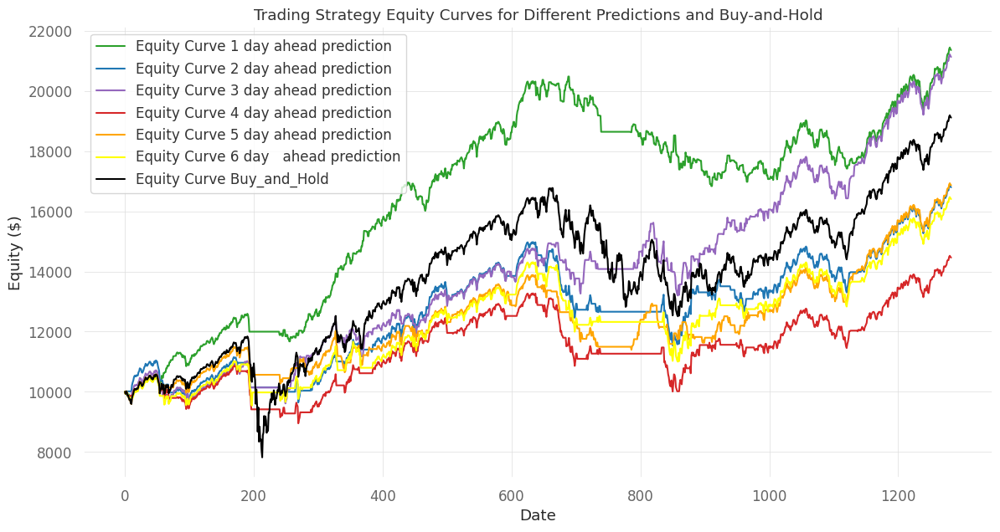

In [191]:
'''
Step2 :
Comparing all the different time period with a simple stratergy
Startergy: The startergy involves:-
1. Buying whenever the trend is expected and when the cash limit is not zero
2. Selling whenever the market is expected to go down and when the position is not zero
'''

initial_cash = 10000
prediction_columns = ['Predicted', 'predicted2', 'predicted3', 'predicted4','predicted5','predicted6']
prediction_columns_caption = {'Predicted' : '1 day ahead prediction', 'predicted2':'2 day ahead prediction', 'predicted3':'3 day ahead prediction', 'predicted4':'4 day ahead prediction', 'predicted5':'5 day ahead prediction', 'predicted6':'6 day   ahead prediction'}

results = {}

markov_result =res2
for prediction in prediction_columns:
    prev_day_adj_cls_price = res2['Adj_Close'][1]
    cash = initial_cash
    position = 0
    equity_curve = []

    for index, row in markov_result.iterrows():
        signal = row[prediction]
        if (signal == 1 or signal == 2) and (cash > 0):
            position = cash / row['Adj_Close']
            cash = 0
            equity = cash + position * row['Adj_Close']
        elif (signal == -1 or signal == -2) and (position > 0):
            cash = position * row['Adj_Close']
            position = 0
            equity = cash + position * prev_day_adj_cls_price
        else:
            equity = cash + position * row['Adj_Close']
        equity_curve.append(equity)

    prev_day_adj_cls_price = row['Adj_Close']
    markov_result[f'Equity_{prediction}'] = equity_curve
    returns = markov_result[f'Equity_{prediction}'].pct_change().dropna()
    cumulative_returns = (1 + returns).cumprod() - 1
    sharpe_ratio = (returns.mean() / returns.std()) * np.sqrt(252)
    caption = prediction_columns_caption[prediction]
    results[caption] = {
        'final_equity': markov_result[f'Equity_{prediction}'].iloc[-1],
        'cumulative_returns': cumulative_returns.iloc[-1],
        'sharpe_ratio': sharpe_ratio,
        'equity_curve': equity_curve
    }

# Buy-and-Hold Strategy
initial_price = markov_result['Adj_Close'].iloc[0]
final_price = markov_result['Adj_Close'].iloc[-1]
final_equity_bh = initial_cash * (final_price / initial_price)
cumulative_return_bh = (final_price / initial_price) - 1
daily_returns_bh = markov_result['Adj_Close'].pct_change().dropna()
sharpe_ratio_bh = (daily_returns_bh.mean() / daily_returns_bh.std()) * np.sqrt(252)
results['Buy_and_Hold'] = {
    'final_equity': final_equity_bh,
    'cumulative_returns': cumulative_return_bh,
    'sharpe_ratio': sharpe_ratio_bh,
    'equity_curve': initial_cash * (markov_result['Adj_Close'] / initial_price)
}

for strategy, metrics in results.items():
    print(f"Results for {strategy}:")
    print(f"Final equity: ${metrics['final_equity']:.2f}")
    print(f"Cumulative returns: {metrics['cumulative_returns']:.2%}")
    print(f"Sharpe Ratio: {metrics['sharpe_ratio']:.2f}\n\n")

plt.figure(figsize=(14, 7))
colors = ['#2ca02c','#1f77b4', '#9467bd','#d62728','orange','yellow', 'black']
for idx, (strategy, metrics) in enumerate(results.items()):
    plt.plot(metrics['equity_curve'], label=f'Equity Curve {strategy}', color=colors[idx % len(colors)])


plt.title('Trading Strategy Equity Curves for Different Predictions and Buy-and-Hold')
plt.xlabel('Date')
plt.ylabel('Equity ($)')
plt.legend()
plt.show()

### 3. Stratergy 3: MSAR based MACD strategy

In [196]:
ticker = '^NDX'
data = yf.download(ticker, start='2004-01-01', end='2023-12-31')
data['Log_Return'] = np.log(data['Adj Close'] / data['Adj Close'].shift(1)).dropna()
data = data.iloc[1:]

[*********************100%%**********************]  1 of 1 completed


<Figure size 1200x600 with 0 Axes>

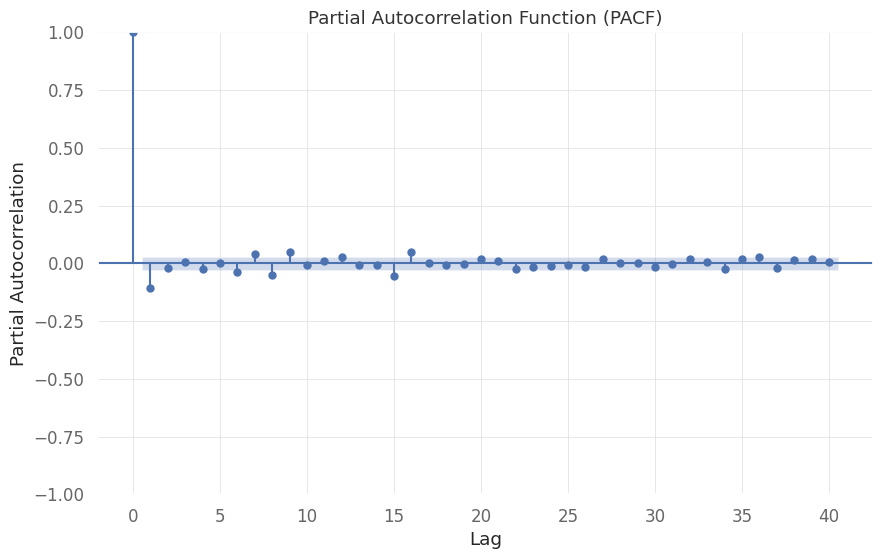

In [197]:
from statsmodels.graphics.tsaplots import plot_pacf

plt.figure(figsize=(12, 6))
plot_pacf(data['Log_Return'], lags=40, alpha=0.05)
plt.title('Partial Autocorrelation Function (PACF)')
plt.xlabel('Lag')
plt.ylabel('Partial Autocorrelation')
plt.grid(True)
plt.show()

In [198]:
# Assuming vix_data is your VIX data
result = adfuller(data['Log_Return'])

adf_statistic = result[0]
p_value = result[1]

# Printing the results
print("ADF Statistic:", adf_statistic)
print("p-value:", p_value)

ADF Statistic: -17.632243763206723
p-value: 3.7934931016771965e-30


In [199]:
log_return = data['Log_Return']
periods = {
    "2004-2006: Recovery and Expansion": log_return["2004":"2006"],
    "2007-2009: Financial Crisis": log_return["2007":"2009"],
    "2010-2014: Slow Recovery and Expansion": log_return["2010":"2014"],
    "2015-2019: Economic Expansion": log_return["2015":"2019"],
    "2020-2021: COVID-19 Pandemic": log_return["2020":"2021"],
    "2022-2023: Economic Uncertainty": log_return["2022":"2023"]
}

correlations = pd.DataFrame(columns=["Period", "Correlation"])

overall_states = pd.Series()



model = MarkovRegression(data['Log_Return'], k_regimes=2, trend='n', order=1, switching_variance=True)
fit_res = model.fit()
probabilities = fit_res.predicted_marginal_probabilities
overall_states = probabilities.idxmax(axis=1)

for period, tmp in periods.items():
    if not tmp.empty:
        period_states = overall_states[tmp.index]
        train_data = pd.concat([periods[p] for p in periods if p <= period])
        period_states = overall_states[train_data.index]
        model = MarkovRegression(train_data, k_regimes=2, trend='n', order=1, switching_variance=True)
        fit_res = model.fit()
        probabilities = fit_res.predicted_marginal_probabilities
        states = probabilities.idxmax(axis=1)
        correlation = np.corrcoef(states, period_states)[0, 1]
        #correlations = correlations.append({"Period": period, "Correlation": correlation}, ignore_index=True)
        correlations = pd.concat([correlations, pd.DataFrame({"Period": [period], "Correlation": [correlation]})], ignore_index=True)

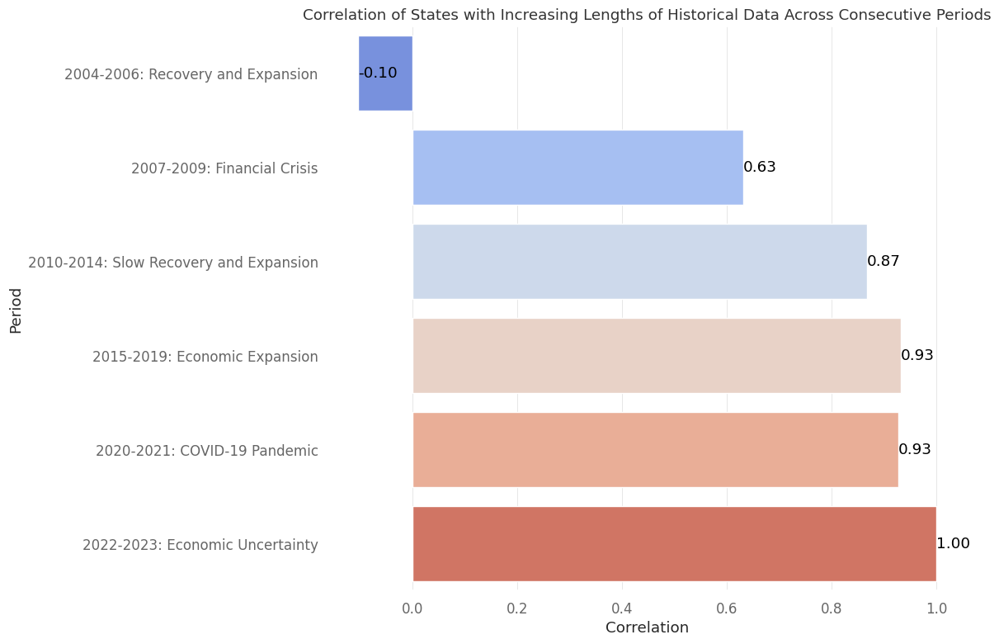

In [200]:
plt.figure(figsize=(12, 8))
sns.barplot(x="Correlation", y="Period", data=correlations, palette="coolwarm")
plt.title("Correlation of States with Increasing Lengths of Historical Data Across Consecutive Periods")
plt.xlabel("Correlation")
plt.ylabel("Period")

# Annotate bars with the correlation values
for index, value in enumerate(correlations['Correlation']):
    plt.text(value, index, f'{value:.2f}', color='black', ha="left", va="center")

plt.tight_layout()
plt.show()

In [201]:
model = MarkovRegression(data['Log_Return'].dropna(), k_regimes=4, order=1, trend='n', switching_variance=True)
fit_res = model.fit()

In [202]:
probabilities = fit_res.smoothed_marginal_probabilities
most_probable_states = probabilities.idxmax(axis=1)

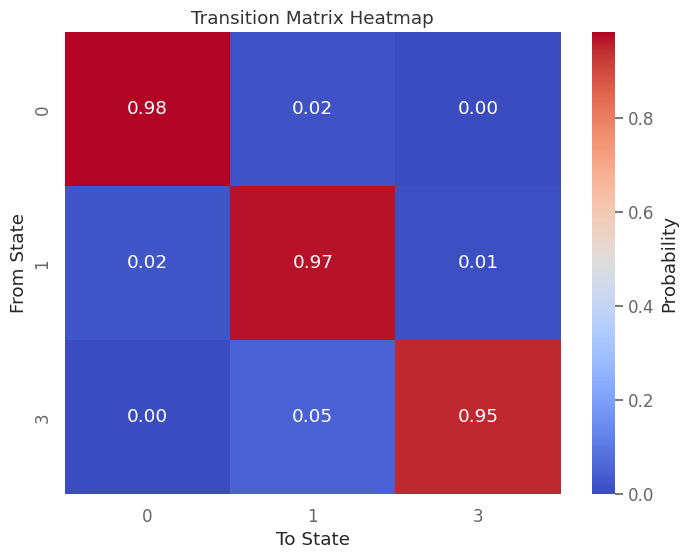

In [203]:
unique_states = sorted(set(most_probable_states))
k_regimes = len(unique_states)
transition_matrix = np.zeros((k_regimes, k_regimes))

state_indices = {state: idx for idx, state in enumerate(unique_states)}

for (i, j) in zip(most_probable_states[:-1], most_probable_states[1:]):
    transition_matrix[state_indices[i], state_indices[j]] += 1

transition_matrix = transition_matrix / transition_matrix.sum(axis=1, keepdims=True)

# Display transition matrix as heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(transition_matrix, annot=True, cmap="coolwarm", fmt=".2f",
            xticklabels=unique_states, yticklabels=unique_states, cbar_kws={'label': 'Probability'})
plt.title("Transition Matrix Heatmap")
plt.xlabel("To State")
plt.ylabel("From State")
plt.show()


In [204]:
data['Log_Return'] = np.log(data['Adj Close'] / data['Adj Close'].shift(1)).dropna()
daily_returns = data['Log_Return']
durations = {0: [], 1: [], 3: []}
average_period_returns = {0: [], 1: [], 3: []}

most_probable_states2 = most_probable_states.loc['2011':]
current_state = most_probable_states2.iloc[0]
start_date = most_probable_states.index[0]

for date, state in most_probable_states.items():
    if state != current_state:
        end_date = date
        duration = (end_date - start_date).days
        durations[current_state].append(duration)

        # Correct access for a Series
        period_returns = daily_returns.loc[start_date:end_date - pd.Timedelta(days=1)]
        if not period_returns.empty:
            average_period_returns[current_state].append(period_returns.mean())

        current_state = state
        start_date = date

# Handle the last interval
end_date = most_probable_states.index[-1] + pd.Timedelta(days=1)
duration = (end_date - start_date).days
durations[current_state].append(duration)
period_returns = daily_returns.loc[start_date:end_date]
if not period_returns.empty:
    average_period_returns[current_state].append(period_returns.mean())

# Output the results
print("Durations:", durations)
print("Average period Returns:", average_period_returns)

Durations: {0: [0, 16, 1, 52, 1, 2, 56, 263, 106, 192, 1, 124, 56, 74, 4, 25, 56, 1, 15, 62, 101, 76, 1, 22, 2, 96, 275, 49, 160, 42, 201, 3, 6, 1, 112, 576, 1, 150, 86, 50, 140, 49, 115, 45, 44], 1: [301, 1, 3, 20, 4, 1, 22, 7, 100, 22, 1, 107, 118, 169, 218, 31, 6, 146, 3, 21, 3, 1, 36, 68, 122, 114, 1, 39, 1, 14, 13, 18, 17, 35, 51, 56, 1, 1, 113, 12, 91, 3, 6, 1, 4, 2, 8, 1, 30, 39, 37, 28, 124, 62, 60, 77, 21, 65, 1, 10, 4, 76, 1, 7, 366], 3: [6, 15, 214, 15, 28, 16, 28, 1, 1, 3, 1, 39, 70, 13, 4, 57, 3, 1, 78, 2, 3, 50]}
Average period Returns: {0: [0.0033944817746506995, 0.006148673251062221, 0.00024357874992013976, 0.0009446079774776245, -0.0005868742867721844, -0.00046053038319480923, 0.001192711392451401, 0.00027822108072177, 0.0012114803327698, 0.005117055982783732, 0.0014098932392493065, 0.0011515546607529714, 0.0028635720618567467, 0.0033664248590714128, 0.0018580827525761972, 0.0016880315301268816, 0.005008292893898265, 0.002810136234237716, -1.147072390734006e-05, 0.0028

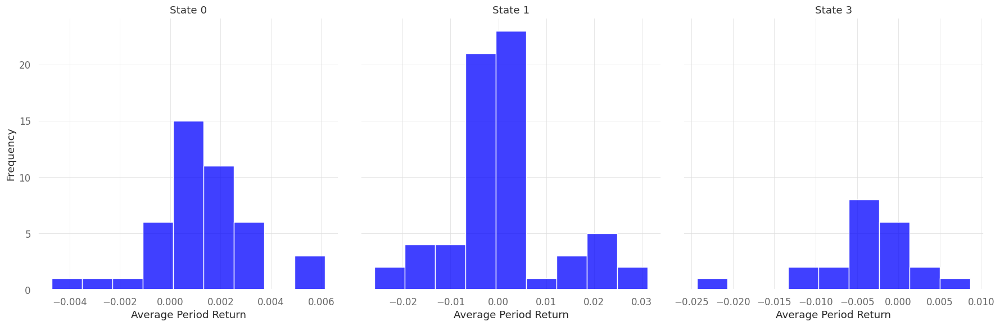

In [205]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, state in enumerate(average_period_returns.keys()):
    if average_period_returns[state]:  # Only plot if there are returns
        min_val = min(average_period_returns[state])
        max_val = max(average_period_returns[state])
        bins = np.linspace(min_val, max_val, 10)  # Create 10 bins between min and max values
        sns.histplot(average_period_returns[state], bins=bins, ax=axes[i], kde=False, color="blue")
        axes[i].set_title(f"State {state}")
        axes[i].set_xlabel("Average Period Return")
        axes[i].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

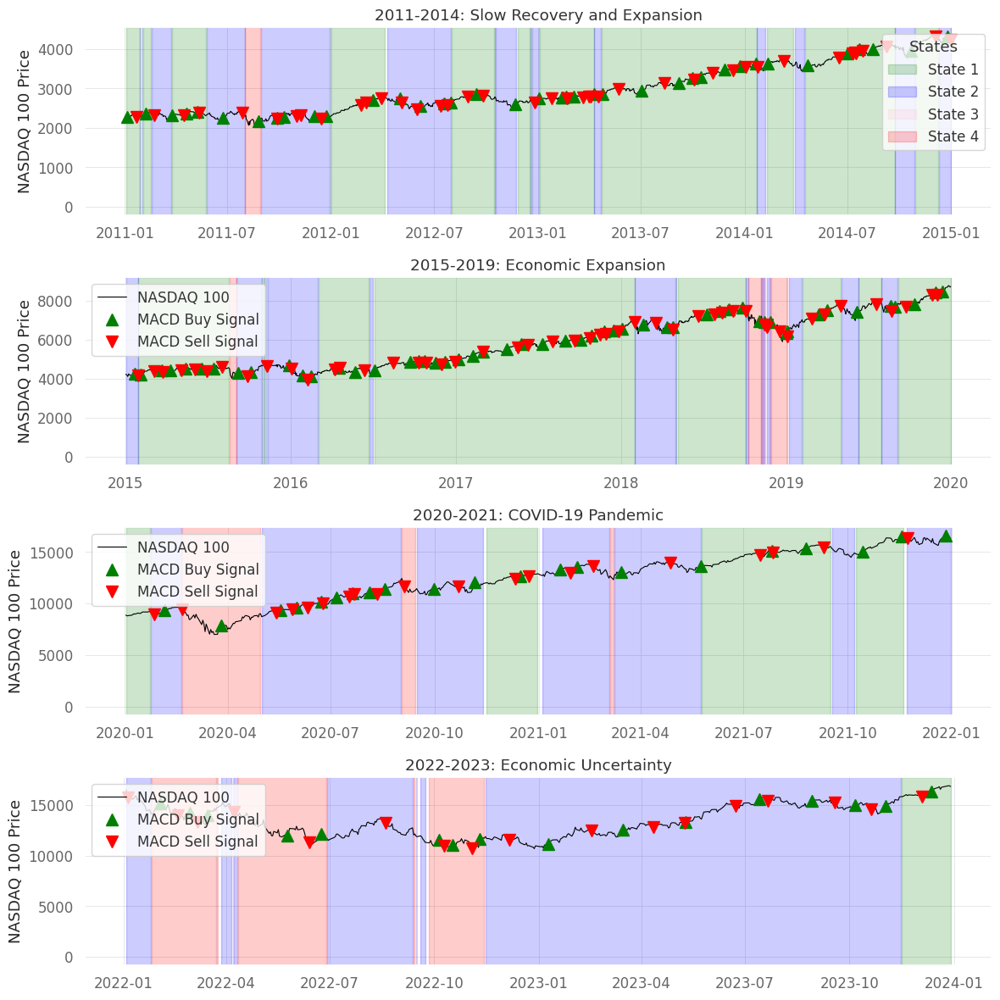

In [206]:
from matplotlib.patches import Patch
macd = MACD(data['Adj Close'])
data['MACD'] = macd.macd()
data['Signal'] = macd.macd_signal()
data['MACD_Diff'] = data['MACD'] - data['Signal']

# Generate MACD buy/sell signals
threshold = 0.5
data['MACD_Buy_Signal'] = ((data['MACD_Diff'] > threshold) & (data['MACD_Diff'].shift(1) <= threshold))
data['MACD_Sell_Signal'] = ((data['MACD_Diff'] < -threshold) & (data['MACD_Diff'].shift(1) >= -threshold))

# Define periods
periods_nasdaq = {
    # "2004-2006: Recovery and Expansion": data["2004":"2006"],
    # "2007-2009: Financial Crisis": data["2007":"2009"],
    "2011-2014: Slow Recovery and Expansion": data["2011":"2014"],
    "2015-2019: Economic Expansion": data["2015":"2019"],
    "2020-2021: COVID-19 Pandemic": data["2020":"2021"],
    "2022-2023: Economic Uncertainty": data["2022":"2023"]
}

# Define colors
colors = ['green', 'blue', 'pink', 'red']

# Create figure and axes
fig, axes = plt.subplots(nrows=len(periods_nasdaq), figsize=(12, 12))

# Plot data
for i, (title, period_data) in enumerate(periods_nasdaq.items()):
    valid_index = period_data.index.intersection(probabilities.index)
    period_data = period_data.loc[valid_index]
    ax1 = axes[i]

    for state in range(4):
        state_mask = (most_probable_states == state).reindex(period_data.index, method='pad')
        ax1.fill_between(period_data.index, ax1.get_ylim()[0], ax1.get_ylim()[1], where=state_mask, color=colors[state], alpha=0.2, transform=ax1.get_xaxis_transform())

    ax1.plot(period_data.index, period_data['Close'], color='black', label='NASDAQ 100', linewidth=0.8)
    ax1.set_ylabel('NASDAQ 100 Price')

    macd_buy_signals = period_data[period_data['MACD_Buy_Signal']]
    macd_sell_signals = period_data[period_data['MACD_Sell_Signal']]
    ax1.plot(macd_buy_signals.index, macd_buy_signals['Close'], '^', markersize=10, color='green', label='MACD Buy Signal')
    ax1.plot(macd_sell_signals.index, macd_sell_signals['Close'], 'v', markersize=10, color='red', label='MACD Sell Signal')

    ax1.legend(loc='upper left')
    ax1.set_title(title)

# Create custom legend for states
legend_elements = [
    Patch(facecolor='green', edgecolor='green', alpha=0.2, label='State 1'),
    Patch(facecolor='blue', edgecolor='blue', alpha=0.2, label='State 2'),
    Patch(facecolor='pink', edgecolor='pink', alpha=0.2, label='State 3'),
    Patch(facecolor='red', edgecolor='red', alpha=0.2, label='State 4')
]
axes[0].legend(handles=legend_elements, loc='upper right', title='States')

plt.tight_layout()
plt.show()

In [207]:
# test trategy
ticker = '^NDX'
data = yf.download(ticker, start='2011-01-01', end='2023-12-31')

# Calculate MACD
macd = MACD(data['Adj Close'])
data['MACD'] = macd.macd()
data['Signal'] = macd.macd_signal()
data['MACD_Diff'] = data['MACD'] - data['Signal']

# Define buy and sell signals
threshold = 0.3
data['Buy_Signal'] = ((data['MACD_Diff'] > threshold) & (data['MACD_Diff'].shift(1) <= threshold))
data['Sell_Signal'] = ((data['MACD_Diff'] < -threshold) & (data['MACD_Diff'].shift(1) >= threshold))

# Simulated states (replace with actual state prediction logic)
states = most_probable_states

# Define initial conditions and variables
initial_cash = 1000000
cash = initial_cash
shares = 0
leveraged_factor = 3
portfolio_values = []
leveraged_value = 0
action = 0
Max_Value = 0

buy_dates = []
sell_dates = []
# value_tmp = []

for date in data.index[1:]:
    state = states.loc[date]
    if action == 3:
        action = 0

    elif action == 1 and (state == 0 or state == 1):
        share_price = data['Adj Close'].loc[date]
        shares_to_buy = int(cash / share_price)
        cash -= shares_to_buy * share_price
        shares += shares_to_buy
        leveraged_value = shares * share_price
        action = 3
        buy_dates.append(date)
        # value_tmp=[]

    elif action == 2:
        cash += leveraged_value
        shares = 0
        leveraged_value = 0
        action = 3

    # buy condition
    if state == 0 or state == 1:
        previous_days = data.loc[:date].tail(2)
        if previous_days['Buy_Signal'].any() and shares == 0:
            action = 1
    # sell condition
    elif state == 3:
        previous_days = data.loc[:date].tail(5)
        if previous_days['Sell_Signal'].any() and shares > 0:
            action = 2
            sell_dates.append(date)

    # sell condition 2
    # if draw_back >= 0.3 and shares > 0:
    #     action = 2
    #     sell_dates.append(date)

    if action == 0 and shares > 0:
        price_change_pct = (data['Adj Close'].loc[date] / data['Adj Close'].shift(1).loc[date] - 1)
        leveraged_value *= (1 + price_change_pct * leveraged_factor)

    portfolio_value = cash + leveraged_value
    portfolio_values.append(portfolio_value)
    # print(Max_Value)
    # print(shares)
    # print(draw_back)

portfolio_df = pd.DataFrame(portfolio_values, index=data.index[1:], columns=['Portfolio Value'])

# Calculate performance metrics
returns = portfolio_df['Portfolio Value'].pct_change().dropna()

# Cumulative Return
cumulative_return = (portfolio_df['Portfolio Value'].iloc[-1] / initial_cash - 1) * 100

# CAGR
total_years = (portfolio_df.index[-1] - portfolio_df.index[0]).days / 365.25
cagr = ((portfolio_df['Portfolio Value'].iloc[-1] / initial_cash) ** (1 / total_years) - 1) * 100

# Sharpe Ratio
risk_free_rate = 0.045  # Assuming 1% risk-free rate
sharpe_ratio = (returns.mean() - risk_free_rate / 252) / returns.std() * np.sqrt(252)

# Sortino Ratio
downside_returns = returns[returns < 0]
sortino_ratio = (returns.mean() - risk_free_rate / 252) / downside_returns.std() * np.sqrt(252)

# Max Drawdown
rolling_max = portfolio_df['Portfolio Value'].cummax()
daily_drawdown = portfolio_df['Portfolio Value'] / rolling_max - 1.0
max_drawdown = daily_drawdown.min() * 100

# Display performance metrics
print(f"Cumulative Return: {cumulative_return:.2f}%")
print(f"CAGR: {cagr:.2f}%")
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
print(f"Sortino Ratio: {sortino_ratio:.2f}")
print(f"Max Drawdown: {max_drawdown:.2f}%")

[*********************100%%**********************]  1 of 1 completed


Cumulative Return: 50919.72%
CAGR: 61.64%
Sharpe Ratio: 1.16
Sortino Ratio: 1.46
Max Drawdown: -45.11%


In [208]:
# Calculate benchmark metrics
benchmark_df = data['Adj Close']
benchmark_initial_value = benchmark_df.iloc[0]
benchmark_final_value = benchmark_df.iloc[-1]

# Cumulative Return for benchmark
benchmark_cumulative_return = (benchmark_final_value / benchmark_initial_value - 1) * 100

# CAGR for benchmark
benchmark_cagr = ((benchmark_final_value / benchmark_initial_value) ** (1 / total_years) - 1) * 100

# Sharpe Ratio for benchmark
benchmark_returns = benchmark_df.pct_change().dropna()
benchmark_sharpe_ratio = (benchmark_returns.mean() - risk_free_rate / 252) / benchmark_returns.std() * np.sqrt(252)

# Sortino Ratio for benchmark
benchmark_downside_returns = benchmark_returns[benchmark_returns < 0]
benchmark_sortino_ratio = (benchmark_returns.mean() - risk_free_rate / 252) / benchmark_downside_returns.std() * np.sqrt(252)

# Max Drawdown for benchmark
benchmark_rolling_max = benchmark_df.cummax()
benchmark_daily_drawdown = benchmark_df / benchmark_rolling_max - 1.0
benchmark_max_drawdown = benchmark_daily_drawdown.min() * 100

# Display benchmark performance metrics
print(f"Benchmark Cumulative Return: {benchmark_cumulative_return:.2f}%")
print(f"Benchmark CAGR: {benchmark_cagr:.2f}%")
print(f"Benchmark Sharpe Ratio: {benchmark_sharpe_ratio:.2f}")
print(f"Benchmark Sortino Ratio: {benchmark_sortino_ratio:.2f}")
print(f"Benchmark Max Drawdown: {benchmark_max_drawdown:.2f}%")

Benchmark Cumulative Return: 646.42%
Benchmark CAGR: 16.75%
Benchmark Sharpe Ratio: 0.63
Benchmark Sortino Ratio: 0.81
Benchmark Max Drawdown: -35.56%


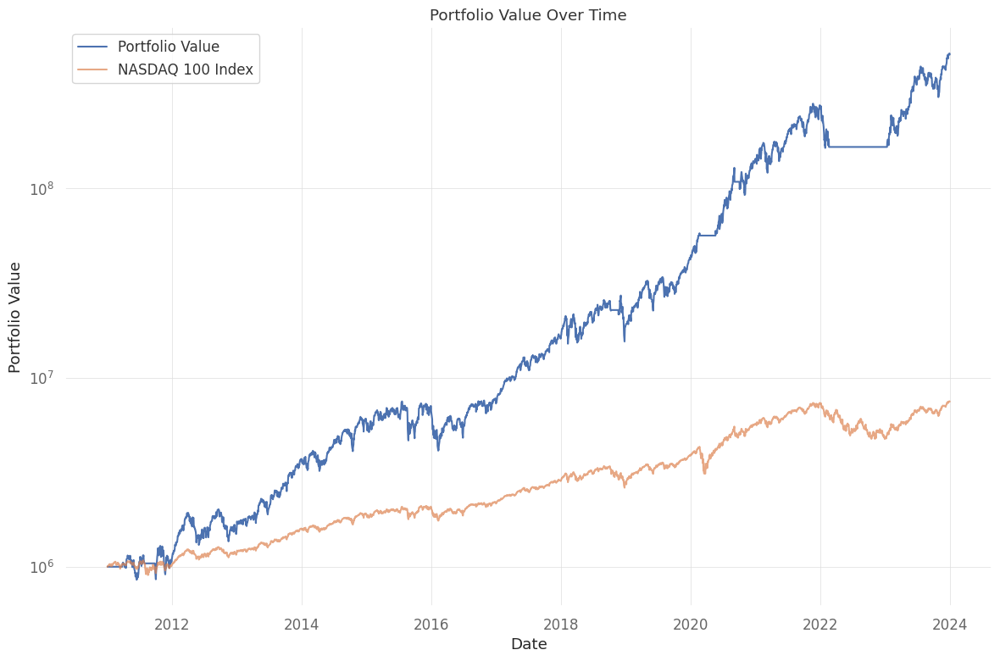

In [209]:
# Plot the comparason
fig, ax = plt.subplots(figsize=(12, 8))
colors = ['blue', 'green', 'yellow', 'red']

# Plot the portfolio and NASDAQ 100 Index values
ax.plot(portfolio_df.index, portfolio_df['Portfolio Value'], label='Portfolio Value')
ax.plot(data.index, data['Adj Close'] / data['Adj Close'].iloc[0] * initial_cash, label='NASDAQ 100 Index', alpha=0.7)

# Set y-axis to logarithmic scale
ax.set_yscale('log')


# Set titles and labels
ax.set_title('Portfolio Value Over Time')
ax.set_xlabel('Date')
ax.set_ylabel('Portfolio Value')
ax.legend()

# Add a legend for the states

plt.tight_layout()
plt.show()

### 4. Stratergy 4 :LSTM Trading Strategy for S&P 500 Index

In [210]:
!pip install ta

[*********************100%%**********************]  1 of 1 completed


Epoch 1/100
86/86 [==============================] - 29s 210ms/step - loss: 0.0139 - val_loss: 0.0031
Epoch 2/100
86/86 [==============================] - 15s 175ms/step - loss: 0.0020 - val_loss: 0.0026
Epoch 3/100
86/86 [==============================] - 16s 181ms/step - loss: 0.0015 - val_loss: 0.0021
Epoch 4/100
86/86 [==============================] - 11s 129ms/step - loss: 0.0016 - val_loss: 0.0014
Epoch 5/100
86/86 [==============================] - 9s 100ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 6/100
86/86 [==============================] - 7s 85ms/step - loss: 0.0011 - val_loss: 0.0010
Epoch 7/100
86/86 [==============================] - 9s 102ms/step - loss: 0.0011 - val_loss: 9.7133e-04
Epoch 8/100
86/86 [==============================] - 7s 84ms/step - loss: 0.0010 - val_loss: 9.7438e-04
Epoch 9/100
86/86 [==============================] - 9s 100ms/step - loss: 0.0011 - val_loss: 0.0013
Epoch 10/100
86/86 [==============================] - 10s 114ms/step - loss: 8.82

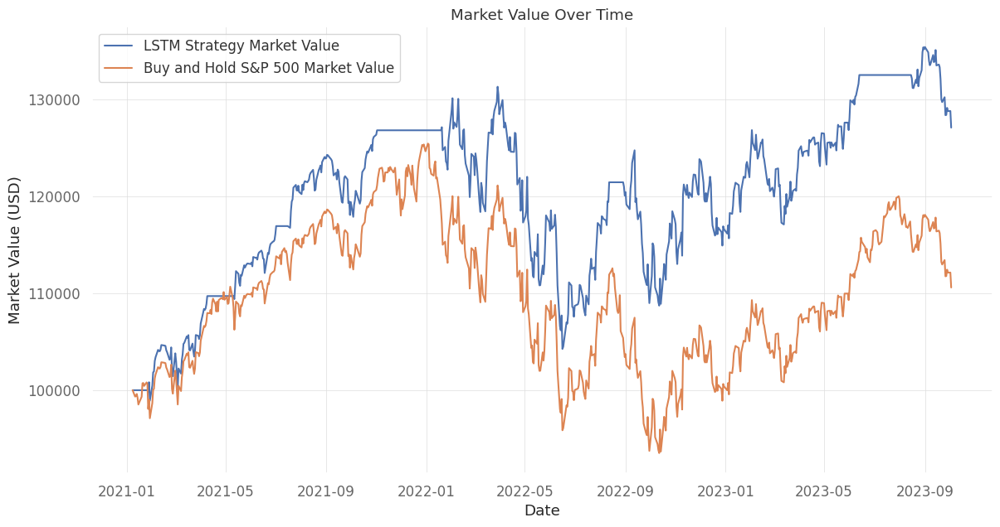

In [223]:
# Download data
import yfinance as yf
import pandas as pd
import numpy as np
import ta
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
import matplotlib.pyplot as plt

data = yf.download("^GSPC", start="2010-01-01", end="2024-01-01")

# Calculate technical indicators
data['MACD'] = ta.trend.MACD(data['Adj Close']).macd()
data['RSI'] = ta.momentum.RSIIndicator(data['Adj Close']).rsi()
bollinger = ta.volatility.BollingerBands(data['Adj Close'])
data['boll_mavg'] = bollinger.bollinger_mavg()
data['boll_hband'] = bollinger.bollinger_hband()
data['boll_lband'] = bollinger.bollinger_lband()
data = data.dropna()

# Create dataset
def create_dataset_with_features(data, feature_columns, time_step=60):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[feature_columns].iloc[i:(i + time_step)].values
        X.append(a)
        Y.append(data['Adj Close'].iloc[i + time_step])
    return np.array(X), np.array(Y)

# Feature columns
feature_columns = ['Adj Close', 'MACD', 'RSI', 'boll_mavg', 'boll_hband', 'boll_lband']
X, y = create_dataset_with_features(data, feature_columns)

# Split into training and testing sets
train_size = int(len(X) * 0.8)
test_size = len(X) - train_size
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

# Data normalization
scaler_X = MinMaxScaler(feature_range=(0, 1))
scaler_y = MinMaxScaler(feature_range=(0, 1))

X_train_scaled = scaler_X.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_test_scaled = scaler_X.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
y_train_scaled = scaler_y.fit_transform(y_train.reshape(-1, 1))
y_test_scaled = scaler_y.transform(y_test.reshape(-1, 1))

# Build LSTM model
model = Sequential([
    LSTM(70, return_sequences=True, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])),
    Dropout(0.2),
    LSTM(70, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])

# Compile and train the model
model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train_scaled, y_train_scaled, epochs=100, batch_size=32, validation_data=(X_test_scaled, y_test_scaled))

# Predict test set data
predicted_prices_test = model.predict(X_test_scaled)
predicted_prices_test = scaler_y.inverse_transform(predicted_prices_test).flatten()

# Apply trading strategy
investment_details_test_lstm2 = []
holding_position = False

initial_cash = 100000
cash = initial_cash
position = 0
test_start_idx = len(X_train)
account_balance = [initial_cash]  # Record account balance changes
market_value = []  # Record market value changes

for i in range(len(predicted_prices_test)):
    if i < len(predicted_prices_test) - 1:
        if not holding_position and predicted_prices_test[i] > data['Adj Close'].iloc[test_start_idx + i] * 1.01 and data['RSI'].iloc[test_start_idx + i] < 50:
            buy_price = data['Open'].iloc[test_start_idx + i + 1]
            stock_per_operation = int(cash / buy_price)
            if stock_per_operation > 0:
                holding_position = True
                buy_date = data.index[test_start_idx + i + 1]
                cash -= buy_price * stock_per_operation
                position += stock_per_operation
                investment_details_test_lstm2.append(('Buy', buy_date.strftime('%Y-%m-%d'), buy_price, cash, 0, 0))  # Set profit/loss and return to 0

        if holding_position and data['RSI'].iloc[test_start_idx + i] > 70:
            sell_price = data['Adj Close'].iloc[test_start_idx + i]
            sell_date = data.index[test_start_idx + i]
            profit_loss_amount = (sell_price - buy_price) * stock_per_operation
            profit_loss_percentage = ((sell_price - buy_price) / buy_price) * 100
            cash += sell_price * stock_per_operation
            position -= stock_per_operation
            investment_details_test_lstm2[-1] = ('Buy', investment_details_test_lstm2[-1][1], investment_details_test_lstm2[-1][2], investment_details_test_lstm2[-1][3], profit_loss_amount, profit_loss_percentage)  # Update profit/loss and return for the buy transaction
            investment_details_test_lstm2.append(('Sell', sell_date.strftime('%Y-%m-%d'), sell_price, cash, profit_loss_amount, profit_loss_percentage))
            holding_position = False
    current_market_value = cash + position * data['Adj Close'].iloc[test_start_idx + i]
    market_value.append(current_market_value)
    account_balance.append(current_market_value)

# Ensure market_value and data.index[train_size:] length match
if len(market_value) > len(data.index[train_size:]):
    market_value = market_value[:len(data.index[train_size:])]
elif len(market_value) < len(data.index[train_size:]):
    data_index_adjusted = data.index[train_size:][:len(market_value)]

# Calculate the market value change of directly investing in S&P 500
initial_investment_sp500 = 100000
sp500_balance = initial_investment_sp500 * (data['Adj Close'][train_size:train_size + len(market_value)] / data['Adj Close'][train_size]).values

# Output trade details and total returns
for detail in investment_details_test_lstm2:
    if detail[0] == 'Buy':
        print(f"Buy on {detail[1]} at price {detail[2]:.2f}, Current Cash: {detail[3]:.2f}")
    else:
        print(f"Sell on {detail[1]} at price {detail[2]:.2f}, Current Cash: {detail[3]:.2f}, Profit/Loss: {detail[4]:.2f}, Return: {detail[5]:.2f}%")

print(f"Final Value of Portfolio: {market_value[-1]:.2f}")
print(f"Total Return on Portfolio: {(market_value[-1] - initial_cash) / initial_cash * 100:.2f}%")
print(f"Test set time period: {data.index[train_size].strftime('%Y-%m-%d')} to {data.index[train_size + len(market_value) - 1].strftime('%Y-%m-%d')}")

# Plot market value change
plt.figure(figsize=(14, 7))
plt.plot(data.index[train_size:train_size + len(market_value)], market_value, label='LSTM Strategy Market Value')
plt.plot(data.index[train_size:train_size + len(sp500_balance)], sp500_balance, label='Buy and Hold S&P 500 Market Value')
plt.title('Market Value Over Time')
plt.xlabel('Date')
plt.ylabel('Market Value (USD)')
plt.legend()
plt.show()


[*********************100%%**********************]  1 of 1 completed


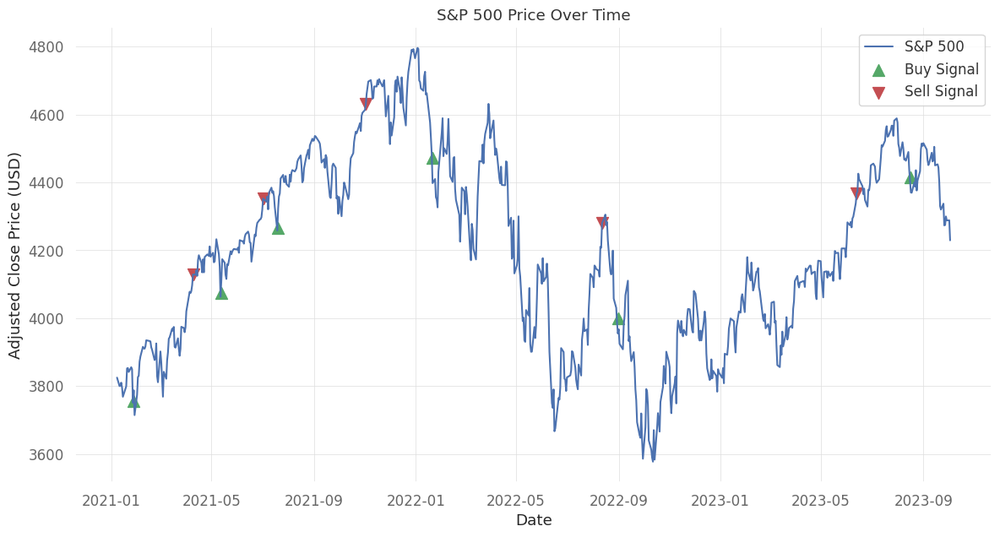

In [224]:
# Download data
data = yf.download("^GSPC", start="2010-01-01", end="2024-01-01")

# Ensure data covers the specified period
test_start_date = "2021-01-08"
test_end_date = "2023-10-03"

# Filter data to the specified period
test_data = data[(data.index >= test_start_date) & (data.index <= test_end_date)]

# Example buy and sell signal data extracted from the previous code
buy_signals = []
sell_signals = []
for detail in investment_details_test_lstm2:
    if detail[0] == 'Buy':
        buy_signals.append((detail[1], detail[2]))
    elif detail[0] == 'Sell':
        sell_signals.append((detail[1], detail[2]))

# Convert to DataFrame for easier plotting
buy_df = pd.DataFrame(buy_signals, columns=['Date', 'Price'])
buy_df['Date'] = pd.to_datetime(buy_df['Date'])
sell_df = pd.DataFrame(sell_signals, columns=['Date', 'Price'])
sell_df['Date'] = pd.to_datetime(sell_df['Date'])

# Plot S&P 500 price
plt.figure(figsize=(14, 7))
plt.plot(test_data.index, test_data['Adj Close'], label='S&P 500')

# Plot buy and sell signals
plt.scatter(buy_df['Date'], buy_df['Price'], marker='^', color='g', label='Buy Signal', s=100)
plt.scatter(sell_df['Date'], sell_df['Price'], marker='v', color='r', label='Sell Signal', s=100)

plt.title('S&P 500 Price Over Time')
plt.xlabel('Date')
plt.ylabel('Adjusted Close Price (USD)')
plt.legend()
plt.show()


In [225]:
import numpy as np

# Calculate CAGR
def calculate_cagr(final_value, initial_value, years):
    return (final_value / initial_value) ** (1 / years) - 1

years = (data.index[train_size + len(market_value) - 1] - data.index[train_size]).days / 365.25
cagr = calculate_cagr(market_value[-1], initial_cash, years)
print(f"CAGR: {cagr * 100:.2f}%")

CAGR: 9.15%


In [226]:

# Function to calculate Sharpe Ratio
def calculate_sharpe_ratio(returns, risk_free_rate=0.01):
    excess_returns = returns - risk_free_rate / 252
    return excess_returns.mean() / excess_returns.std() * np.sqrt(252)

# Calculate daily returns
daily_returns = np.diff(market_value) / market_value[:-1]

# Calculate Sharpe Ratio
sharpe_ratio = calculate_sharpe_ratio(daily_returns)
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")


Sharpe Ratio: 0.55


## Appendix

 ### Appendix A: MSAR + KAMA (Markov Switching Auto-Correlation + Kaufman's)

In [227]:
'''
MSAR + KAMA Implementation
'''
ms_kama_model =  sm.tsa.MarkovRegression(idx_daily['SP500'], k_regimes=2, trend='n', switching_variance=True)
ms_kama_model_fit = ms_kama_model.fit()

ms_kama_model_result = pd.DataFrame()
ms_kama_model_result['Log Return'] = idx_daily['SP500']
ms_kama_prob_df = pd.DataFrame(ms_kama_model_fit.smoothed_marginal_probabilities, columns=[0,1])
ms_kama_model_result['State'] = ms_kama_prob_df.idxmax(axis=1)


kama_indicator = KAMAIndicator(close=ms_kama_model_result['Log Return'], window=10, pow1=2, pow2=30)
ms_kama_model_result['KAMA'] = kama_indicator.kama()
n = 10
gamma = 0.5
ms_kama_model_result['Sigma_KAMA'] = ms_kama_model_result['KAMA'].rolling(window=n).std()
ms_kama_model_result['Filter'] = gamma * ms_kama_model_result['Sigma_KAMA']
ms_kama_model_result['Signal'] = 'Hold'
for i in range(n, len(ms_kama_model_result)):
    if ms_kama_model_result['State'].iloc[i] == 0:
        if ms_kama_model_result['KAMA'].iloc[i] > ms_kama_model_result['KAMA'].iloc[i-n:i].min() + ms_kama_model_result['Filter'].iloc[i]:
            ms_kama_model_result.at[ms_kama_model_result.index[i], 'Signal'] = 'Low_Variance_Bullish'
        elif ms_kama_model_result['KAMA'].iloc[i] < ms_kama_model_result['KAMA'].iloc[i-n:i].max() - ms_kama_model_result['Filter'].iloc[i]:
            ms_kama_model_result.at[ms_kama_model_result.index[i], 'Signal'] = 'Low_Variance_Bearish'
    elif ms_kama_model_result['State'].iloc[i] == 1:
        if ms_kama_model_result['KAMA'].iloc[i] > ms_kama_model_result['KAMA'].iloc[i-n:i].min() + ms_kama_model_result['Filter'].iloc[i]:
            ms_kama_model_result.at[ms_kama_model_result.index[i], 'Signal'] = 'High_Variance_Bullish'
        elif ms_kama_model_result['KAMA'].iloc[i] < ms_kama_model_result['KAMA'].iloc[i-n:i].max() - ms_kama_model_result['Filter'].iloc[i]:
            ms_kama_model_result.at[ms_kama_model_result.index[i], 'Signal'] = 'High_Variance_Bearish'

ms_kama_model_result.dropna(inplace=True)
#ms_kama_model_result['Adj_Close'] = temp_adj_cls['Adj Close'] #data['S&P 500']
ms_kama_model_result.head(20)

,Log Return,State,KAMA,Sigma_KAMA,Filter,Signal
Date,,,,,,
1999-01-21,-0.017225,1,-0.002357,0.000340,0.000170,High_Variance_Bullish
1999-01-22,-0.008105,1,-0.002401,0.000350,0.000175,High_Variance_Bullish
1999-01-25,0.007149,1,-0.002347,0.000343,0.000171,High_Variance_Bullish
1999-01-26,0.014745,1,-0.001940,0.000347,0.000173,High_Variance_Bullish
1999-01-27,-0.007325,1,-0.002002,0.000341,0.000170,High_Variance_Bullish
1999-01-28,0.017700,1,-0.001627,0.000357,0.000179,High_Variance_Bullish
1999-01-29,0.011214,1,-0.001267,0.000364,0.000182,High_Variance_Bullish
1999-02-01,-0.005202,1,-0.001411,0.000399,0.000200,High_Variance_Bullish
1999-02-02,-0.008686,1,-0.001548,0.000412,0.000206,High_Variance_Bullish


In [228]:
ms_kama_model_result

,Log Return,State,KAMA,Sigma_KAMA,Filter,Signal
Date,,,,,,
1999-01-21,-0.017225,1,-0.002357,0.000340,0.000170,High_Variance_Bullish
1999-01-22,-0.008105,1,-0.002401,0.000350,0.000175,High_Variance_Bullish
1999-01-25,0.007149,1,-0.002347,0.000343,0.000171,High_Variance_Bullish
1999-01-26,0.014745,1,-0.001940,0.000347,0.000173,High_Variance_Bullish
1999-01-27,-0.007325,1,-0.002002,0.000341,0.000170,High_Variance_Bullish
...,...,...,...,...,...,...
2024-06-14,-0.000394,0,0.001267,0.000257,0.000129,Low_Variance_Bullish
2024-06-17,0.007635,0,0.001397,0.000269,0.000134,Low_Variance_Bullish
2024-06-18,0.002518,0,0.001404,0.000257,0.000129,Low_Variance_Bullish


In [229]:
temp_adj_cls

,Date,Adj Close
0,1927-12-30,17.660000
1,1928-01-03,17.760000
2,1928-01-04,17.719999
3,1928-01-05,17.549999
4,1928-01-06,17.660000
...,...,...
24229,2024-06-14,5431.600098
24230,2024-06-17,5473.229980
24231,2024-06-18,5487.029785
24232,2024-06-20,5473.169922


In [230]:
ms_kama_model_result =  pd.merge(ms_kama_model_result,temp_adj_cls, on='Date')
ms_kama_model_result

,Date,Log Return,State,KAMA,Sigma_KAMA,Filter,Signal,Adj Close
0,1999-01-21,-0.017225,1,-0.002357,0.000340,0.000170,High_Variance_Bullish,1235.160034
1,1999-01-22,-0.008105,1,-0.002401,0.000350,0.000175,High_Variance_Bullish,1225.189941
2,1999-01-25,0.007149,1,-0.002347,0.000343,0.000171,High_Variance_Bullish,1233.979980
3,1999-01-26,0.014745,1,-0.001940,0.000347,0.000173,High_Variance_Bullish,1252.310059
4,1999-01-27,-0.007325,1,-0.002002,0.000341,0.000170,High_Variance_Bullish,1243.170044
...,...,...,...,...,...,...,...,...
6391,2024-06-14,-0.000394,0,0.001267,0.000257,0.000129,Low_Variance_Bullish,5431.600098
6392,2024-06-17,0.007635,0,0.001397,0.000269,0.000134,Low_Variance_Bullish,5473.229980
6393,2024-06-18,0.002518,0,0.001404,0.000257,0.000129,Low_Variance_Bullish,5487.029785
6394,2024-06-20,-0.002529,0,0.001180,0.000245,0.000122,Low_Variance_Bullish,5473.169922


In [231]:
'''
description of each state (MSAR)
'''
ms_kama_model_result.groupby('State')['Log Return'].describe()

,count,mean,std,min,25%,50%,75%,max
State,,,,,,,,
0,4330.0,0.000701,0.007008,-0.025328,-0.003141,0.000794,0.004951,0.025086
1,2066.0,-0.000758,0.018999,-0.127652,-0.011751,-0.000548,0.010749,0.109572


In [232]:
'''
description of each state (MSAR + KAMA)
'''
ms_kama_model_result.groupby('Signal')['Log Return'].describe()

,count,mean,std,min,25%,50%,75%,max
Signal,,,,,,,,
High_Variance_Bearish,646.0,-0.009704,0.017952,-0.127652,-0.019242,-0.008474,0.002598,0.046317
High_Variance_Bullish,1420.0,0.003311,0.018049,-0.099945,-0.007248,0.002426,0.013961,0.109572
Low_Variance_Bearish,1038.0,-0.003369,0.007572,-0.025328,-0.008315,-0.002690,0.001581,0.017730
Low_Variance_Bullish,3292.0,0.001985,0.006298,-0.020585,-0.001736,0.001660,0.005716,0.025086


In [233]:
'''
Plotting Classified classes against Adjusted Close Price
'''
ms_kama_model_result.reset_index(inplace=True)
range_ = ["Orange","Red", "#B4E1B4","DarkGreen"]

ms_kama_model_chart = alt.Chart(ms_kama_model_result).mark_circle(size=15).encode(x=alt.X('Date',bin=False),y='Adj Close',color= alt.Color('Signal:O', scale= alt.Scale(range=range_))).properties(width=800).configure_axis(
    grid=False)
ms_kama_model_chart

alt.Chart(...)

In [234]:
'''
Plotting Classified classes against Volume
'''

ms_kama_model_result.set_index('Date',inplace = True)
ms_kama_model_result['Volume'] = vol_data['^GSPC']
ms_kama_model_result.reset_index(inplace=True)

range_ = ["Orange","Red", "#B4E1B4","DarkGreen"]
ms_kama_model_vol_chart = alt.Chart(ms_kama_model_result).mark_circle(size=15).encode(x=alt.X('Date',bin=False),y='Volume',color= alt.Color('Signal:O', scale= alt.Scale(range=range_))).properties(width=800).configure_axis(
    grid=False)
ms_kama_model_vol_chart

alt.Chart(...)

### Appendix B:  MSAR + Splines

In [235]:
'''
MSAR + SPlines Model
'''
spline_msr_data =pd.DataFrame()
spline_msr_data.index = idx_daily['SP500'].index
spline_msr_data['log_return'] = idx_daily['SP500'].values
spline_msr_data['RollingMean'] = spline_msr_data['log_return'].rolling(window=20).mean()
spline_msr_data['RollingStd'] = spline_msr_data['log_return'].rolling(window=20).std()
spline_msr_data.dropna(inplace=True)
spl = UnivariateSpline(spline_msr_data.index.map(pd.Timestamp.toordinal), spline_msr_data['RollingMean'], s=5)

spline_msr_data['SplineMean'] = spl(spline_msr_data.index.map(pd.Timestamp.toordinal))
from sklearn.cluster import KMeans

features = spline_msr_data[['SplineMean', 'RollingStd']].dropna()

ms_spline_model = sm.tsa.MarkovRegression(features['SplineMean'],exog=features['RollingStd'],  k_regimes=4, trend='n', switching_variance=True)
ms_spline_model_fit = ms_spline_model.fit()

In [236]:
'''
Probability dataframe
'''
ms_spline_prob_df = pd.DataFrame(ms_spline_model_fit.smoothed_marginal_probabilities)
ms_spline_prob_df['State'] = ms_spline_prob_df.idxmax(axis=1)
ms_spline_prob_df

,0,1,2,3,State
Date,,,,,
1999-01-22,9.999749e-01,2.505781e-05,1.651020e-14,5.862165e-22,0
1999-01-25,9.999982e-01,1.760848e-06,1.230220e-17,7.817567e-26,0
1999-01-26,9.999999e-01,1.357576e-07,4.130576e-19,2.899633e-27,0
1999-01-27,1.000000e+00,2.339000e-08,2.478126e-20,1.120383e-27,0
1999-01-28,1.000000e+00,1.560855e-08,2.625153e-21,3.981895e-28,0
...,...,...,...,...,...
2024-06-14,7.058876e-189,1.915810e-15,1.528472e-06,9.999985e-01,3
2024-06-17,2.999803e-189,1.976652e-15,1.805150e-06,9.999982e-01,3
2024-06-18,3.502770e-189,2.001038e-15,1.830391e-06,9.999982e-01,3


In [237]:
'''
Combining all results
'''
temp_prob_df = ms_spline_prob_df['State'].reset_index()
ms_spline_result =  pd.merge(temp_adj_cls,temp_log_return, on='Date')
ms_spline_result =  pd.merge(ms_spline_result,temp_prob_df, on='Date')
ms_spline_result.dropna(inplace=True)
ms_spline_result.head()

,Date,Adj Close,Log Return,State
0,1999-01-22,1225.189941,-0.008105,0
1,1999-01-25,1233.979980,0.007149,0
2,1999-01-26,1252.310059,0.014745,0
3,1999-01-27,1243.170044,-0.007325,0
4,1999-01-28,1265.369995,0.017700,0


In [238]:
'''
description of each state
'''
ms_spline_result.groupby('State')['Log Return'].describe()

,count,mean,std,min,25%,50%,75%,max
State,,,,,,,,
0,1680.0,-0.000009,0.011993,-0.060045,-0.006858,0.000197,0.006543,0.055744
1,1330.0,-0.000134,0.018034,-0.127652,-0.006285,0.000819,0.006784,0.109572
2,1523.0,0.000510,0.011568,-0.060753,-0.005611,0.000872,0.007109,0.053953
3,1862.0,0.000485,0.006669,-0.035758,-0.002806,0.000573,0.004295,0.023512


In [239]:
'''
plotting classified states against adjusted closed price
'''
range_ = ["Red", "Orange", "#B4E1B4", "DarkGreen"]

ms_spline_chart = alt.Chart(ms_spline_result).mark_circle(size=15).encode(x=alt.X('Date',bin=False),y='Adj Close',color= alt.Color('State:O', scale = alt.Scale(range=range_))).properties(width=800).configure_axis(
    grid=False)
ms_spline_chart

alt.Chart(...)

In [240]:
'''
plotting classified states against volume
'''
range_ = ["Red", "Orange", "#B4E1B4", "DarkGreen"]

ms_spline_result.set_index('Date',inplace = True)
ms_spline_result['Volume'] = vol_data['^GSPC']
ms_spline_result.reset_index(inplace=True)

ms_spline_vol_chart = alt.Chart(ms_spline_result).mark_circle(size=15).encode(x=alt.X('Date',bin=False),y='Volume',color= alt.Color('State:O', scale=alt.Scale(range=range_))).properties(width=800).configure_axis(
    grid=False)
ms_spline_vol_chart

alt.Chart(...)

### Appendix C: Comparing model with AIC, BIC and simple backtesting stratergy

In [241]:
'''
AIC of all 3 markov- models
'''
print(markov_model_fit.aic,ms_kama_model_fit.aic,ms_spline_model_fit.aic)
'''
BIC of all 3 markov- models
'''
print(markov_model_fit.bic,ms_kama_model_fit.bic,ms_spline_model_fit.bic)

-41255.10692786859 -40693.61143780862 -105759.93993769435
-41146.84711378454 -40666.54648428761 -105624.67450341409


In [242]:
'''
A)  Back Testing MSAR with simpel stratergy
'''
markov_result = pd.read_csv("Market_States.csv")
markov_result.groupby('State')['Log Return'].describe()

,count,mean,std,min,25%,50%,75%,max
State,,,,,,,,
0,3147.0,0.000910,0.005710,-0.021087,-0.002376,0.000872,0.004448,0.021980
1,1470.0,-0.000168,0.015310,-0.044199,-0.012722,-0.000172,0.012113,0.053953
2,1307.0,0.000108,0.007896,-0.023947,-0.005424,-0.000194,0.005450,0.024905
3,490.0,-0.002537,0.029656,-0.127652,-0.021450,-0.001633,0.015377,0.109572


Final equity: $114876.76
Cumulative returns: 1048.77%
Sharpe Ratio: 1.06


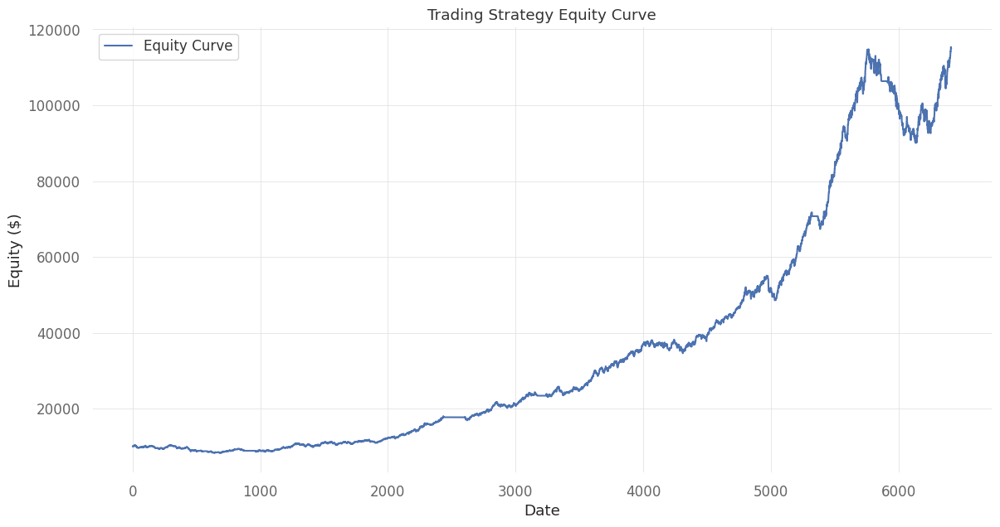

In [243]:
initial_cash = 10000
cash = initial_cash
position = 0
equity_curve = []

for index, row in markov_result.iterrows():
    if (row['Signal'] == 'Low_Variance_Bullish' or row['Signal'] == 'High_Variance_Bullish') and (cash > 0):
            position = cash / row['Adj Close']
            cash = 0
    elif (row['Signal'] == 'Low_Variance_Bearish' or row['Signal'] == 'High_Variance_Bearish') and (position > 0):
            cash = position * row['Adj Close']
            position = 0
    equity = cash + position * row['Adj Close']
    equity_curve.append(equity)

markov_result['Equity'] = equity_curve
returns = markov_result['Equity'].pct_change().dropna()
cumulative_returns = (1 + returns).cumprod() - 1
sharpe_ratio = (returns.mean() / returns.std()) * np.sqrt(252)

print(f"Final equity: ${markov_result['Equity'].iloc[-1]:.2f}")
print(f"Cumulative returns: {cumulative_returns.iloc[-1]:.2%}")
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
plt.figure(figsize=(14, 7))
plt.plot(markov_result['Equity'], label='Equity Curve')
plt.title('Trading Strategy Equity Curve')
plt.xlabel('Date')
plt.ylabel('Equity ($)')
plt.legend()
plt.show()

In [244]:
'''
B) Back Testing MSAR + KAMA with simpel stratergy
'''

ms_kama_model_result.head(5)

,Date,index,Log Return,State,KAMA,Sigma_KAMA,Filter,Signal,Adj Close,Volume
0,1999-01-21,0,-0.017225,1,-0.002357,0.000340,0.000170,High_Variance_Bullish,1235.160034,871800000.0
1,1999-01-22,1,-0.008105,1,-0.002401,0.000350,0.000175,High_Variance_Bullish,1225.189941,785900000.0
2,1999-01-25,2,0.007149,1,-0.002347,0.000343,0.000171,High_Variance_Bullish,1233.979980,723900000.0
3,1999-01-26,3,0.014745,1,-0.001940,0.000347,0.000173,High_Variance_Bullish,1252.310059,896400000.0
4,1999-01-27,4,-0.007325,1,-0.002002,0.000341,0.000170,High_Variance_Bullish,1243.170044,893800000.0


Final equity: $20652.20
Cumulative returns: 106.52%
Sharpe Ratio: 0.26


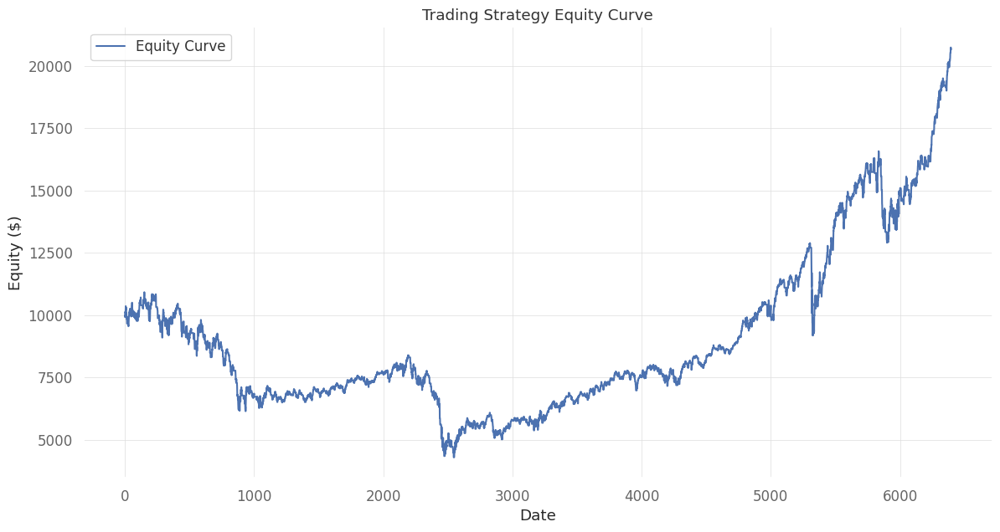

In [245]:
initial_cash = 10000
cash = initial_cash
position = 0
equity_curve = []

for index, row in ms_kama_model_result.iterrows():
    if (row['Signal'] == 'Low_Variance_Bullish' or row['Signal'] == 'High_Variance_Bullish') and (cash > 0):
            position = cash / row['Adj Close']
            cash = 0
    elif (row['Signal'] == 'Low_Variance_Bearish' or row['Signal'] == 'High_Variance_Bearish') and (position > 0):
            cash = position * row['Adj Close']
            position = 0
    equity = cash + position * row['Adj Close']
    equity_curve.append(equity)

ms_kama_model_result['Equity'] = equity_curve
returns = ms_kama_model_result['Equity'].pct_change().dropna()
cumulative_returns = (1 + returns).cumprod() - 1
sharpe_ratio = (returns.mean() / returns.std()) * np.sqrt(252)

print(f"Final equity: ${ms_kama_model_result['Equity'].iloc[-1]:.2f}")
print(f"Cumulative returns: {cumulative_returns.iloc[-1]:.2%}")
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
plt.figure(figsize=(14, 7))
plt.plot(ms_kama_model_result['Equity'], label='Equity Curve')
plt.title('Trading Strategy Equity Curve')
plt.xlabel('Date')
plt.ylabel('Equity ($)')
plt.legend()
plt.show()


In [246]:
'''
C) Back Testing MSAR + Spline with simpel stratergy
'''
ms_spline_result.groupby('State')['Log Return'].describe()

,count,mean,std,min,25%,50%,75%,max
State,,,,,,,,
0,1680.0,-0.000009,0.011993,-0.060045,-0.006858,0.000197,0.006543,0.055744
1,1330.0,-0.000134,0.018034,-0.127652,-0.006285,0.000819,0.006784,0.109572
2,1523.0,0.000510,0.011568,-0.060753,-0.005611,0.000872,0.007109,0.053953
3,1862.0,0.000485,0.006669,-0.035758,-0.002806,0.000573,0.004295,0.023512


In [247]:
ms_spline_result['Signal'] = 'Hold'
ms_spline_result.loc[markov_result['State'] == 0, 'Signal'] = 'High_Variance_Bearish'
ms_spline_result.loc[markov_result['State'] == 1, 'Signal'] = 'High_Variance_Bullish'
ms_spline_result.loc[markov_result['State'] == 2, 'Signal'] = 'Mod_Variance_Bullish'
ms_spline_result.loc[markov_result['State'] == 3, 'Signal'] = 'Low_Variance_Bullish'

ms_spline_result

,Date,Adj Close,Log Return,State,Volume,Signal
0,1999-01-22,1225.189941,-0.008105,0,785900000.0,High_Variance_Bullish
1,1999-01-25,1233.979980,0.007149,0,723900000.0,Mod_Variance_Bullish
2,1999-01-26,1252.310059,0.014745,0,896400000.0,High_Variance_Bullish
3,1999-01-27,1243.170044,-0.007325,0,893800000.0,Mod_Variance_Bullish
4,1999-01-28,1265.369995,0.017700,0,848800000.0,High_Variance_Bullish
...,...,...,...,...,...,...
6390,2024-06-14,5431.600098,-0.000394,3,NaN,High_Variance_Bearish
6391,2024-06-17,5473.229980,0.007635,3,NaN,High_Variance_Bearish
6392,2024-06-18,5487.029785,0.002518,3,NaN,High_Variance_Bearish
6393,2024-06-20,5473.169922,-0.002529,3,NaN,High_Variance_Bearish


Final equity: $27699.97
Cumulative returns: 177.00%
Sharpe Ratio: 0.32


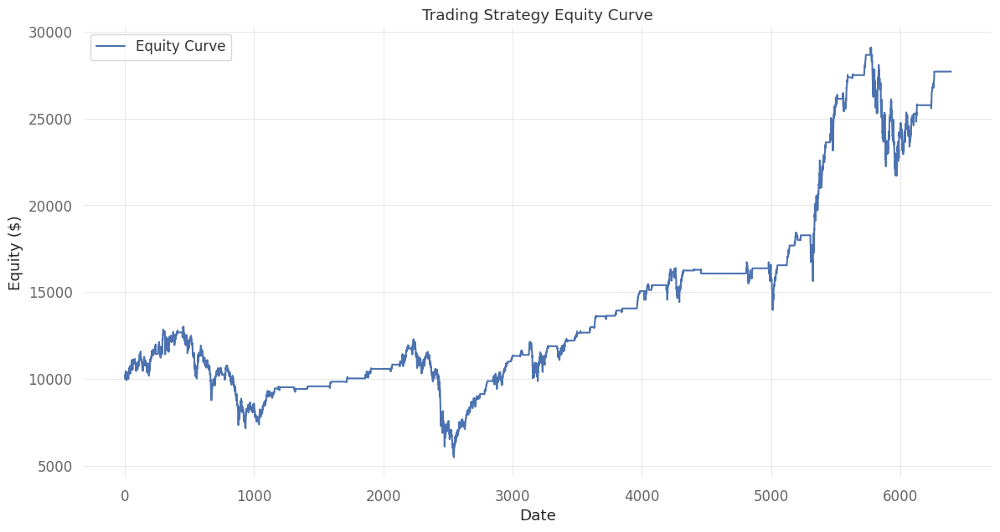

In [248]:
initial_cash = 10000
cash = initial_cash
position = 0
equity_curve = []

for index, row in ms_spline_result.iterrows():
    if (row['Signal'] == 'Low_Variance_Bullish' or row['Signal'] == 'High_Variance_Bullish' or row['Signal'] == 'Mod_Variance_Bullish') and (cash > 0):
            position = cash / row['Adj Close']
            cash = 0
    elif row['Signal'] == 'High_Variance_Bearish' and position > 0:
            cash = position * row['Adj Close']
            position = 0
    equity = cash + position * row['Adj Close']
    equity_curve.append(equity)

ms_spline_result['Equity'] = equity_curve
returns = ms_spline_result['Equity'].pct_change().dropna()
cumulative_returns = (1 + returns).cumprod() - 1
sharpe_ratio = (returns.mean() / returns.std()) * np.sqrt(252)

print(f"Final equity: ${ms_spline_result['Equity'].iloc[-1]:.2f}")
print(f"Cumulative returns: {cumulative_returns.iloc[-1]:.2%}")
print(f"Sharpe Ratio: {sharpe_ratio:.2f}")
plt.figure(figsize=(14, 7))
plt.plot(ms_spline_result['Equity'], label='Equity Curve')
plt.title('Trading Strategy Equity Curve')
plt.xlabel('Date')
plt.ylabel('Equity ($)')
plt.legend()
plt.show()


### Appendix D: Fine Tuning Markov Based Models

### MSAR

#### The code of this could be seen in https://github.com/aiqtech-vip/capstone/blob/main/Experiments/MarkovBasedModel_and_FineTuning.ipynb.

#### The result is:

| Name | AIC | BIC | Equity | Returns  | Sharpe_ratio |
|------|-----|-----|--------|----------|--------------|
| 2 State Markov | -25806.276654 | -25781.028114 | 78211.34 | 682.11% |1.47|
|3 State Markov | -26283.756014 | -26226.946798 | 78211.34 | 682.11% | 1.47|
| 4 State Markov| -26381.497758 | -26280.503596 | 89479.28 | 794.79% |1.40 |
| 5 State Markov | -26395.818093 | -26238.014715 | 46323.23 | 363.23%  | 1.04 |
| 6 State Markov| -26395.818093 | -26238.014715 | 69163.12   | 591.63%  | 1.00|
| 7 State Markov | -26395.818093 | -26238.014715 | 88876.71| 788.77%  | 1.42|
| Monthly Data with 4 state| -3754.504172  | -3673.883635  | 39702.71| 297.03%  | 3.73|
| With additional Index| -44395.776649 |-44118.042704 |55037.09|450.37% |0.75 |
| With additional index + interest, Gold, crude oil | -43608.119801 | -43254.764113 | 27486.46   | 174.86%  | 0.42|


### MSAR + Spline

#### The code of this could be seen in https://github.com/aiqtech-vip/capstone/blob/main/Experiments/MarkovBasedModel_and_FineTuning.ipynb.

#### The result is:

| Name                            | AIC           | BIC           | Equity      | Returns  | Sharpe_ratio |
|---------------------------------|---------------|---------------|-------------|----------|--------------|
| 2 State Markov Spline           | -58224.145745 | -58186.300989 | 7616.02    | -23.84%  | -0.01        |
| 3 State Markov Spline           | -60064.125037 | -59988.435525 | 38467.20   | 284.67%  | 0.64         |
| 4 State Markov Spline           | -62242.236186 | -62116.087000 | 38311.24   | 283.11%  | 0.64         |
| 5 State Markov Spline           | -63461.880624 | -63272.656845 | 38311.24   | 283.11%  | 0.64         |
| 6 State Markov Spline           | -64944.421941 | -64679.508650 | 41316.71   | 313.17%  | 0.66         |
| 7 State Markov Spline           | -65676.145545 | -65322.927822 | 39804.51   | 298.05%  | 0.64         |
| 5 days rolling                  | -60706.971794 | -60580.748743 | 39342.74   | 293.43%  | 0.65         |
| 10 days rolling                 | -61545.658804 | -61419.480039 | 43053.96   | 330.54%  | 0.69         |
| 20 days rolling                 | -61495.745193 | -61369.660244 | 38397.29   | 283.97%  | 0.63         |
| 63 days rolling                 | -60095.861671 | -59970.085955 | 22051.62   | 120.52%  | 0.37         |
| 126 days rolling                | -57906.692449 | -57781.555112 | 32590.61   | 225.91%  | 0.56         |
| 252 days rolling                | -55511.203590 | -55387.413148 | 16592.44   | 65.92%   | 0.30         |
| Monthly data                    | -2851.110900  | -2785.548607  | 36858.32   | 268.58%  | 4.01         |
| With 1st set exog data          | -17991.691153 | -17698.132655 | 9731.87    | -2.68%   | 0.08         |
| With 2nd set exog data          | -17766.092474 | -17492.104542 | 13674.47   | 36.74%   | 0.57         |
| With 3rd set exog data          | -17183.445407 | -16831.175209 | 13344.87   | 33.45%   | 0.54         |


### MSAR + KAMA

#### The code of this could be seen in https://github.com/aiqtech-vip/capstone/blob/main/Experiments/MarkovBasedModel_and_FineTuning.ipynb.

#### The result is:

| Name                                       | AIC           | BIC           | Equity      | Returns  | Sharpe_ratio |
|--------------------------------------------|---------------|---------------|-------------|----------|--------------|
| Rolling 5 State Markov + Rolling Avg       | -25806.276654 | -25781.028114 | 9183.92    | -8.16%   | 0.05         |
| Rolling 10 State Markov + Rolling Avg      | -25806.276654 | -25781.028114 | 17113.19   | 71.13%   | 0.29         |
| Rolling 20 State Markov + Rolling Avg      | -25806.276654 | -25781.028114 | 17561.17   | 75.61%   | 0.29         |
| Rolling 63 State Markov + Rolling Avg      | -25806.276654 | -25781.028114 | 12202.76   | 22.03%   | 0.16         |
| Rolling 126 State Markov + Rolling Avg     | -25806.276654 | -25781.028114 | 16207.61   | 62.08%   | 0.26         |
| Rolling 252 State Markov + Rolling Avg     | -25806.276654 | -25781.028114 | 20891.95   | 108.92%  | 0.35         |
| Sensitivity .1 State Markov + Rolling Avg  | -25806.276654 | -25781.028114 | 12230.27   | 22.30%   | 0.16         |
| Sensitivity .2 State Markov + Rolling Avg  | -25806.276654 | -25781.028114 | 12795.86   | 27.96%   | 0.18         |
| Sensitivity .3 State Markov + Rolling Avg  | -25806.276654 | -25781.028114 | 14776.22   | 47.76%   | 0.23         |
| Sensitivity .5 State Markov + Rolling Avg  | -25806.276654 | -25781.028114 | 17561.17   | 75.61%   | 0.29         |
| Sensitivity .7 State Markov + Rolling Avg  | -25806.276654 | -25781.028114 | 22524.87   | 125.25%  | 0.40         |
| Sensitivity 1 State Markov + Rolling Avg   | -25806.276654 | -25781.028114 | 22883.28   | 128.83%  | 0.42         |
| State 4 State Markov + Rolling Avg         | -25806.276654 | -25781.028114 | 21463.61   | 114.64%  | 0.37         |
| State 6 State Markov + Rolling Avg         | -26283.756014 | -26226.946798 | 21463.61   | 114.64%  | 0.37         |




## Appendix E: Experiment to extend LSTM Model (Predicting Price)

[*********************100%%**********************]  1 of 1 completed


Epoch 1/5
101/101 [==============================] - 15s 92ms/step - loss: 0.0105 - val_loss: 0.0279
Epoch 2/5
101/101 [==============================] - 10s 95ms/step - loss: 0.0024 - val_loss: 0.0203
Epoch 3/5
101/101 [==============================] - 10s 97ms/step - loss: 0.0019 - val_loss: 0.0120
Epoch 4/5
101/101 [==============================] - 8s 82ms/step - loss: 0.0016 - val_loss: 0.0137
Epoch 5/5
26/26 [==============================] - 1s 35ms/step
Train RMSE: 34.85190934839757
Test RMSE: 266.3433403284963


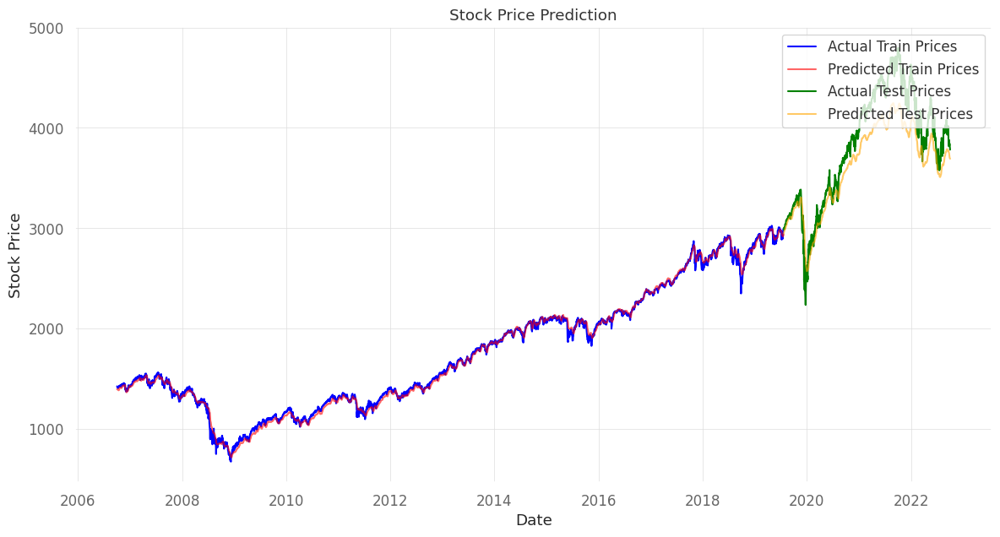

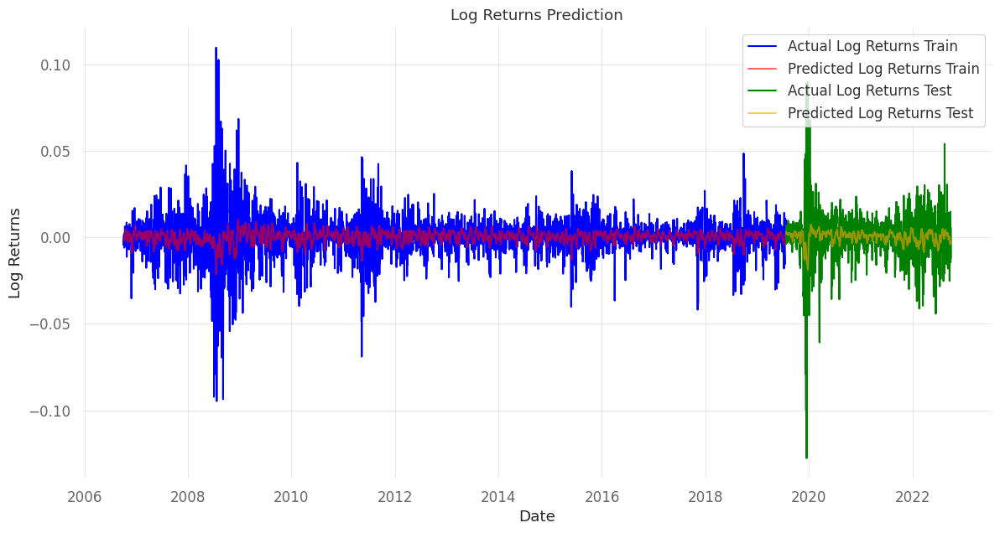

In [249]:
'''
Jamie's Model.
NOTE: The code was added here because some extension of this method is used for experiement
'''

ticker = "^GSPC" #"XLP"
data = yf.download(ticker, start="2006-08-25", end="2022-12-30")

data['MACD'] = ta.trend.MACD(data['Adj Close']).macd()
data['RSI'] = ta.momentum.RSIIndicator(data['Adj Close']).rsi()
bollinger = ta.volatility.BollingerBands(data['Adj Close'])
data['boll_mavg'] = bollinger.bollinger_mavg()
data['boll_hband'] = bollinger.bollinger_hband()
data['boll_lband'] = bollinger.bollinger_lband()
data = data.dropna()

def create_dataset_with_features(data, feature_columns, time_step=60):
    X, Y = [], []
    for i in range(len(data) - time_step - 1):
        a = data[feature_columns].iloc[i:(i + time_step)].values
        X.append(a)
        Y.append(data['Adj Close'].iloc[i + time_step])
    return np.array(X), np.array(Y)

feature_columns = ['Adj Close', 'MACD', 'RSI', 'boll_mavg', 'boll_hband', 'boll_lband']
X, y = create_dataset_with_features(data, feature_columns)

train_size = int(len(X) * 0.8)
test_size = len(X) - train_size
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

scaler = MinMaxScaler(feature_range=(0, 1))
X_train_scaled = scaler.fit_transform(X_train.reshape(-1, X_train.shape[-1])).reshape(X_train.shape)
X_test_scaled = scaler.transform(X_test.reshape(-1, X_test.shape[-1])).reshape(X_test.shape)
y_train_scaled = scaler.fit_transform(y_train.reshape(-1, 1))
y_test_scaled = scaler.transform(y_test.reshape(-1, 1))

model = Sequential([
    LSTM(70, return_sequences=True, input_shape=(X_train_scaled.shape[1], X_train_scaled.shape[2])),
    Dropout(0.2),
    LSTM(70, return_sequences=False),
    Dropout(0.2),
    Dense(25),
    Dense(1)
])

model.compile(optimizer='adam', loss='mean_squared_error')
model.fit(X_train_scaled, y_train_scaled, epochs=5, batch_size=32, validation_data=(X_test_scaled, y_test_scaled))

train_predict = model.predict(X_train_scaled)
test_predict = model.predict(X_test_scaled)
train_predict = scaler.inverse_transform(train_predict)
test_predict = scaler.inverse_transform(test_predict)
actual_y_train = scaler.inverse_transform(y_train_scaled)
actual_y_test = scaler.inverse_transform(y_test_scaled)

train_rmse = np.sqrt(mean_squared_error(actual_y_train, train_predict))
test_rmse = np.sqrt(mean_squared_error(actual_y_test, test_predict))

print(f'Train RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')

plt.figure(figsize=(14, 7))

plt.plot(data.index[:len(train_predict)], actual_y_train, label='Actual Train Prices', color='blue')
plt.plot(data.index[:len(train_predict)], train_predict, label='Predicted Train Prices', color='red', alpha=0.6)
plt.plot(data.index[len(train_predict):len(train_predict) + len(test_predict)], actual_y_test, label='Actual Test Prices', color='green')
plt.plot(data.index[len(train_predict):len(train_predict) + len(test_predict)], test_predict, label='Predicted Test Prices', color='orange', alpha=0.6)

plt.legend(loc='upper right')
plt.title('Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

plt.figure(figsize=(14, 7))

actual_log_returns_train = np.log(actual_y_train[1:] / actual_y_train[:-1])
predicted_log_returns_train = np.log(train_predict[1:] / train_predict[:-1])
actual_log_returns_test = np.log(actual_y_test[1:] / actual_y_test[:-1])
predicted_log_returns_test = np.log(test_predict[1:] / test_predict[:-1])

plt.plot(data.index[1:len(actual_log_returns_train) + 1], actual_log_returns_train, label='Actual Log Returns Train', color='blue')
plt.plot(data.index[1:len(predicted_log_returns_train) + 1], predicted_log_returns_train, label='Predicted Log Returns Train', color='red', alpha=0.6)
plt.plot(data.index[len(predicted_log_returns_train) + 1:len(predicted_log_returns_train) + 1 + len(actual_log_returns_test)], actual_log_returns_test, label='Actual Log Returns Test', color='green')
plt.plot(data.index[len(predicted_log_returns_train) + 1:len(predicted_log_returns_train) + 1 + len(predicted_log_returns_test)], predicted_log_returns_test, label='Predicted Log Returns Test', color='orange', alpha=0.6)

plt.legend(loc='upper right')

plt.title('Log Returns Prediction')
plt.xlabel('Date')
plt.ylabel('Log Returns')

plt.show()


[*********************100%%**********************]  1 of 1 completed

3292 823 4115
1/1 [==============================] - 0s 38ms/step


1/1 [==============================] - 0s 34ms/step
996.9295093921996


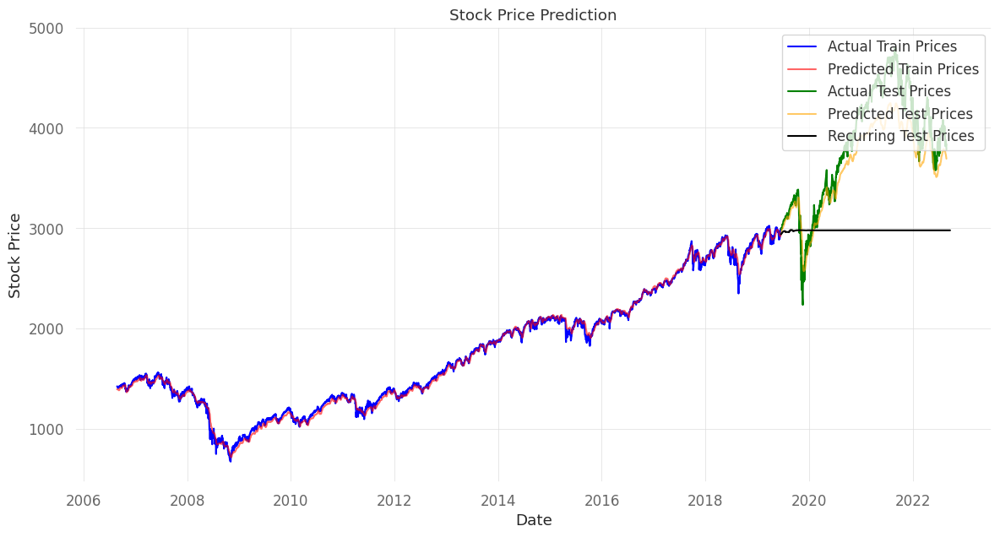

In [250]:
'''
Try 1:
Tring Long term prediction with recursive approach
The answer from first prediction is added to the input sequence of next prediction
'''


feature_columns = ['Adj Close', 'MACD', 'RSI', 'boll_mavg', 'boll_hband', 'boll_lband']
def create_dataset_for_1_step(data, feature_columns = feature_columns, time_step=60):
    rX= []
    rX.append(data.tail(60)[feature_columns].values)
    return np.array(rX).reshape(60,6)

def add_features(data):
    data['MACD'] = ta.trend.MACD(data['Adj Close']).macd()
    data['RSI'] = ta.momentum.RSIIndicator(data['Adj Close']).rsi()
    bollinger = ta.volatility.BollingerBands(data['Adj Close'])
    data['boll_mavg'] = bollinger.bollinger_mavg()
    data['boll_hband'] = bollinger.bollinger_hband()
    data['boll_lband'] = bollinger.bollinger_lband()
    return data

ticker = '^GSPC'
data = yf.download(ticker, start="2006-08-25", end="2022-12-30")

train_size = int(len(data) * 0.8)
test_size = len(data) - train_size
print(train_size, test_size, len(data))
train_ds = data[:train_size]
test_ds = data[train_size:]


PredictionList =[]
recursive_test_data = add_features(train_ds)

for i in range(test_size):
    rec_test_X = create_dataset_for_1_step(recursive_test_data)
    scaled_rec_test_X =  scaler.fit_transform(rec_test_X).reshape(1,60,6)
    single_prediction = model.predict(scaled_rec_test_X)
    single_prediction = single_prediction * scaler.data_range_ + scaler.data_min_
    val = [single_prediction[0,0]][0]
    PredictionList.append(val)
    new_row = pd.DataFrame([val,np.nan,np.nan,np.nan,np.nan,np.nan]).T#columns
    new_row.columns = feature_columns
    recursive_test_data = pd.concat([recursive_test_data, new_row], ignore_index=True)
    recursive_test_data = add_features(recursive_test_data)

recurring_test_rmse = np.sqrt(mean_squared_error(test_ds['Adj Close'], recursive_test_data.tail(test_size)['Adj Close']))
print(recurring_test_rmse)

plt.figure(figsize=(14, 7))
plt.plot(data.index[:len(train_predict)], actual_y_train, label='Actual Train Prices', color='blue')
plt.plot(data.index[:len(train_predict)], train_predict, label='Predicted Train Prices', color='red', alpha=0.6)
plt.plot(data.index[len(train_predict):len(train_predict) + len(test_predict)], actual_y_test, label='Actual Test Prices', color='green')
plt.plot(data.index[len(train_predict):len(train_predict) + len(test_predict)], test_predict, label='Predicted Test Prices', color='orange', alpha=0.6)
plt.plot(data.index[len(train_predict):len(train_predict) + test_size], recursive_test_data.tail(test_size)['Adj Close'], label='Recurring Test Prices', color='black', alpha=1)
plt.legend(loc='upper right')
plt.title('Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

In [251]:
price_prediction_lstm_model = model

### Appendix F : Auto Arima Model


[*********************100%%**********************]  1 of 1 completed


Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=28245.678, Time=7.45 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=28265.469, Time=0.11 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=28253.819, Time=0.15 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=28252.753, Time=0.75 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=28266.171, Time=0.10 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=28250.743, Time=2.98 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=28250.432, Time=1.92 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=28251.130, Time=9.51 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=28251.651, Time=7.11 sec
 ARIMA(1,1,1)(0,0,0)[0] intercept   : AIC=28251.016, Time=3.86 sec
 ARIMA(1,1,3)(0,0,0)[0] intercept   : AIC=28252.527, Time=4.41 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=28252.216, Time=4.73 sec
 ARIMA(3,1,3)(0,0,0)[0] intercept   : AIC=28240.402, Time=10.40 sec
 ARIMA(4,1,3)(0,0,0)[0] intercept   : AIC=28248.615, Time=4.83 sec
 ARIMA(3,1,4)(0,0,

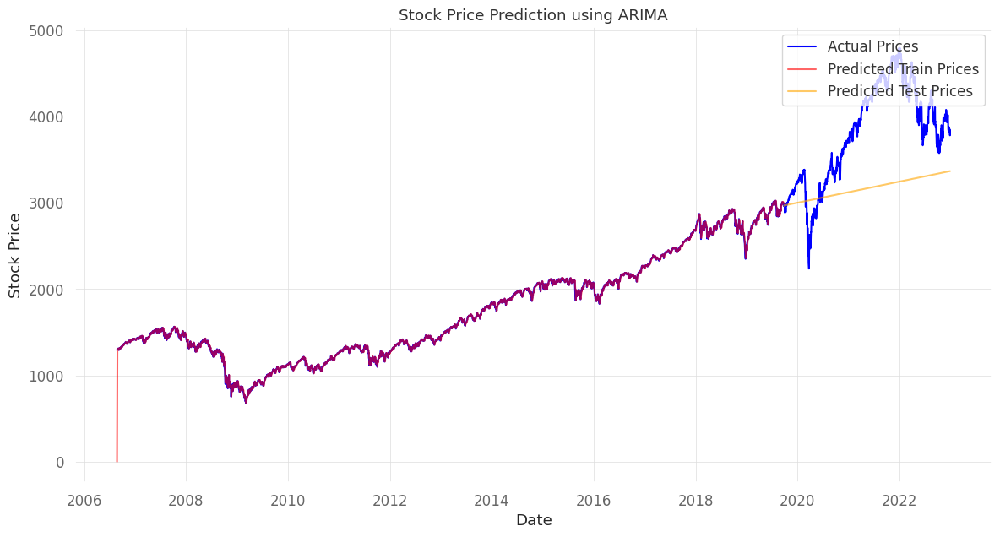

In [252]:
'''
Try 2:
Tring Long term prediction with recursive approach using Auto-ARIMA model
'''

ticker = "^GSPC"  # S&P 500 index
data = yf.download(ticker, start="2006-08-25", end="2022-12-30")

data = data[['Adj Close']]
train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]
auto_arima_model = auto_arima(train['Adj Close'], seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)
print(auto_arima_model.summary())
arima_model = auto_arima_model.fit(train['Adj Close'])
train_predictions = arima_model.predict_in_sample()
test_predictions = arima_model.predict(n_periods=len(test))

train_rmse = np.sqrt(mean_squared_error(train['Adj Close'], train_predictions))
test_rmse = np.sqrt(mean_squared_error(test['Adj Close'], test_predictions))
print(f'Train RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')

plt.figure(figsize=(14, 7))
plt.plot(data.index, data['Adj Close'], label='Actual Prices', color='blue')
plt.plot(train.index, train_predictions, label='Predicted Train Prices', color='red', alpha=0.6)
plt.plot(test.index, test_predictions, label='Predicted Test Prices', color='orange', alpha=0.6)
plt.legend(loc='upper right')
plt.title('Stock Price Prediction using ARIMA')
plt.xlabel('Date')
plt.ylabel('Stock Price')
plt.show()

### Appendix G:Try 1: ARIMA Model

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0] intercept   : AIC=4784.426, Time=5.46 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=10471.517, Time=0.49 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=4785.165, Time=0.60 sec
 ARIMA(0,1,1)(0,0,0)[0] intercept   : AIC=7162.812, Time=2.98 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=10469.517, Time=0.15 sec
 ARIMA(1,1,2)(0,0,0)[0] intercept   : AIC=4788.051, Time=1.42 sec
 ARIMA(2,1,1)(0,0,0)[0] intercept   : AIC=4789.164, Time=3.23 sec
 ARIMA(3,1,2)(0,0,0)[0] intercept   : AIC=4781.124, Time=12.53 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=4722.097, Time=12.11 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=4788.124, Time=1.86 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=4726.341, Time=14.27 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=4786.850, Time=1.42 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=4778.755, Time=2.84 sec
 ARIMA(4,1,2)(0,0,0)[0] intercept   : AIC=4713.857, Time=16.79 sec
 ARIMA(5,1,2)(0,0,0)[0] int

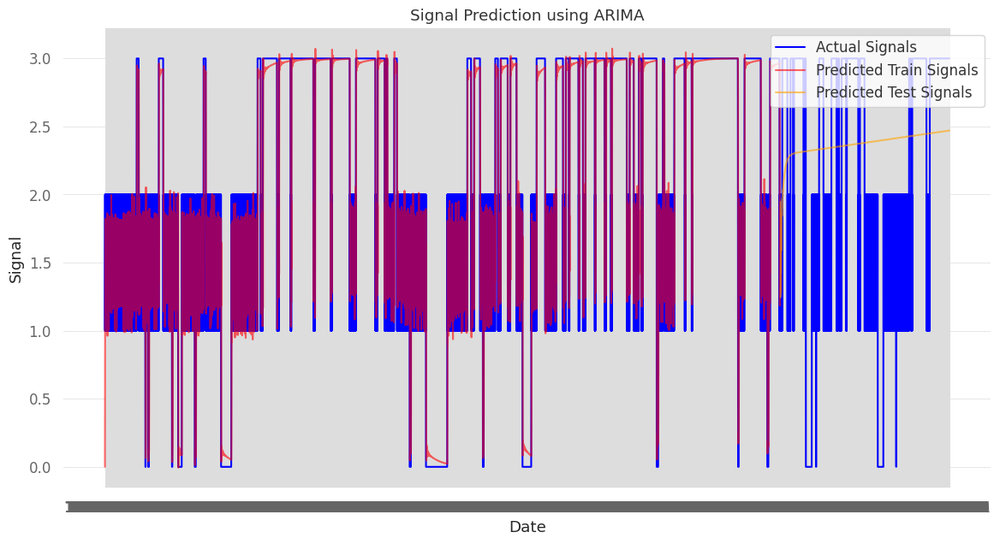


 Match
MIS-MATCHED    1022
MATCHED         261
Name: count, dtype: int64


In [253]:
data = pd.read_csv("Market_States.csv")
data = data[['Date', 'Signal']]
label_encoder = LabelEncoder()
data['Signal_Num'] = label_encoder.fit_transform(data['Signal'])

train_size = int(len(data) * 0.8)
train, test = data[:train_size], data[train_size:]
auto_arima_model = auto_arima(train['Signal_Num'], seasonal=False, trace=True, error_action='ignore', suppress_warnings=True)
print(auto_arima_model.summary())
arima_model = auto_arima_model.fit(train['Signal_Num'])

train_predictions = arima_model.predict_in_sample()
test_predictions = arima_model.predict(n_periods=len(test))
train_rmse = np.sqrt(mean_squared_error(train['Signal_Num'], train_predictions))
test_rmse = np.sqrt(mean_squared_error(test['Signal_Num'], test_predictions))
print(f'Train RMSE: {train_rmse}')
print(f'Test RMSE: {test_rmse}')

predicted_train_labels = label_encoder.inverse_transform(np.round(train_predictions).astype(int))
predicted_test_labels = label_encoder.inverse_transform(np.round(test_predictions).astype(int))
actual_train_labels = label_encoder.inverse_transform(train['Signal_Num'])
actual_test_labels = label_encoder.inverse_transform(test['Signal_Num'])

plt.figure(figsize=(14, 7))
plt.plot(data['Date'], data['Signal_Num'], label='Actual Signals', color='blue')
plt.plot(train['Date'], train_predictions, label='Predicted Train Signals', color='red', alpha=0.6)
plt.plot(test['Date'], test_predictions, label='Predicted Test Signals', color='orange', alpha=0.6)
plt.legend(loc='upper right')
plt.title('Signal Prediction using ARIMA')
plt.xlabel('Date')
plt.ylabel('Signal')
plt.show()

results = pd.DataFrame({
    'Date': test['Date'],
    'Actual': actual_test_labels,
    'Predicted': predicted_test_labels
})


results['Match'] = results.apply(lambda row: 'MATCHED' if row['Predicted'] == row['Actual'] else 'MIS-MATCHED', axis=1)
match_counts5 = results['Match'].value_counts()
print("\n",match_counts5)

all_labels = np.unique(np.concatenate((results['Actual'], results['Predicted'])))
all_labels_sorted = np.sort(all_labels)

### Appendix D: Market Regime Classification with Monthly Data

In [254]:
# Download and pre-process the data
idx_lst = ['^GSPC', '^DJI', '^NDX', '^RUT', 'XLF', 'XLE', 'XLP', '^VIX']
idx_df = yf.download(idx_lst, start='1927-01-01', interval='1mo')
idx_df = idx_df.dropna(axis=0)
idx_df = idx_df['Adj Close']
idx_df.columns = ['Energy', 'Finance', 'Consumer', 'DowJones', 'SP500', 'Nasdaq', 'Russel2000', 'VIX']

# calculate the return
for each in idx_df.columns.tolist():
  idx_df[each] = np.log(idx_df[each]/idx_df[each].shift(1))

idx_df.dropna(inplace=True)

[*********************100%%**********************]  8 of 8 completed


In [255]:
# fit the best model according to BIC
num_state = 4

gmm = GaussianMixture(n_components=4, n_init=100)
gmm.fit(idx_df)

res = gmm.predict(idx_df)

idx_df_res = idx_df.reset_index()
idx_df_res['state'] = res
idx_df_res['state'] = idx_df_res['state'].astype(str)

idx_df_res.groupby('state').describe().T.loc['SP500', :]

state,0,1,2,3
count,49.0,212.0,13.0,19.0
mean,-0.047599,0.012376,0.068986,0.013872
min,-0.185636,-0.085532,-0.009908,-0.054018
25%,-0.087652,-0.006365,0.025757,-0.023756
50%,-0.062229,0.01348,0.058928,0.017937
75%,-0.008369,0.031965,0.089772,0.052679
max,0.076835,0.102307,0.268024,0.092324
std,0.054149,0.031534,0.072284,0.043818


In [256]:
# plot the result from 1999 to 2010
alt.Chart(idx_df_res[idx_df_res.Date.dt.year.between(1999, 2010)]).mark_bar().encode(
    x = 'Date',
    color = alt.Color('state', scale=alt.Scale(range=['lightblue', 'grey', 'orange', 'red']))
).properties(
    width = 700,
    height = 100
)

alt.Chart(...)

In [257]:
# plot the result from 2010 to 2024
alt.Chart(idx_df_res[idx_df_res.Date.dt.year.between(2011, 2024)]).mark_bar().encode(
    x = 'Date',
    color = alt.Color('state', scale=alt.Scale(range=['lightblue', 'grey', 'orange', 'red']))
).properties(
    width = 700,
    height = 100
)

alt.Chart(...)